In [1]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from scipy.stats import levy_stable
import torchsde
#画热图
import seaborn as sns

In [2]:
def setup_seed(seed):
      torch.manual_seed(seed)
      torch.cuda.manual_seed_all(seed)
      np.random.seed(seed)
      # random.seed(seed)
      torch.backends.cudnn.deterministic = True

In [3]:
setup_seed(2)

In [4]:
data = pd.read_csv(".\Data set\shangzheng50.csv")

In [5]:
data=data[['date','code','open','close','high','low','volume']]

In [6]:
data

,date,code,open,close,high,low,volume
0,2004-01-02,sz50,997.00,1011.35,1021.57,993.89,8064650.0
1,2004-01-05,sz50,1008.28,1060.80,1060.90,1008.28,14468200.0
2,2004-01-06,sz50,1059.14,1075.66,1086.69,1059.09,16991300.0
3,2004-01-07,sz50,1075.56,1086.30,1095.84,1070.98,13729400.0
4,2004-01-08,sz50,1087.68,1102.66,1108.29,1082.51,10780400.0
...,...,...,...,...,...,...,...
4189,2021-03-31,sz50,3573.86,3539.37,3573.86,3518.17,29985299.0
4190,2021-04-01,sz50,3547.46,3582.65,3586.36,3545.09,21357739.0
4191,2021-04-02,sz50,3592.88,3616.76,3616.80,3583.04,23396735.0
4192,2021-04-06,sz50,3624.80,3594.71,3624.80,3581.76,17974469.0


In [7]:
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['date']= pd.to_datetime(data['date']) 
data.head()

,date,code,open,close,high,low,volume
0,2004-01-02,sz50,997.00,1011.35,1021.57,993.89,8064650.0
1,2004-01-05,sz50,1008.28,1060.80,1060.90,1008.28,14468200.0
2,2004-01-06,sz50,1059.14,1075.66,1086.69,1059.09,16991300.0
3,2004-01-07,sz50,1075.56,1086.30,1095.84,1070.98,13729400.0
4,2004-01-08,sz50,1087.68,1102.66,1108.29,1082.51,10780400.0


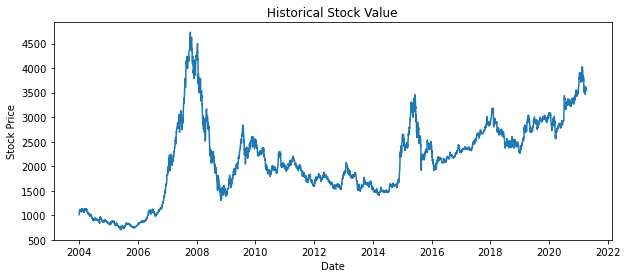

In [8]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['date'],data['close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# Data Cleaning and Splitting

In [9]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['date']
stk_data['Open'] = data['open']
stk_data['High'] = data['high']
stk_data['Low'] = data['low']
stk_data['Close'] = data['close']
stk_data.head()

,Date,Open,High,Low,Close
0,2004-01-02,997.00,1021.57,993.89,1011.35
1,2004-01-05,1008.28,1060.90,1008.28,1060.80
2,2004-01-06,1059.14,1086.69,1059.09,1075.66
3,2004-01-07,1075.56,1095.84,1070.98,1086.30
4,2004-01-08,1087.68,1108.29,1082.51,1102.66


In [10]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

In [11]:
#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data

In [12]:
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (3356, 1) 
 Testing set shape: (838, 1)


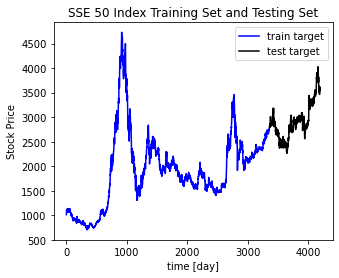

In [13]:
## show predictions
plt.figure(figsize=(5, 4))
plt.plot(np.arange(training_set.shape[0]), training_set, color='blue', label='train target')
plt.plot(np.arange(training_set.shape[0],training_set.shape[0]+testing_set.shape[0]),testing_set, color='black', label='test target')
plt.title('SSE 50 Index Training Set and Testing Set')
plt.xlabel('time [day]')
plt.ylabel('Stock Price')
plt.legend(loc='best');

In [14]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [15]:
#training data 处理
training_set_scaled1=training_set_scaled.flatten()#将数组降一维
training_set_scaled2=pd.DataFrame(columns=["closescale"],data=training_set_scaled1)#将array转为dataframe
training_set_scaled21=stk_data.loc[0:(len(training_set_scaled2)-1),'Date'].to_frame()#提取相应日期

In [16]:
training_set_scaled3= pd.concat([training_set_scaled21,training_set_scaled2],axis=1)

In [17]:
#testing data 处理
testing_set_scaled1=testing_set_scaled.flatten()#将数组降一维
testing_set_scaled2=pd.DataFrame(columns=["closescale"],data=testing_set_scaled1)#将array转为dataframe
testing_set_scaled21=stk_data.loc[len(training_set_scaled3):,'Date'].to_frame()#提取相应日期

In [18]:
testing_set_scaled21=pd.DataFrame(columns=["Date"],data=testing_set_scaled21.values)
testing_set_scaled3= pd.concat([testing_set_scaled21,testing_set_scaled2],axis=1)

# 利用相空间重构方法创建数据

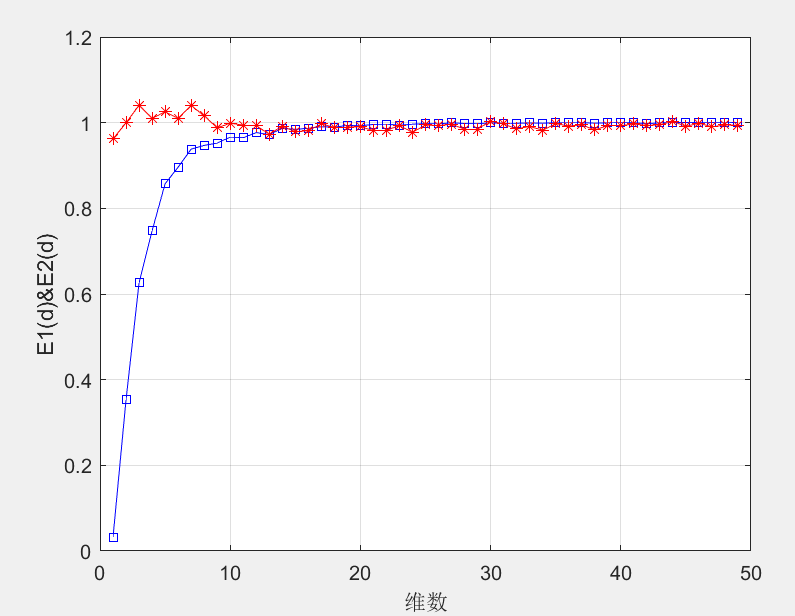

相空间重构数据

In [19]:
# data为时间序列，tau为重构的时延，d为重构的维数，T为直接预测的步数
def PhaSpaRecon(df,tau,d,T):
    data = np.array(df)[:, 1]
    date = np.array(df)[:, 0]
    lens = len(data)
    if (lens - T - (d-1) * tau) < 1:
        print("error: delay time or the embedding dimension is too large")
    else:
        Xn1 = np.zeros((d, lens-(d-1)*tau-1))
        for i in range(0, d):
            Xn1[i, :] = data[i*tau:i*tau+lens-(d-1)*tau-1]
            # for j in range(i*tau, i*tau+lens-(d-1)*tau-1):
            #     Xn[i, j] = data[j]
        Yn1 = data[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn1_date = date[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn = Yn1.reshape((len(Yn1), 1))
        Yn_date = Yn1_date.reshape((len(Yn1_date), 1))
        Yn = pd.DataFrame(Yn)
        Yn_date = pd.DataFrame(Yn_date)
        Y = pd.concat([Yn_date, Yn],axis=1)
        Xn = Xn1.T #reshape((Xn1.shape[1], Xn1.shape[0]))
        Xn = pd.DataFrame(Xn)
        X = pd.concat([Xn, Yn],axis=1)
    return Xn, Yn, Y, X

In [20]:
Xn, Yn,Y,X = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=1)

In [21]:
Xn

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-1.202782,-1.137260,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,...,-1.096278,-1.081411,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143
1,-1.137260,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,...,-1.081411,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851
2,-1.117571,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,...,-1.047637,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023
3,-1.103473,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,-1.128316,...,-1.048352,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023,-1.046524
4,-1.081795,-1.109448,-1.063060,-1.082219,-1.112191,-1.119797,-1.106984,-1.084525,-1.128316,-1.096278,...,-1.056064,-1.039461,-1.057548,-1.071990,-1.093124,-1.090143,-1.053851,-1.054023,-1.046524,-1.055666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,1.024806,1.018353,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,...,0.998027,1.024196,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944
3329,1.018353,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,...,1.024196,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564
3330,0.998703,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,0.983744,...,1.028781,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564,1.080231
3331,0.992794,1.000479,0.995854,0.985175,1.002294,1.006931,1.009051,1.006852,0.983744,0.983386,...,1.044654,1.059004,1.052419,1.069988,1.065868,1.104929,1.108944,1.084564,1.080231,1.105777


In [22]:
train= X.values
x_train1=train[:,0:23]
y_train1=train[:,23]

In [23]:
X1n, Y1n, Y1,X1 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=1)

In [24]:
test= X1.values
x_test1=test[:,0:23]
y_test1=test[:,23]

In [25]:
print('x_train1 shape:', x_train1.shape, '\n', 'x_test1 shape:', x_test1.shape, '\n', 'y_train1 shape:', y_train1.shape, '\n', 'y_test1 shape:', y_test1.shape)

x_train1 shape: (3333, 23) 
 x_test1 shape: (815, 23) 
 y_train1 shape: (3333,) 
 y_test1 shape: (815,)


In [26]:
ts_  = np.arange(0, y_train1.shape[0])
ts_ext_ = np.arange(y_train1.shape[0], y_train1.shape[0] + y_test1.shape[0])
ts_full_ = np.arange(0, y_train1.shape[0] + y_test1.shape[0])

In [27]:
# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

ts_ shape: (3333,) 
 ts_ext_ shape: (815,) 
 ts_full_ shape: (4148,)


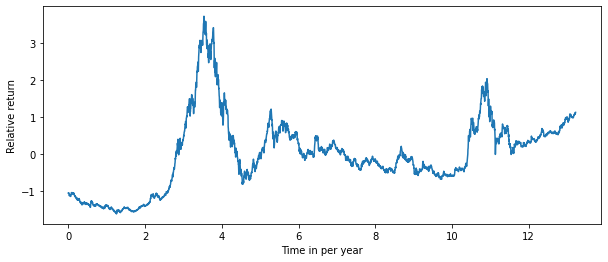

In [28]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train1)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [29]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train1.astype(np.float64)
ys_ = y_train1.astype(np.float64)
xs_ext_ = x_test1.astype(np.float64)
ys_ext_ = y_test1.astype(np.float64)#object转float
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext

In [30]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

In [31]:
X21n, Y21n,Y21,X21 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=2)
X22n, Y22n, Y22,X22 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=2)

In [32]:
train2= X21.values
train2=np.delete(train2,-1, axis=0)#减一是因为预测第二天T=2
x_train2=train2[:,0:23]
y_train2=train2[:,23]
test2= X22.values
test2=np.delete(test2,-1, axis=0)#减一是因为预测第二天T=2
x_test2=test2[:,0:23]
y_test2=test2[:,23]

In [33]:
X31n, Y31n,Y31,X31 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=3)
X32n, Y32n, Y32,X32 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=3)

In [34]:
train3= X31.values
train3=np.delete(train3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_train3=train3[:,0:23]
y_train3=train3[:,23]
test3= X32.values
test3=np.delete(test3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_test3=test3[:,0:23]
y_test3=test3[:,23]

In [35]:
X41n, Y41n,Y41,X41 = PhaSpaRecon(training_set_scaled3, tau=1, d=23, T=4)
X42n, Y42n, Y42,X42 = PhaSpaRecon(testing_set_scaled3, tau=1, d=23, T=4)

In [36]:
train4= X41.values
train4=np.delete(train4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_train4=train4[:,0:23]
y_train4=train4[:,23]
test4= X42.values
test4=np.delete(test4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_test4=test4[:,0:23]
y_test4=test4[:,23]

# SDE Definition

In [37]:
sequence_length: int = 23
alpha, beta = 1.5, 0

In [38]:
__all__ = ['SDENet1']

class Drift1(nn.Module):
    def __init__(self):
        super(Drift1, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion1(nn.Module):
    def __init__(self):
        super(Diffusion1, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x): 
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet1(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet1, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift1()
        self.diffusion = Diffusion1()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out1=out
            Drift1=self.drift(t, out)
            return Drift1,Out1
            
        else:
            t = 0
            final_out1 = self.diffusion(t, out.detach())  
            return final_out1

def test():
    model = SDENet1(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model1 = test()
    num_params = count_parameters(model1)
    print(num_params)

3605


In [39]:
__all__ = ['SDENet2']

class Drift2(nn.Module):
    def __init__(self):
        super(Drift2, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion2(nn.Module):
    def __init__(self):
        super(Diffusion2, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet2(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet2, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift2()
        self.diffusion = Diffusion2()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out1=Out1.detach().numpy()#减一是因为预测后一天T=1和T=2差一天
#        Out1=np.delete(Out1,-1, axis=0)
#        Out1=torch.from_numpy(Out1)
#        out=torch.cat((out,Out1), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out2=out
            Drift2=self.drift(t, out)
            return Drift2,Out2
            
        else:
            t = 0
            final_out2 = self.diffusion(t, out.detach())  
            return final_out2

def test():
    model2 = SDENet2(layer_depth=6)
    return model2  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model2 = test()
    num_params = count_parameters(model2)
    print(num_params)

3605


In [40]:
__all__ = ['SDENet3']

class Drift3(nn.Module):
    def __init__(self):
        super(Drift3, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion3(nn.Module):
    def __init__(self):
        super(Diffusion3, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet3(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet3, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift3()
        self.diffusion = Diffusion3()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out2=Out2.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out2=np.delete(Out2,-1, axis=0)
#        Out2=torch.from_numpy(Out2)
#        out=torch.cat((out,Out2), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out3=out
            Drift3=self.drift(t, out)
            return Drift3,Out3
            
        else:
            t = 0
            final_out3 = self.diffusion(t, out.detach())  
            return final_out3

def test():
    model3 = SDENet3(layer_depth=6)
    return model3  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model3 = test()
    num_params = count_parameters(model3)
    print(num_params)

3605


In [41]:
__all__ = ['SDENet4']

class Drift4(nn.Module):
    def __init__(self):
        super(Drift4, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion4(nn.Module):
    def __init__(self):
        super(Diffusion4, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet4(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet4, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift4()
        self.diffusion = Diffusion4()
#        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(sequence_length, 8))#将激活层与线性层连接一起
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out3=Out3.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out3=np.delete(Out3,-1, axis=0)
#        Out3=torch.from_numpy(Out3)
#        out=torch.cat((out,Out3), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out4=out
            Drift4=self.drift(t, out)
#            final_out4 = self.fc_layers(out) 
#            mean41 = final_out[:,0]
#            mean42 = final_out[:,1]
#            mean43 = final_out[:,2]
#            mean44 = final_out[:,3]
#            sigma41 = F.softplus(final_out[:,5])+1e-3
#            sigma42 = F.softplus(final_out[:,6])+1e-3
#            sigma43 = F.softplus(final_out[:,7])+1e-3
#            sigma44 = F.softplus(final_out[:,8])+1e-3
            return Drift4,Out4
            
        else:
            t = 0
            final_out4 = self.diffusion(t, out.detach())  
            return final_out4

def test():
    model4 = SDENet4(layer_depth=6)
    return model4  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model4 = test()
    num_params = count_parameters(model4)
    print(num_params)

3605


# SDE_Regression

DataSet loading

In [42]:
X_train1 = torch.from_numpy(x_train1.astype(np.float64)).float()
X_test1 = torch.from_numpy(x_test1.astype(np.float64)).float()
Y_train1 = torch.from_numpy(y_train1.astype(np.float64)).float()
Y_test1 = torch.from_numpy(y_test1.astype(np.float64)).float()
print('X_train1.shape:', X_train1.shape, '\nX_test1.shape:', X_test1.shape, '\nY_train1.shape:', Y_train1.shape, '\nY_test1.shape:', Y_test1.shape)

X_train1.shape: torch.Size([3333, 23]) 
X_test1.shape: torch.Size([815, 23]) 
Y_train1.shape: torch.Size([3333]) 
Y_test1.shape: torch.Size([815])


In [43]:
X_train2 = torch.from_numpy(x_train2.astype(np.float64)).float()
X_test2 = torch.from_numpy(x_test2.astype(np.float64)).float()
Y_train2 = torch.from_numpy(y_train2.astype(np.float64)).float()
Y_test2 = torch.from_numpy(y_test2.astype(np.float64)).float()
print('X_train2.shape:', X_train2.shape, '\nX_test2.shape:', X_test2.shape, '\nY_train2.shape:', Y_train2.shape, '\nY_test2.shape:', Y_test2.shape)

X_train2.shape: torch.Size([3332, 23]) 
X_test2.shape: torch.Size([814, 23]) 
Y_train2.shape: torch.Size([3332]) 
Y_test2.shape: torch.Size([814])


In [44]:
X_train3 = torch.from_numpy(x_train3.astype(np.float64)).float()
X_test3 = torch.from_numpy(x_test3.astype(np.float64)).float()
Y_train3 = torch.from_numpy(y_train3.astype(np.float64)).float()
Y_test3 = torch.from_numpy(y_test3.astype(np.float64)).float()
print('X_train3.shape:', X_train3.shape, '\nX_test3.shape:', X_test3.shape, '\nY_train3.shape:', Y_train3.shape, '\nY_test3.shape:', Y_test3.shape)

X_train3.shape: torch.Size([3331, 23]) 
X_test3.shape: torch.Size([813, 23]) 
Y_train3.shape: torch.Size([3331]) 
Y_test3.shape: torch.Size([813])


In [45]:
X_train4 = torch.from_numpy(x_train4.astype(np.float64)).float()
X_test4 = torch.from_numpy(x_test4.astype(np.float64)).float()
Y_train4 = torch.from_numpy(y_train4.astype(np.float64)).float()
Y_test4 = torch.from_numpy(y_test4.astype(np.float64)).float()
print('X_train4.shape:', X_train4.shape, '\nX_test4.shape:', X_test4.shape, '\nY_train4.shape:', Y_train4.shape, '\nY_test4.shape:', Y_test4.shape)

X_train4.shape: torch.Size([3330, 23]) 
X_test4.shape: torch.Size([812, 23]) 
Y_train4.shape: torch.Size([3330]) 
Y_test4.shape: torch.Size([812])


Arguments

In [46]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=100, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size1 = y_train1.squeeze().shape[0]
batch_size2 = y_train2.squeeze().shape[0]
batch_size3 = y_train3.squeeze().shape[0]
batch_size4 = y_train4.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=100, gpu=0, lr=0.0001, lr2=0.01, seed=0)


# Model

In [47]:
from sklearn.metrics import mean_squared_error
net1 = SDENet1(25)
net1 = net1.to(device)
net2 = SDENet2(25)
net2 = net2.to(device)
net3 = SDENet3(25)
net3 = net3.to(device)
net4 = SDENet4(25)
net4 = net4.to(device)
attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
criterion = nn.BCELoss()

real_label = 0
fake_label = 1
optimizer_F = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()},{'params': net2.downsampling_layers.parameters()},{'params': net2.drift.parameters()},{'params': net3.downsampling_layers.parameters()},{'params': net3.drift.parameters()} ,{'params': net4.downsampling_layers.parameters()},{'params': net4.drift.parameters()},{'params': attention.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F1 = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F2 = optim.SGD([ {'params': net2.downsampling_layers.parameters()}, {'params': net2.drift.parameters}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F3 = optim.SGD([ {'params': net3.downsampling_layers.parameters()}, {'params': net3.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F4 = optim.SGD([ {'params': net4.downsampling_layers.parameters()}, {'params': net4.drift.parameters()},{'params': net4.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
optimizer_G = optim.SGD([ {'params': net1.diffusion.parameters()},{'params': net2.diffusion.parameters()},{'params': net3.diffusion.parameters()},{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G1 = optim.SGD([ {'params': net1.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G2 = optim.SGD([ {'params': net2.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G3 = optim.SGD([{'params': net3.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G4 = optim.SGD([{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net1.train()
    net2.train()
    net3.train()
    net4.train()
#    if epoch == 0:
#        net.sigma = 0.1
#    if epoch == 30:
#        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs1, targets1 = X_train1, Y_train1[0:-3]
        inputs2, targets2 = X_train2, Y_train2[0:-2]
        inputs3, targets3 = X_train3, Y_train3[0:-1]
        inputs4, targets4 = X_train4, Y_train4
        # print(inputs.shape)
        inputs1, targets1 = inputs1.to(device), targets1.to(device)
        #optimizer_F1.zero_grad()
        inputs2, targets2 = inputs2.to(device), targets2.to(device)
        #optimizer_F2.zero_grad()
        inputs3, targets3 = inputs3.to(device), targets3.to(device)
        #optimizer_F3.zero_grad()
        inputs4, targets4 = inputs4.to(device), targets4.to(device)
        #optimizer_F4.zero_grad()
        optimizer_F.zero_grad()
        Drift1,Out1 = net1(inputs1)
        Drift2,Out2 = net2(inputs2)
        Drift3,Out3 = net3(inputs3)
        Drift4,Out4 = net4(inputs4)
        #print(Drift)
        #print(Out4.shape)
        Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
        #attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
        final_out=attention(Out)
        mean41 = final_out[:,0]
        mean42 = final_out[:,1]
        mean43 = final_out[:,2]
        mean44 = final_out[:,3]
        sigma41 = F.softplus(final_out[:,4])+1e-3
        sigma42 = F.softplus(final_out[:,5])+1e-3
        sigma43 = F.softplus(final_out[:,6])+1e-3
        sigma44 = F.softplus(final_out[:,7])+1e-3       
        loss1 = nll_loss(targets1, mean41, sigma41)
        loss2 = nll_loss(targets2, mean42, sigma42)
        loss3 = nll_loss(targets3, mean43, sigma43)
        loss4 = nll_loss(targets4, mean44, sigma44)
        loss=loss1+loss2+loss3+loss4
        loss.backward()
        optimizer_F.step()
        train_loss += loss.item()
        #loss1.backward()
        #nn.utils.clip_grad_norm_(net1.parameters(), 100.)
        #optimizer_F1.step()
        #loss2 = nll_loss(targets2, mean42, sigma42)
        #loss2.backward()
        #nn.utils.clip_grad_norm_(net2.parameters(), 100.)
        #optimizer_F2.step()
        #loss3 = nll_loss(targets3, mean43, sigma43)
        #loss3.backward()
        #nn.utils.clip_grad_norm_(net3.parameters(), 100.)
        #optimizer_F3.step()
        #loss4 = nll_loss(targets4, mean44, sigma44)
        # loss = criterion(targets, mean)
        #loss4.backward()
        #nn.utils.clip_grad_norm_(net4.parameters(), 100.)
        #optimizer_F4.step()
        

        label1 = torch.full((batch_size1,1), real_label, device=device)
        label2 = torch.full((batch_size2,1), real_label, device=device)
        label3 = torch.full((batch_size3,1), real_label, device=device)
        label4 = torch.full((batch_size4,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in1 = net1(inputs1, training_diffusion=True)
        predict_in2 = net2(inputs2, training_diffusion=True)
        predict_in3 = net3(inputs3, training_diffusion=True)
        predict_in4 = net4(inputs4, training_diffusion=True)
        loss_in = criterion(predict_in1, label1.float())+criterion(predict_in2, label2.float())+criterion(predict_in3, label3.float())+criterion(predict_in4, label4.float())
        loss_in.backward()
        label1.fill_(fake_label)
        label2.fill_(fake_label)
        label3.fill_(fake_label)
        label4.fill_(fake_label)

        inputs_out1 = 2 * torch.randn(batch_size1, sequence_length, device = device) + inputs1
        inputs_out2 = 2 * torch.randn(batch_size2, sequence_length, device = device) + inputs2
        inputs_out3 = 2 * torch.randn(batch_size3, sequence_length, device = device) + inputs3
        inputs_out4 = 2 * torch.randn(batch_size4, sequence_length, device = device) + inputs4
        predict_out1 = net1(inputs_out1, training_diffusion=True)
        predict_out2 = net2(inputs_out2, training_diffusion=True)
        predict_out3 = net3(inputs_out3, training_diffusion=True)
        predict_out4 = net4(inputs_out4, training_diffusion=True)
        loss_out = criterion(predict_out1, label1.float())+criterion(predict_out2, label2.float())+criterion(predict_out3, label3.float())+criterion(predict_out4, label4.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
#    plt.figure(figsize = (5, 4))
#    plt.subplot(221)
    plt.figure(1,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean41.cpu().detach().numpy()),label = 'prediction(t+1)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean41.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), scaler.inverse_transform(mean41.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(222)
    plt.figure(2,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean42.cpu().detach().numpy()),label = 'prediction(t+2)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean42.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), scaler.inverse_transform(mean42.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)    
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(223)
    plt.figure(3,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean43.cpu().detach().numpy()),label = 'prediction(t+3)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean43.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), scaler.inverse_transform(mean43.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
    plt.ylim(700,5000)
    plt.legend()
#    plt.subplot(224)
    plt.figure(4,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean44.cpu().detach().numpy()),label = 'prediction(t+4)')
    plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean44.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), scaler.inverse_transform(mean44.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
    plt.ylim(700,5000)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.legend()
    plt.show()
    loss11=mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy())
    loss22=mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy())
    loss33=mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy())
    loss44=mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    #return mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy()),mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy()),mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy()),mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    #return mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    return loss11,loss22,loss33,loss44

In [48]:
# Testing
def test(epoch):
    net1.eval()
    net2.eval()
    net3.eval()
    net4.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs1, targets1 = X_test1, Y_test1[0:-3]
            inputs2, targets2 = X_test2, Y_test2[0:-2]
            inputs3, targets3 = X_test3, Y_test3[0:-1]
            inputs4, targets4 = X_test4, Y_test4
            inputs1, targets1 = inputs1.to(device), targets1.to(device)
            inputs2, targets2 = inputs2.to(device), targets2.to(device)
            inputs3, targets3 = inputs3.to(device), targets3.to(device)
            inputs4, targets4 = inputs4.to(device), targets4.to(device)
            current_mean1 = 0
            current_mean2 = 0
            current_mean3 = 0
            current_mean4 = 0
            current_sigma1 = 0
            current_sigma2 = 0
            current_sigma3 = 0
            current_sigma4 = 0
            for i in range(1):
                #mean, sigma ,Drift= net(inputs)
                Drift1,Out1 = net1(inputs1)
                Drift2,Out2 = net2(inputs2)
                Drift3,Out3 = net3(inputs3)
                Drift4,Out4 = net4(inputs4)
                Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
                final_out=attention(Out)
                mean41 = final_out[:,0]
                mean42 = final_out[:,1]
                mean43 = final_out[:,2]
                mean44 = final_out[:,3]
                sigma41 = F.softplus(final_out[:,4])+1e-3
                sigma42 = F.softplus(final_out[:,5])+1e-3
                sigma43 = F.softplus(final_out[:,6])+1e-3
                sigma44 = F.softplus(final_out[:,7])+1e-3 
                current_mean1 = current_mean1 + mean41
                current_mean2 = current_mean2 + mean42
                current_mean3 = current_mean3 + mean43
                current_mean4 = current_mean4 + mean44
                current_sigma1= current_sigma1+ sigma41
                current_sigma2= current_sigma2+ sigma42
                current_sigma3= current_sigma3+ sigma43
                current_sigma4= current_sigma4+ sigma44
            current_mean1 = current_mean1/1
            current_mean2 = current_mean2/1
            current_mean3 = current_mean3/1
            current_mean4 = current_mean4/1
            current_sigma1 = current_sigma1/1
            current_sigma2 = current_sigma2/1
            current_sigma3 = current_sigma3/1
            current_sigma4 = current_sigma4/1            
            loss1 = mse(targets1, current_mean1)
            loss2 = mse(targets2, current_mean2)
            loss3 = mse(targets3, current_mean3)
            loss4 = mse(targets4, current_mean4)
            loss=loss1+loss2+loss3+loss4
#            plt.figure(figsize = (8, 4))
#            plt.subplot(221)
            plt.figure(1,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean1.cpu().detach().numpy()),label = 'prediction(t+1)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean1.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean1.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(222)
            plt.figure(2,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean2.cpu().detach().numpy()),label = 'prediction(t+2)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean2.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean2.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(223)
            plt.figure(3,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean3.cpu().detach().numpy()),label = 'prediction(t+3)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean3.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean3.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
            plt.ylim(2000,4800)
            plt.legend()
#            plt.subplot(224)
            plt.figure(4,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean4.cpu().detach().numpy()),label = 'prediction(t+4)')
#             plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean4.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())), 
#                              scaler.inverse_transform(current_mean4.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
            plt.ylim(2000,4800)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.legend()
            plt.show()
            test_loss += loss.item()
    
            loss11 = mean_squared_error(Y_test1.numpy()[0:-3], current_mean1.cpu().detach().numpy()) 
            loss22 = mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy())
            loss33 = mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())
            loss44 = mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return loss11,loss22,loss33,loss44
    #return loss11, current_mean1.cpu().detach().numpy()), mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy()),mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy()),mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    #return mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())

# Run Epochs


Epoch: 1


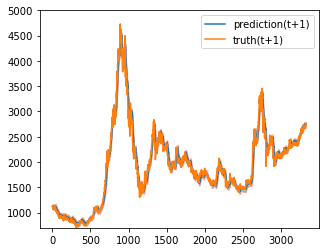

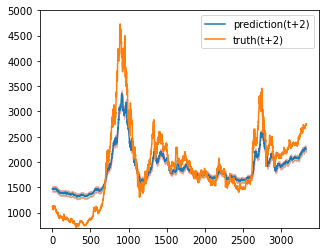

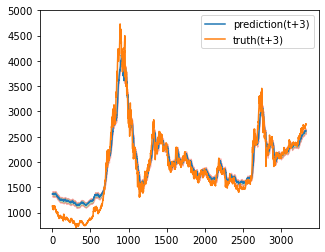

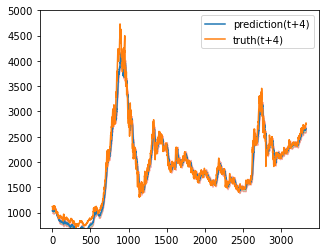

Train epoch:1 	Loss: 0.620925| Loss_in: 2.370535| Loss_out: 1.351488


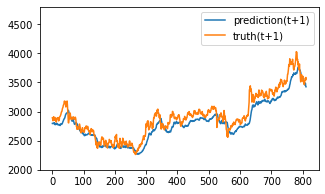

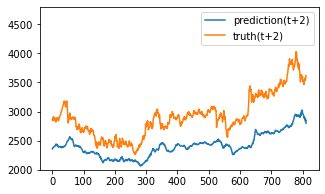

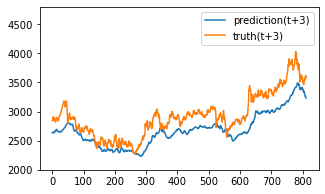

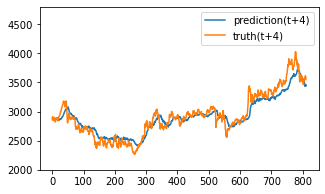

Test epoch:1 	Loss: 0.846476

Epoch: 2


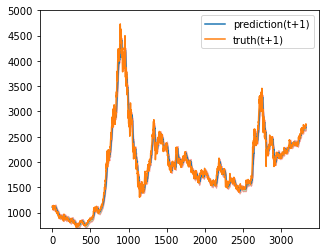

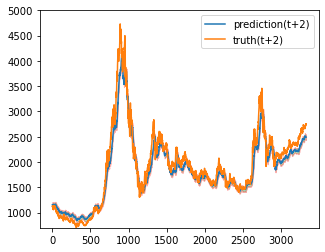

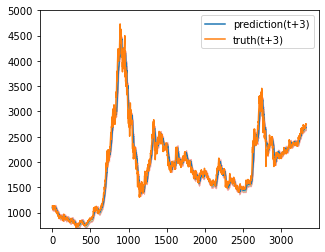

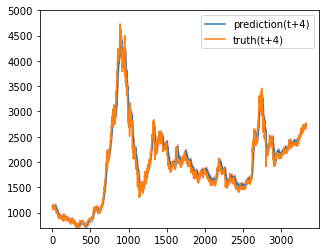

Train epoch:2 	Loss: -3.467095| Loss_in: 0.831061| Loss_out: 0.438637


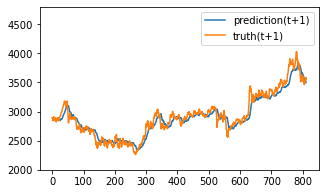

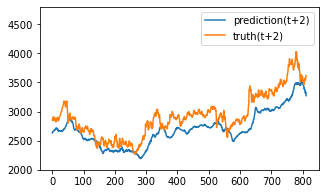

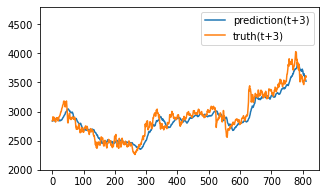

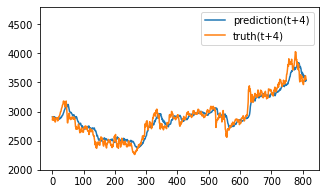

Test epoch:2 	Loss: 0.429971

Epoch: 3


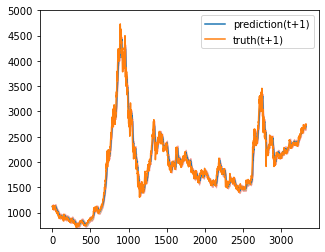

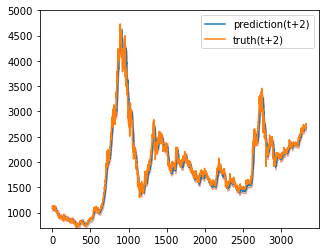

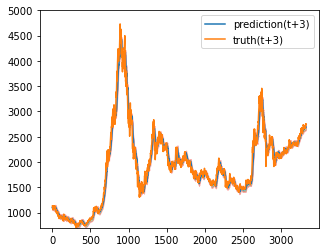

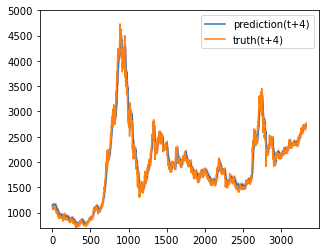

Train epoch:3 	Loss: -7.064231| Loss_in: 0.396747| Loss_out: 0.219311


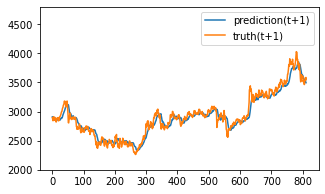

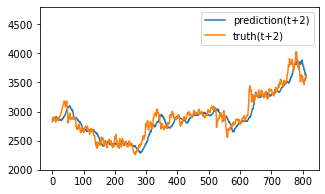

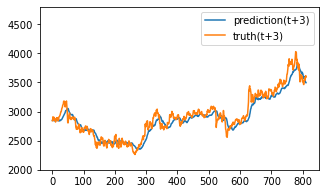

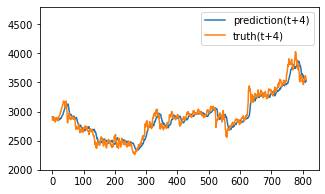

Test epoch:3 	Loss: 0.289277

Epoch: 4


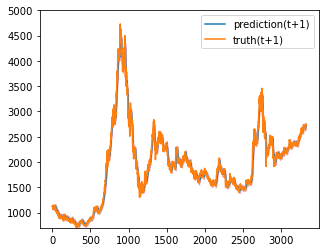

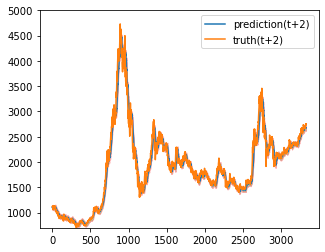

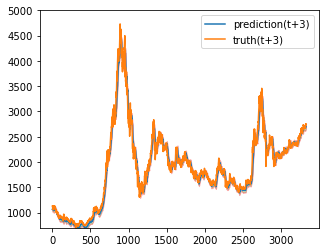

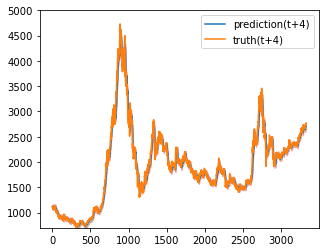

Train epoch:4 	Loss: -9.293396| Loss_in: 0.248674| Loss_out: 0.144266


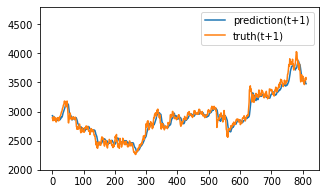

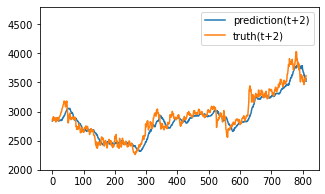

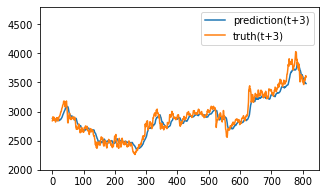

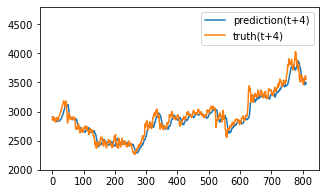

Test epoch:4 	Loss: 0.271110

Epoch: 5


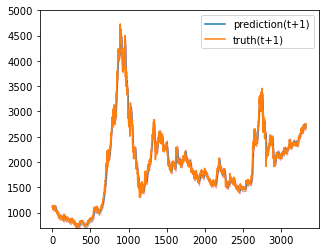

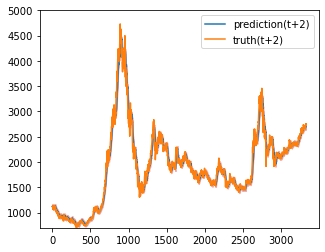

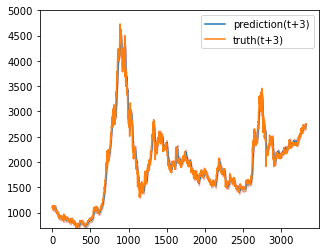

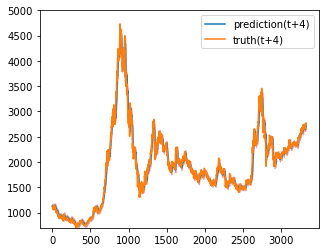

Train epoch:5 	Loss: -10.228445| Loss_in: 0.176892| Loss_out: 0.107604


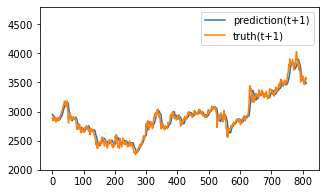

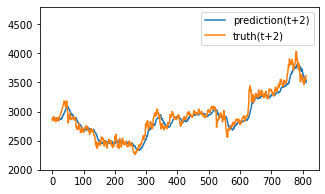

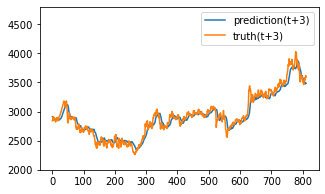

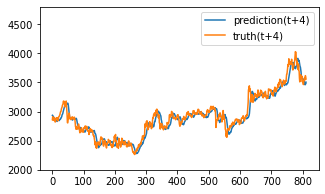

Test epoch:5 	Loss: 0.247355

Epoch: 6


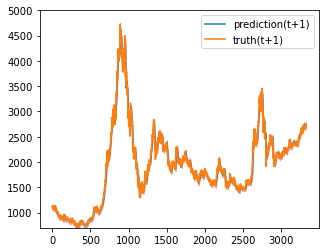

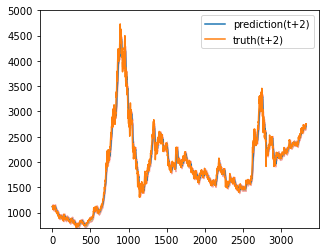

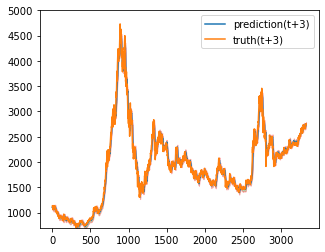

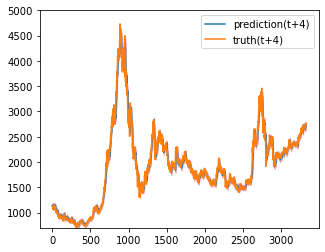

Train epoch:6 	Loss: -11.104345| Loss_in: 0.135400| Loss_out: 0.085492


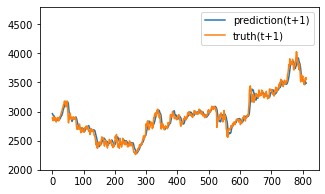

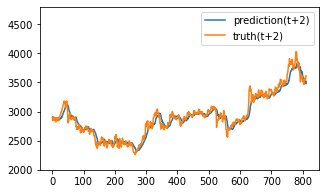

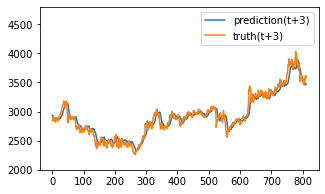

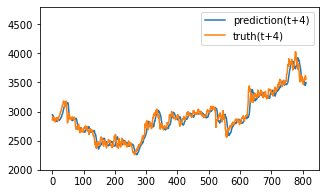

Test epoch:6 	Loss: 0.234353

Epoch: 7


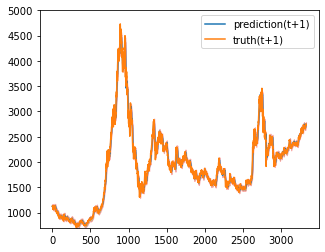

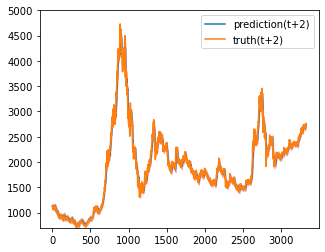

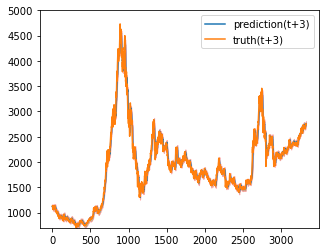

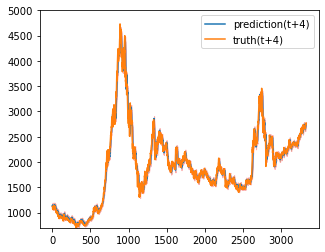

Train epoch:7 	Loss: -11.080619| Loss_in: 0.112502| Loss_out: 0.071807


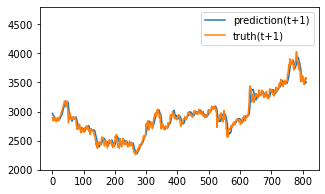

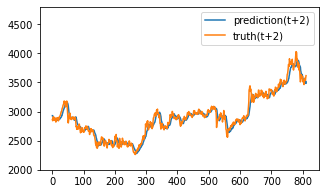

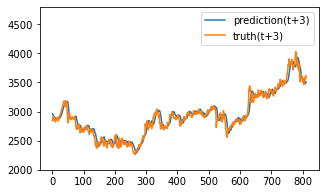

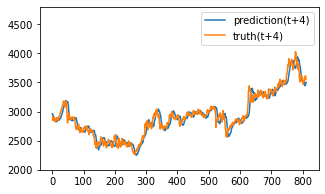

Test epoch:7 	Loss: 0.221730

Epoch: 8


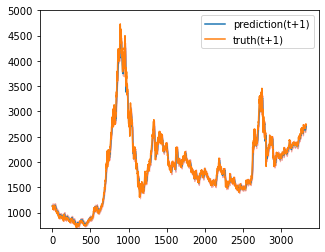

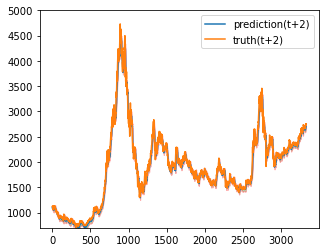

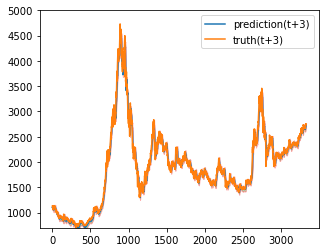

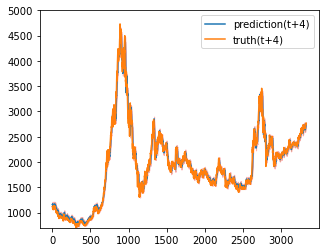

Train epoch:8 	Loss: -11.571725| Loss_in: 0.092392| Loss_out: 0.063677


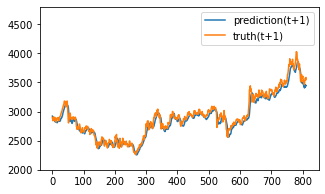

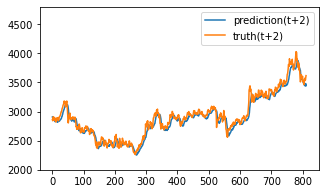

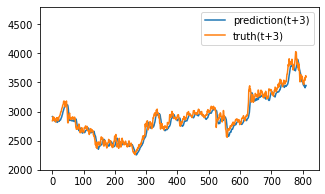

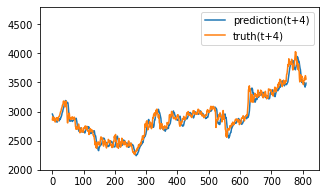

Test epoch:8 	Loss: 0.235199

Epoch: 9


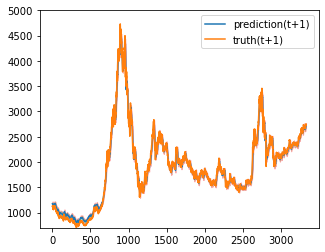

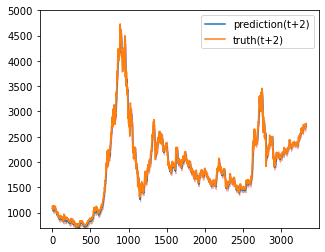

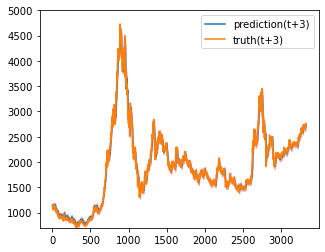

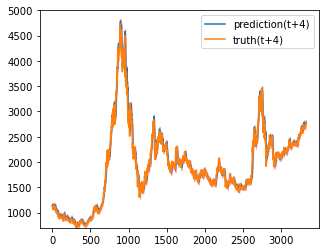

Train epoch:9 	Loss: -12.414636| Loss_in: 0.079942| Loss_out: 0.057621


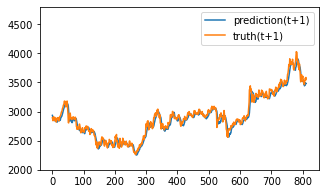

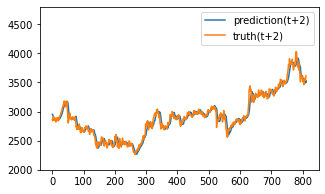

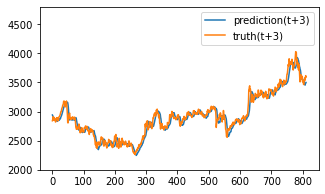

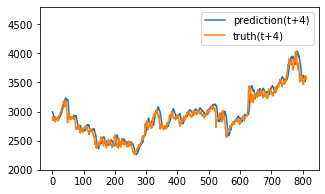

Test epoch:9 	Loss: 0.220389

Epoch: 10


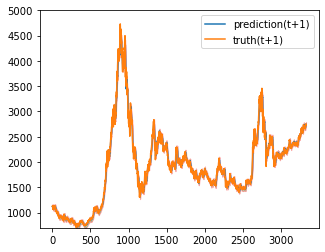

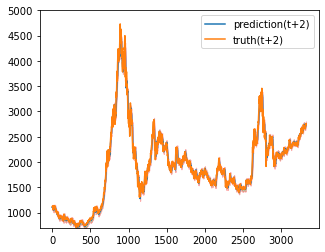

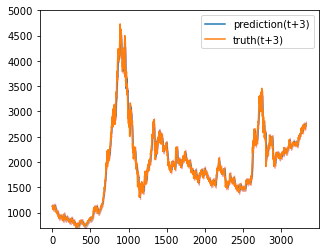

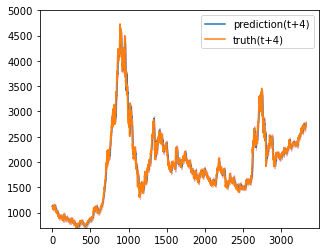

Train epoch:10 	Loss: -13.421966| Loss_in: 0.071969| Loss_out: 0.054337


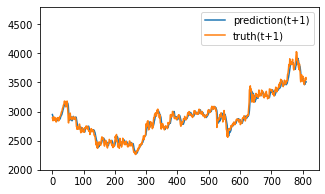

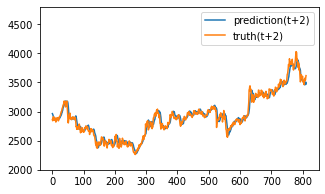

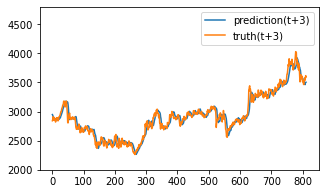

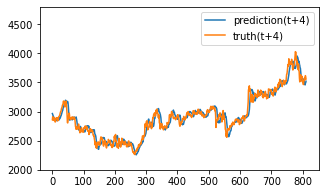

Test epoch:10 	Loss: 0.206708

Epoch: 11


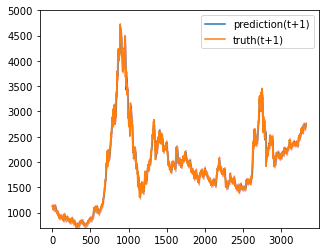

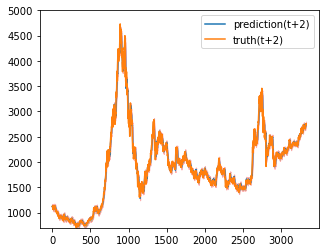

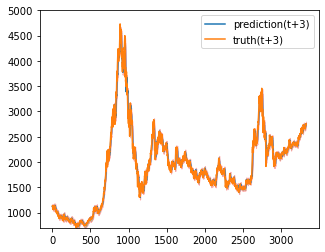

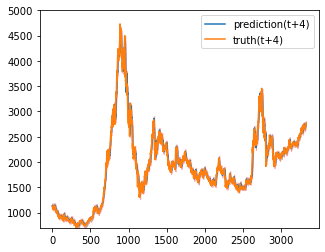

Train epoch:11 	Loss: -15.394435| Loss_in: 0.058319| Loss_out: 0.046784


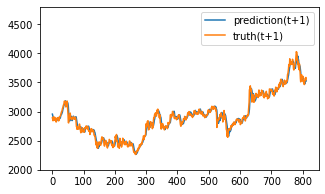

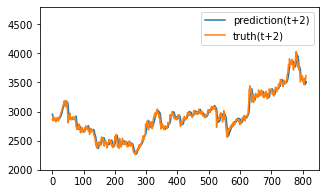

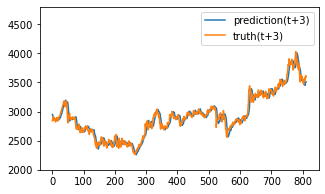

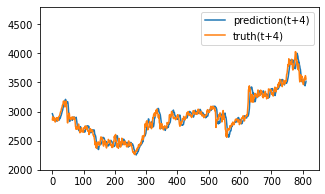

Test epoch:11 	Loss: 0.200297

Epoch: 12


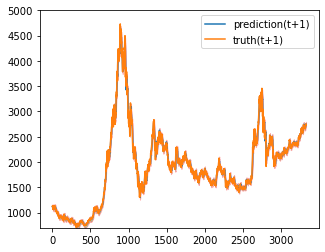

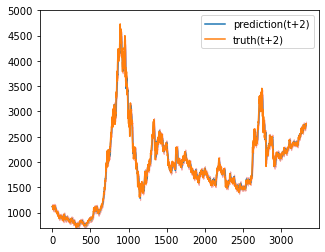

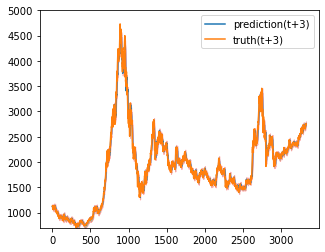

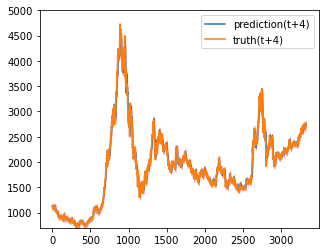

Train epoch:12 	Loss: -16.094961| Loss_in: 0.052201| Loss_out: 0.041266


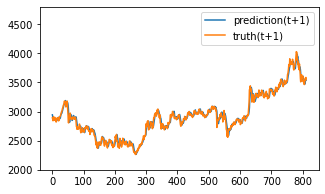

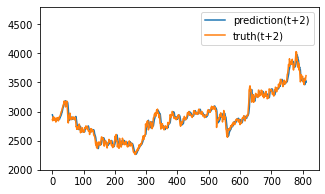

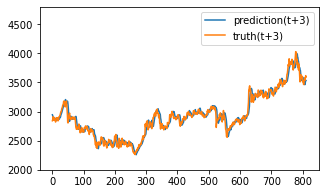

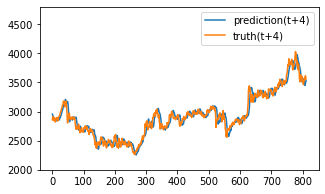

Test epoch:12 	Loss: 0.192978

Epoch: 13


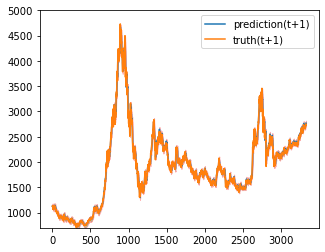

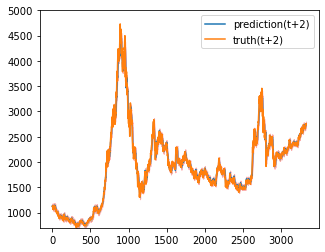

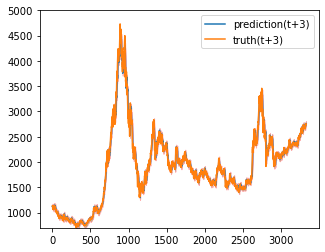

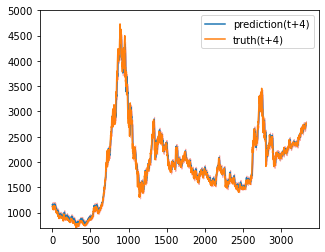

Train epoch:13 	Loss: -15.223050| Loss_in: 0.050618| Loss_out: 0.037614


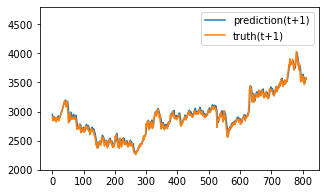

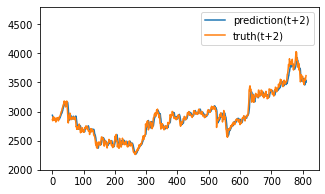

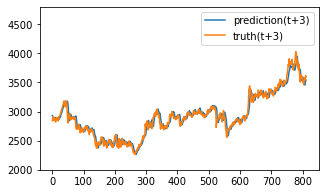

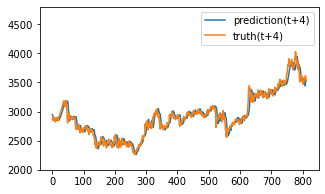

Test epoch:13 	Loss: 0.192462

Epoch: 14


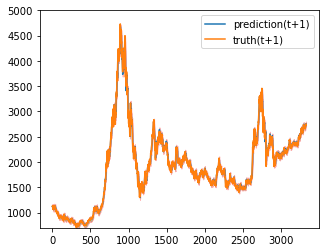

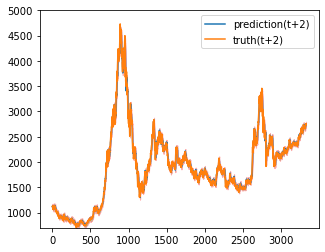

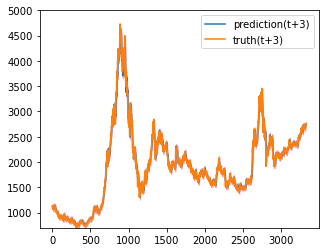

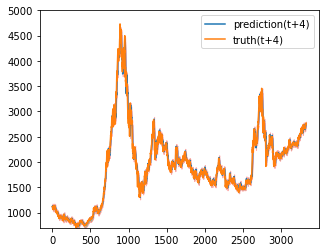

Train epoch:14 	Loss: -16.703920| Loss_in: 0.043520| Loss_out: 0.036425


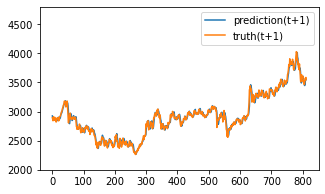

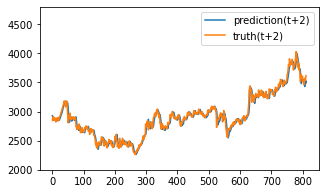

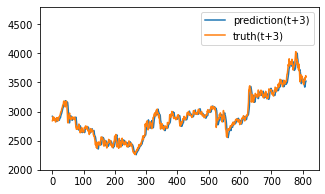

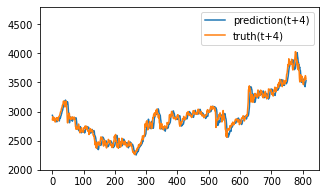

Test epoch:14 	Loss: 0.188502

Epoch: 15


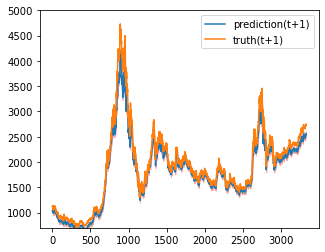

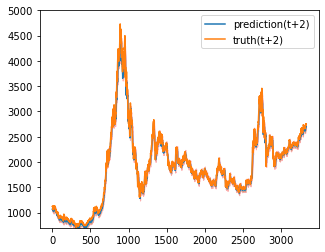

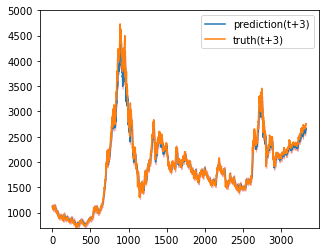

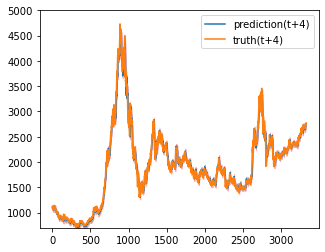

Train epoch:15 	Loss: -15.271238| Loss_in: 0.040798| Loss_out: 0.032495


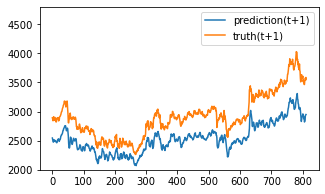

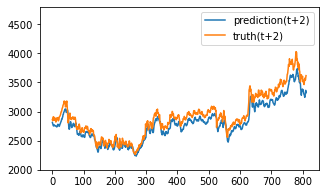

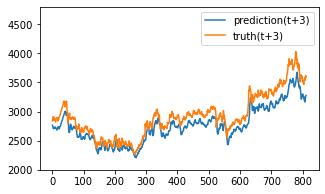

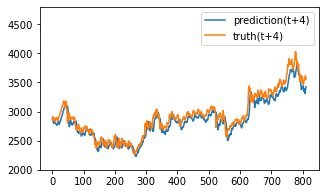

Test epoch:15 	Loss: 0.635218

Epoch: 16


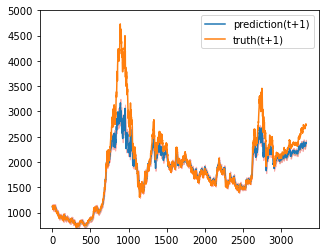

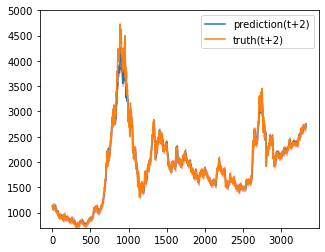

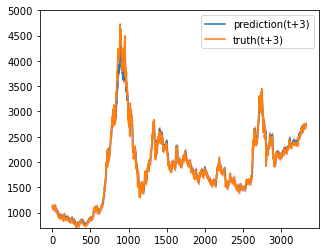

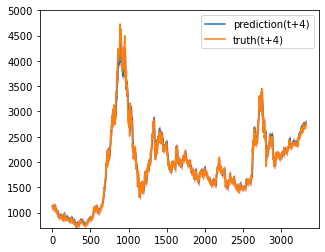

Train epoch:16 	Loss: -12.097432| Loss_in: 0.057220| Loss_out: 0.034801


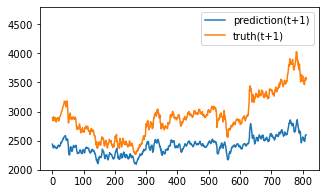

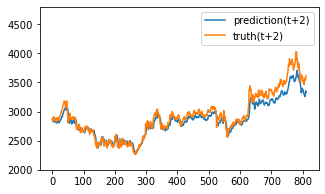

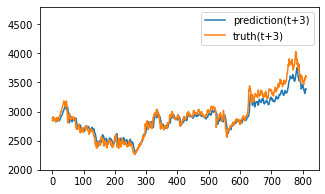

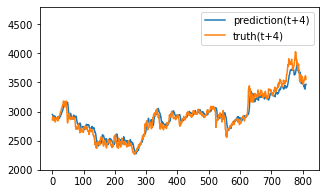

Test epoch:16 	Loss: 0.779855

Epoch: 17


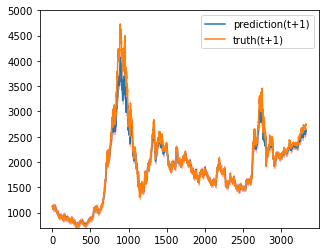

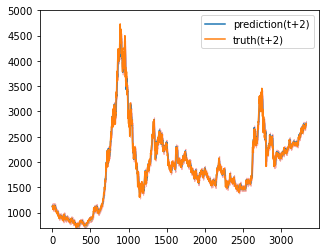

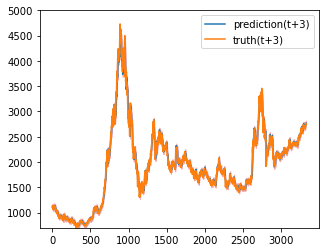

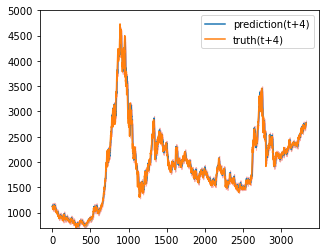

Train epoch:17 	Loss: -15.365710| Loss_in: 0.036759| Loss_out: 0.036382


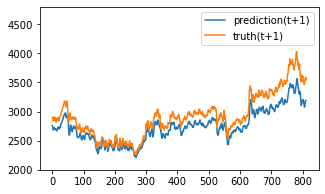

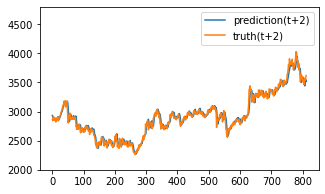

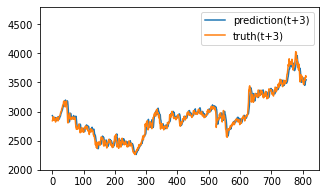

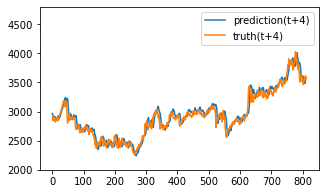

Test epoch:17 	Loss: 0.326718

Epoch: 18


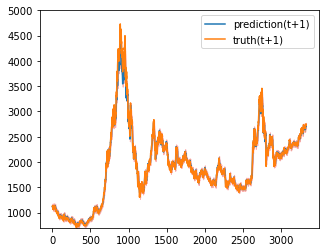

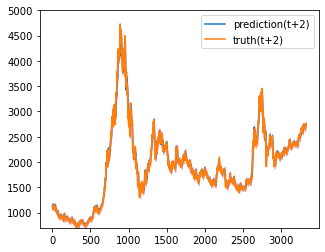

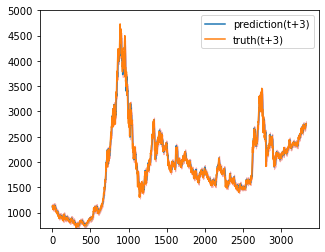

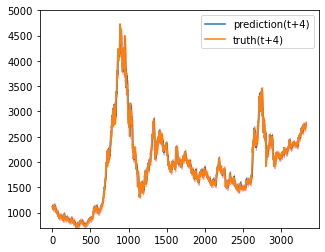

Train epoch:18 	Loss: -16.148324| Loss_in: 0.032718| Loss_out: 0.029930


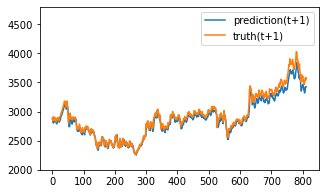

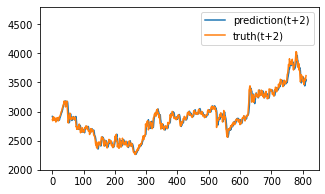

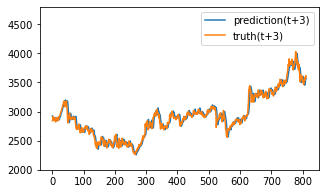

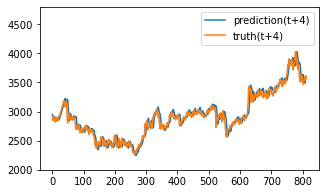

Test epoch:18 	Loss: 0.204032

Epoch: 19


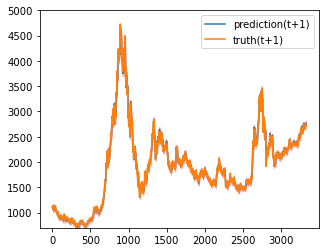

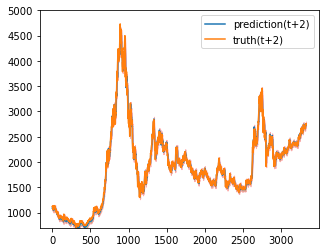

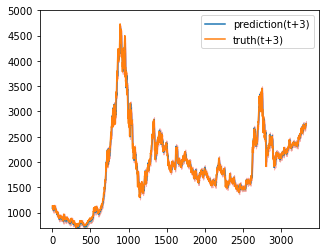

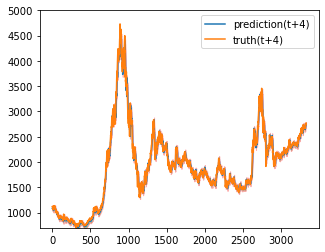

Train epoch:19 	Loss: -16.724389| Loss_in: 0.032263| Loss_out: 0.027034


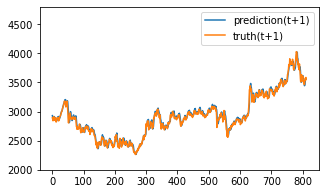

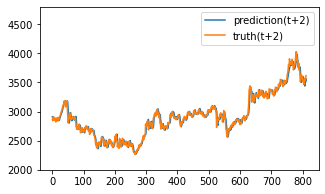

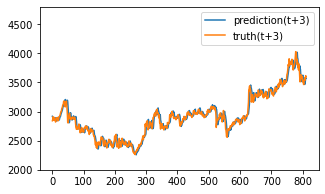

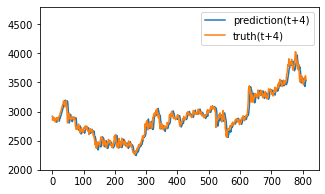

Test epoch:19 	Loss: 0.183004

Epoch: 20


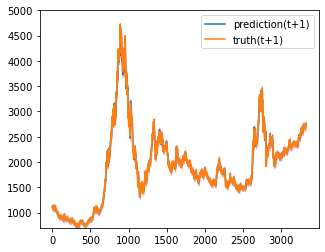

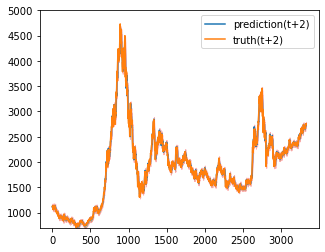

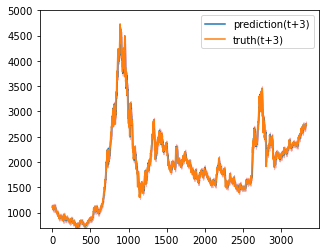

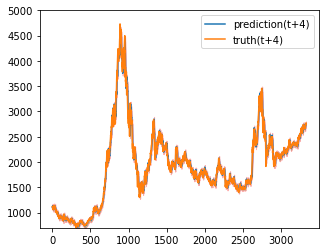

Train epoch:20 	Loss: -17.737733| Loss_in: 0.030571| Loss_out: 0.025916


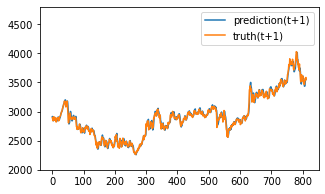

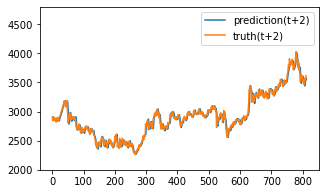

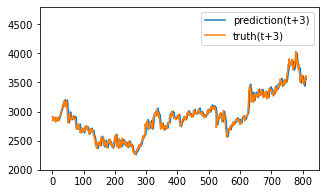

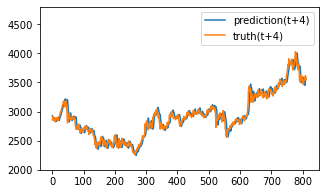

Test epoch:20 	Loss: 0.180711

Epoch: 21


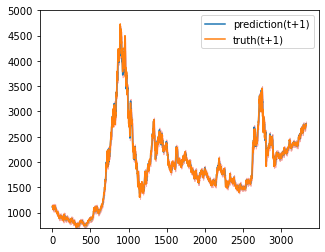

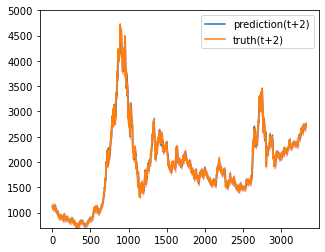

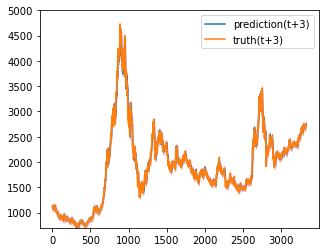

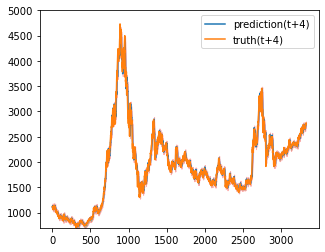

Train epoch:21 	Loss: -18.094660| Loss_in: 0.027480| Loss_out: 0.024706


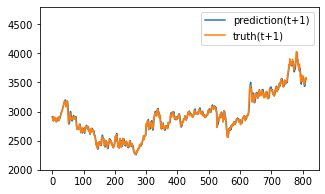

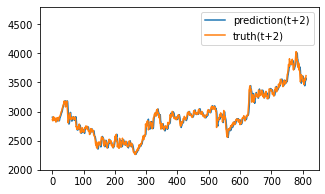

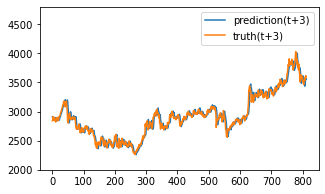

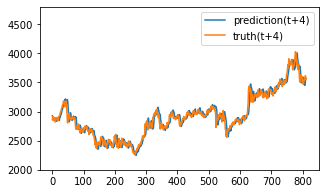

Test epoch:21 	Loss: 0.180537

Epoch: 22


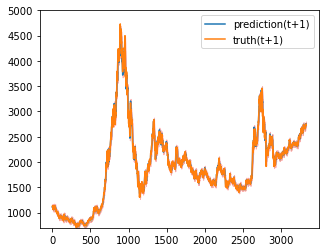

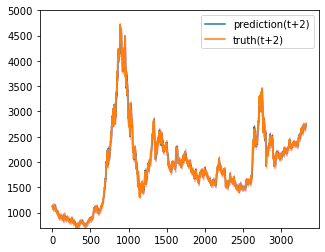

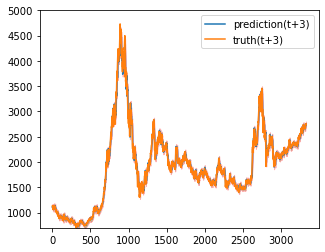

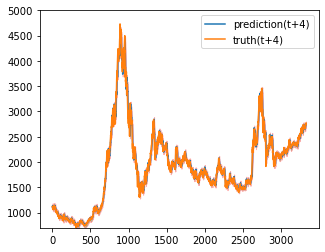

Train epoch:22 	Loss: -18.109982| Loss_in: 0.025888| Loss_out: 0.022986


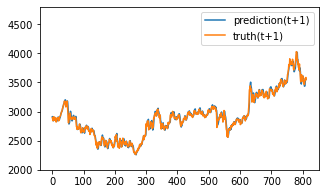

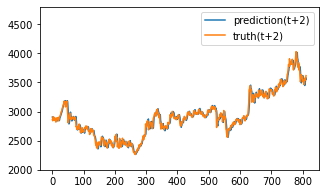

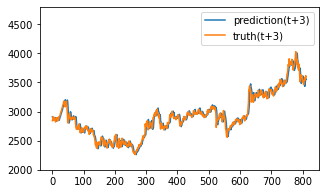

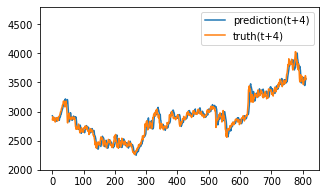

Test epoch:22 	Loss: 0.180364

Epoch: 23


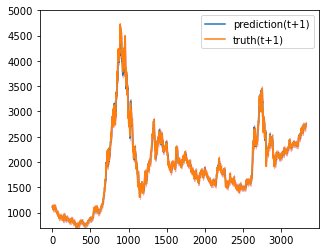

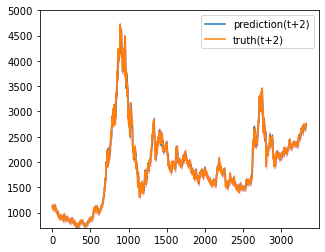

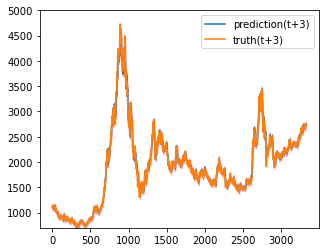

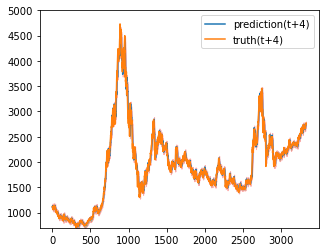

Train epoch:23 	Loss: -18.143772| Loss_in: 0.024759| Loss_out: 0.021665


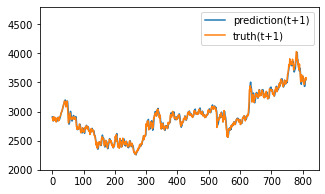

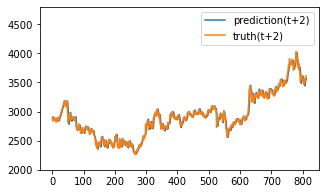

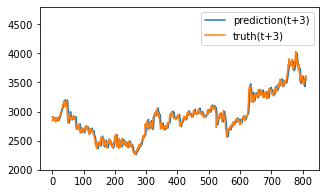

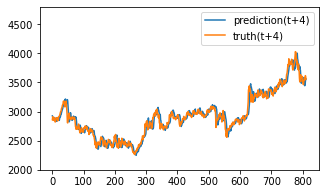

Test epoch:23 	Loss: 0.180270

Epoch: 24


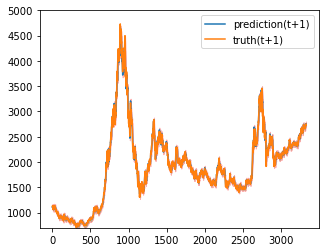

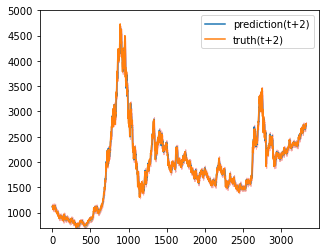

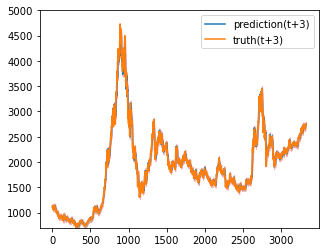

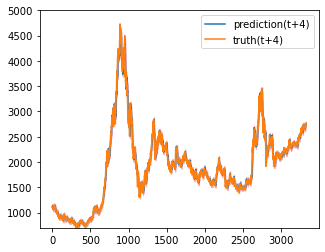

Train epoch:24 	Loss: -18.166868| Loss_in: 0.023876| Loss_out: 0.020310


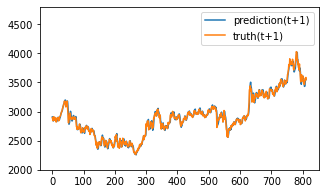

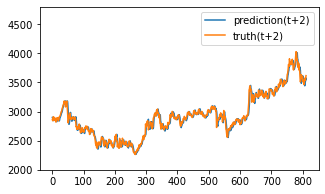

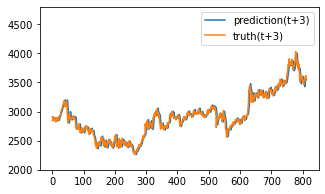

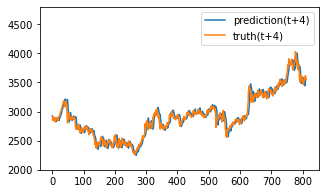

Test epoch:24 	Loss: 0.180184

Epoch: 25


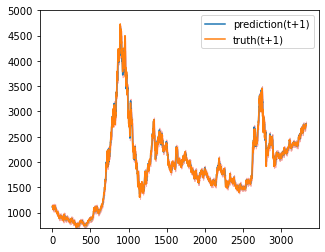

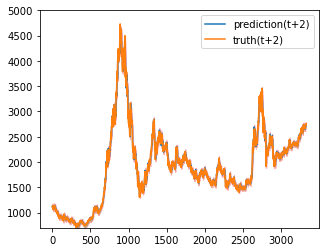

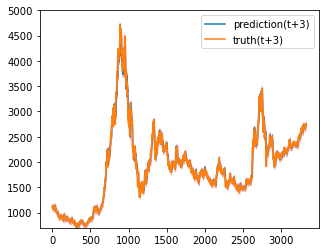

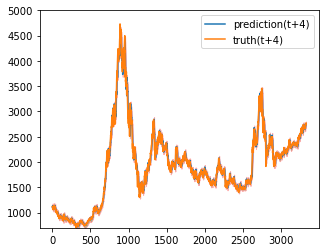

Train epoch:25 	Loss: -18.188250| Loss_in: 0.023011| Loss_out: 0.019592


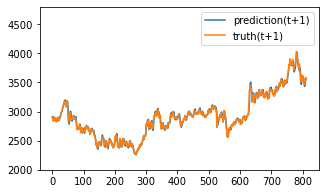

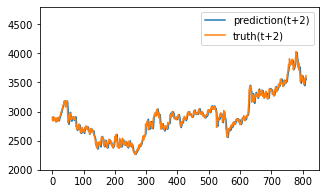

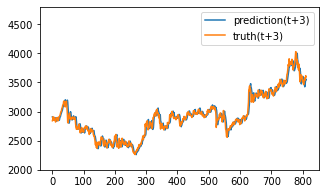

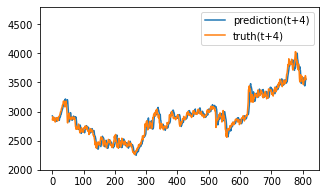

Test epoch:25 	Loss: 0.180079

Epoch: 26


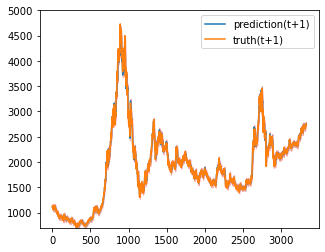

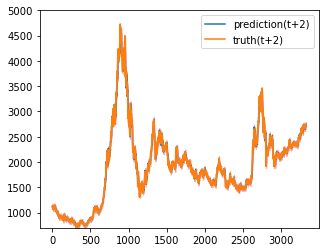

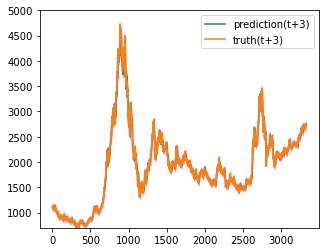

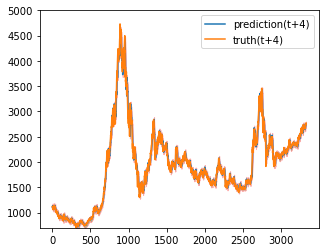

Train epoch:26 	Loss: -18.200042| Loss_in: 0.022201| Loss_out: 0.019037


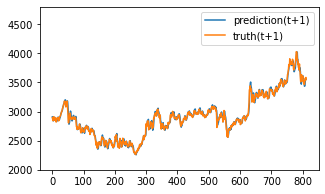

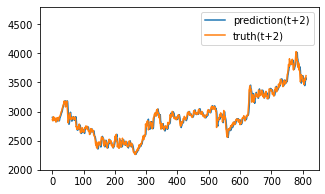

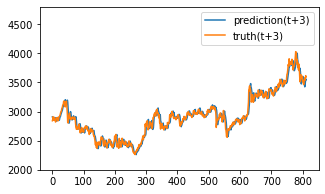

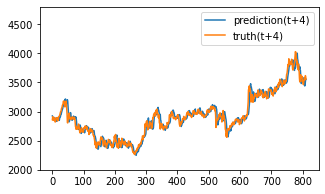

Test epoch:26 	Loss: 0.179944

Epoch: 27


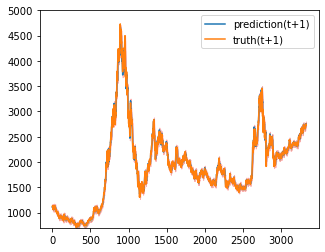

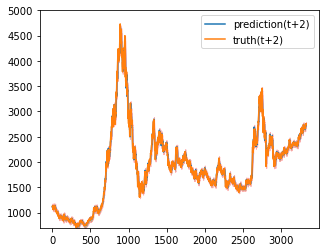

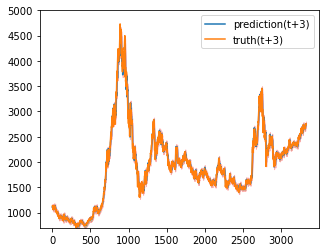

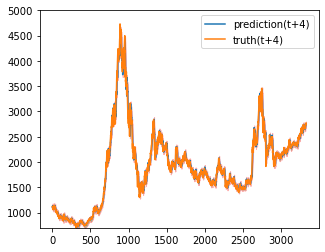

Train epoch:27 	Loss: -18.222294| Loss_in: 0.021510| Loss_out: 0.018242


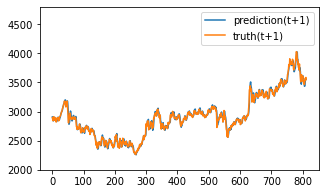

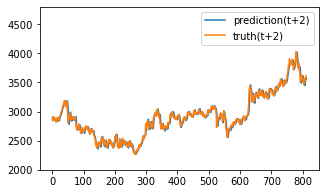

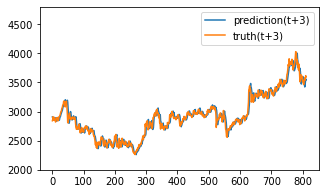

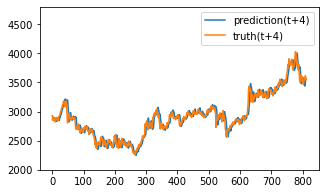

Test epoch:27 	Loss: 0.179780

Epoch: 28


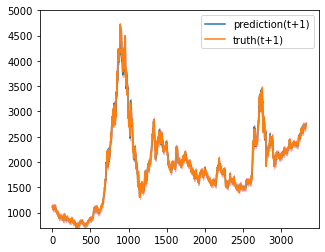

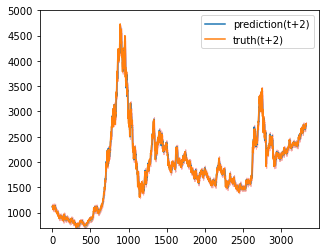

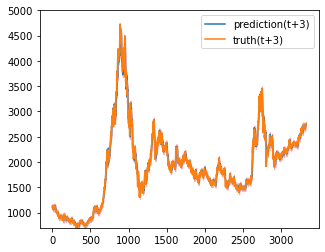

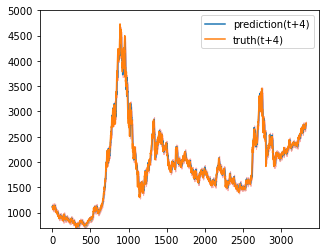

Train epoch:28 	Loss: -18.238750| Loss_in: 0.020889| Loss_out: 0.018124


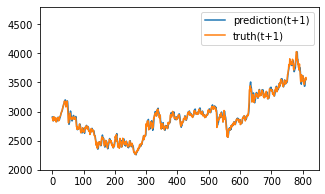

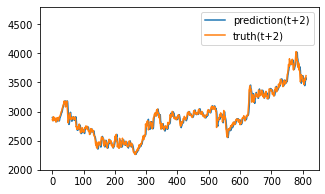

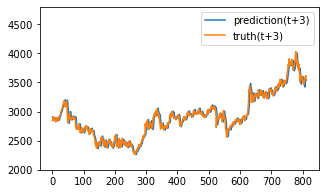

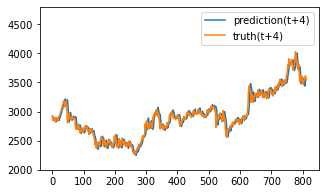

Test epoch:28 	Loss: 0.179678

Epoch: 29


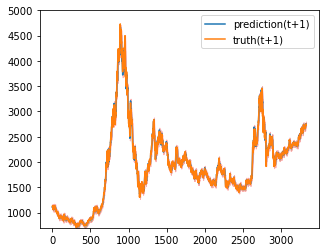

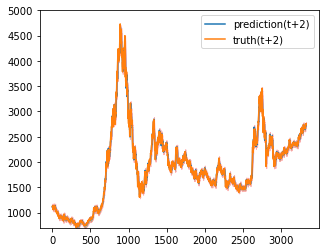

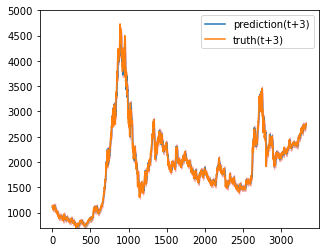

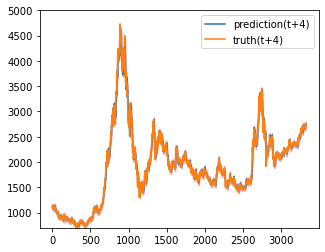

Train epoch:29 	Loss: -18.251696| Loss_in: 0.020351| Loss_out: 0.017295


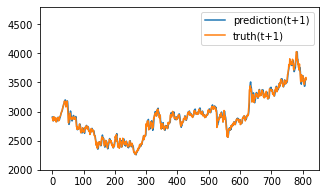

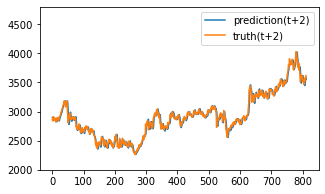

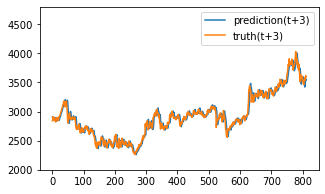

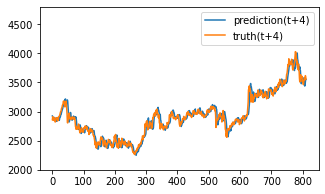

Test epoch:29 	Loss: 0.179514

Epoch: 30


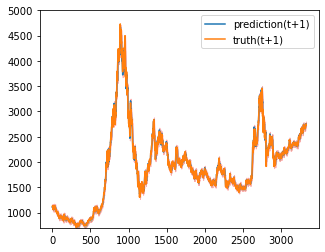

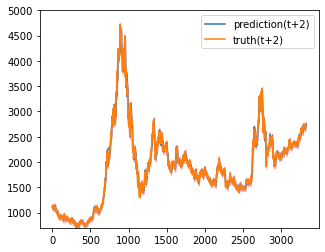

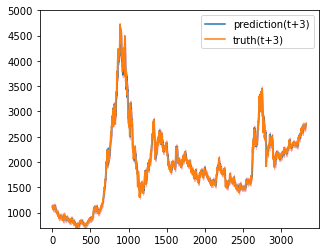

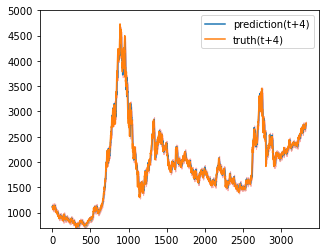

Train epoch:30 	Loss: -18.269749| Loss_in: 0.019794| Loss_out: 0.016830


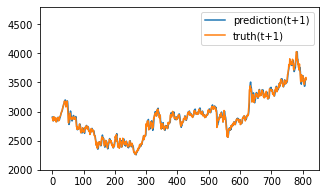

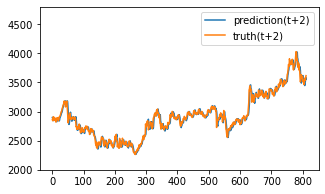

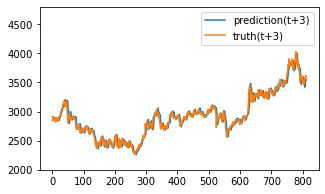

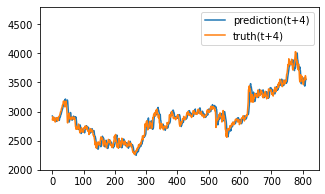

Test epoch:30 	Loss: 0.179319

Epoch: 31


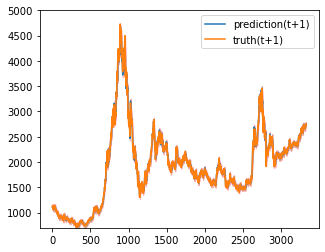

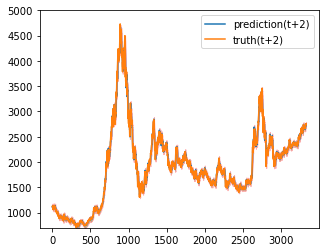

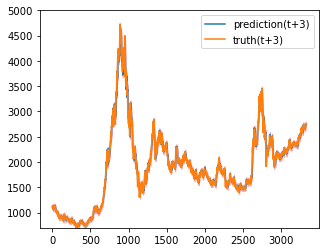

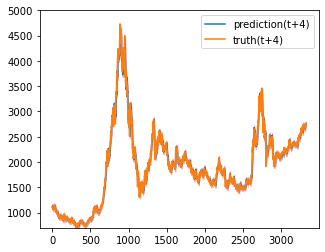

Train epoch:31 	Loss: -18.282878| Loss_in: 0.019193| Loss_out: 0.016187


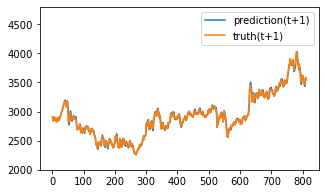

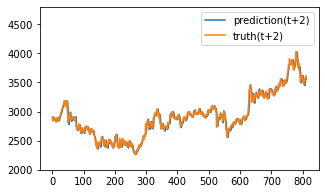

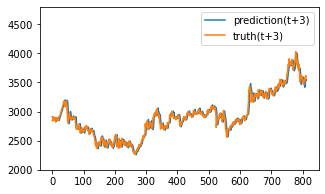

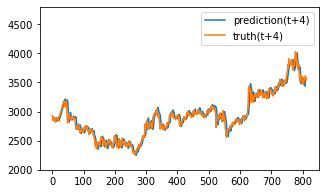

Test epoch:31 	Loss: 0.179141

Epoch: 32


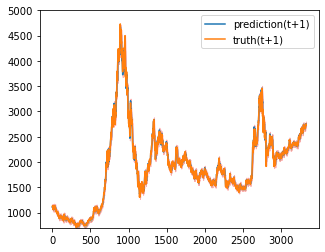

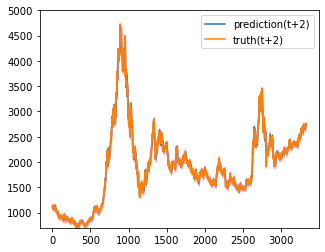

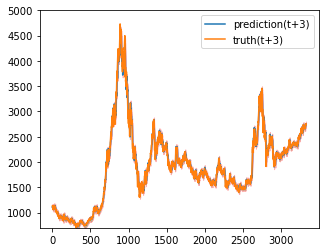

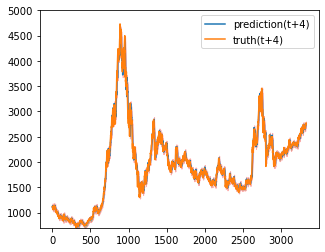

Train epoch:32 	Loss: -18.296183| Loss_in: 0.018741| Loss_out: 0.016219


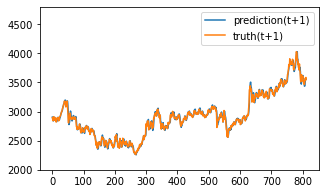

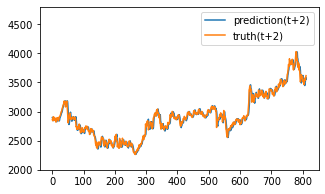

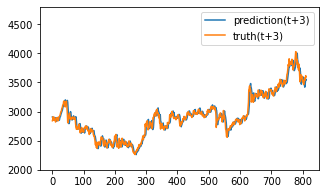

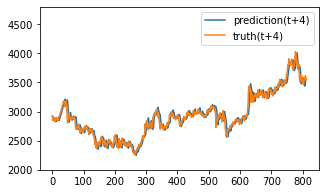

Test epoch:32 	Loss: 0.178954

Epoch: 33


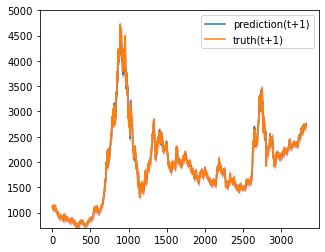

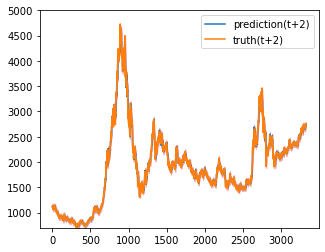

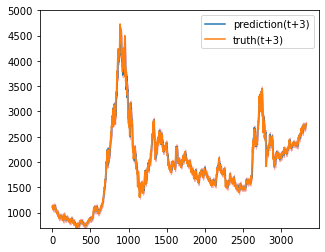

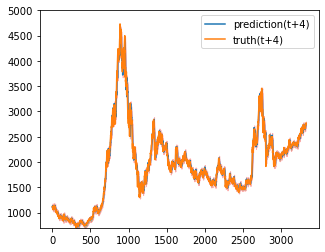

Train epoch:33 	Loss: -18.308141| Loss_in: 0.018365| Loss_out: 0.015719


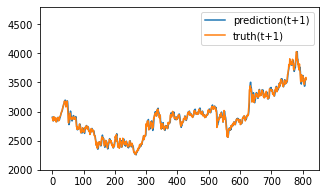

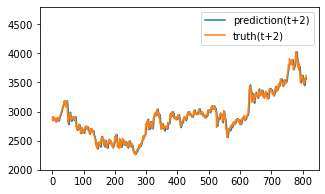

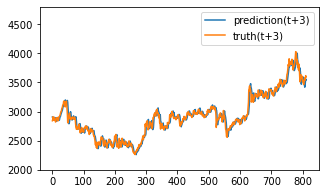

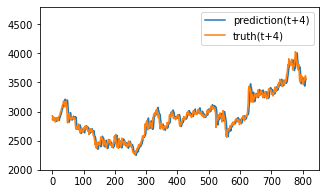

Test epoch:33 	Loss: 0.178804

Epoch: 34


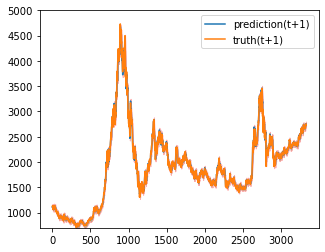

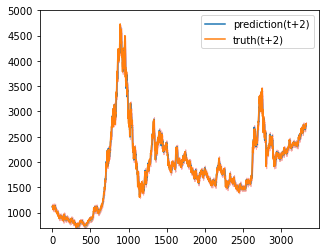

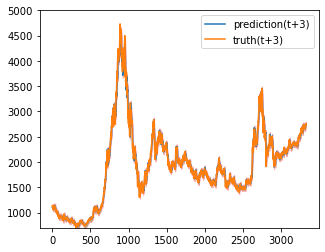

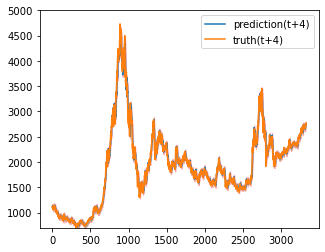

Train epoch:34 	Loss: -18.320135| Loss_in: 0.017964| Loss_out: 0.015101


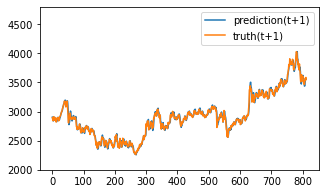

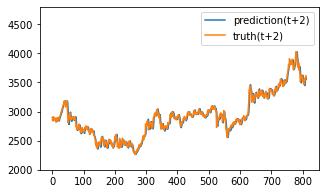

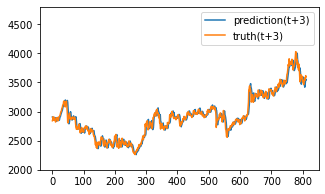

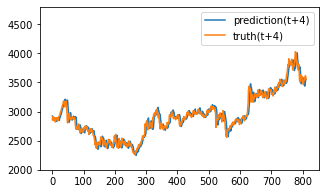

Test epoch:34 	Loss: 0.178626

Epoch: 35


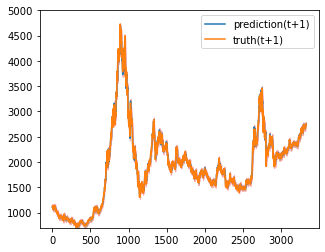

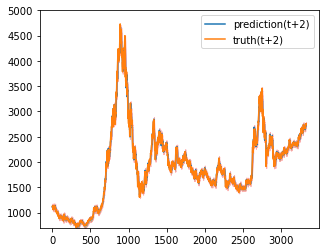

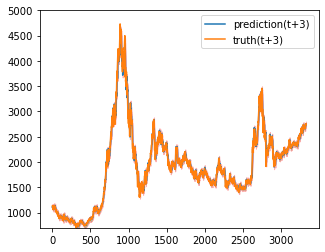

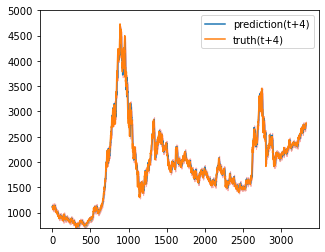

Train epoch:35 	Loss: -18.332156| Loss_in: 0.017520| Loss_out: 0.015104


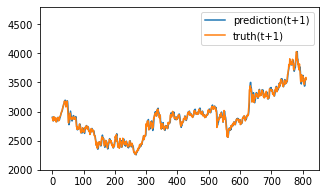

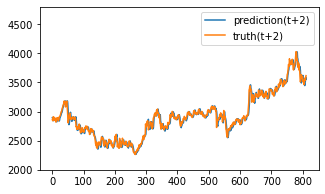

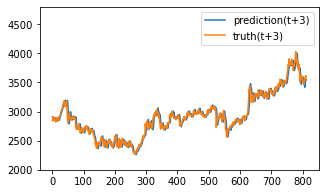

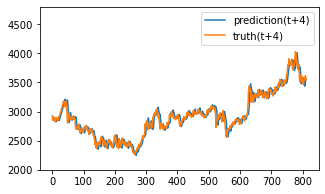

Test epoch:35 	Loss: 0.178489

Epoch: 36


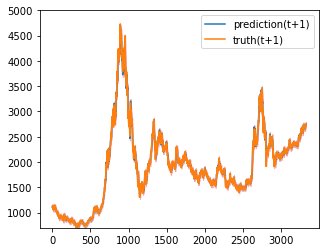

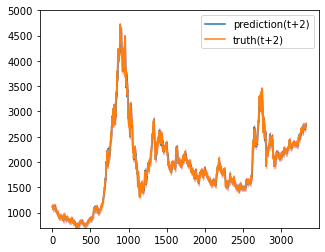

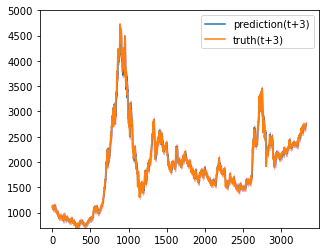

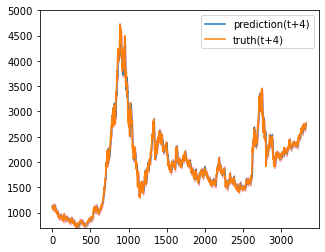

Train epoch:36 	Loss: -18.342586| Loss_in: 0.017200| Loss_out: 0.014675


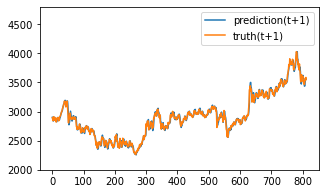

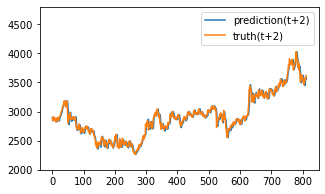

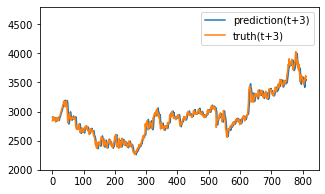

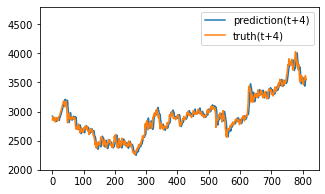

Test epoch:36 	Loss: 0.178303

Epoch: 37


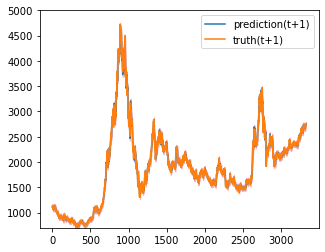

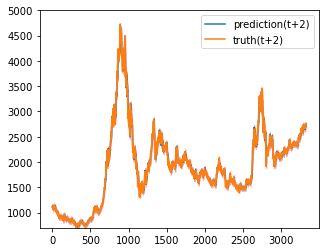

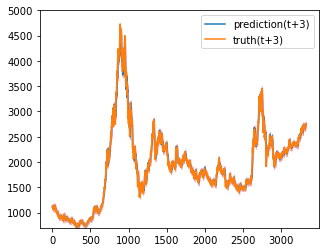

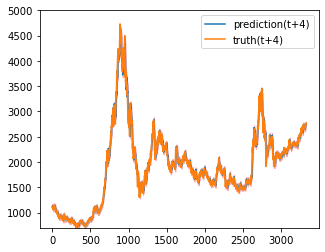

Train epoch:37 	Loss: -18.352589| Loss_in: 0.016844| Loss_out: 0.014701


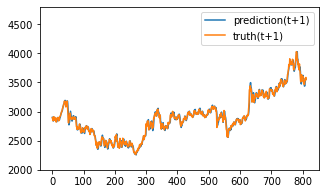

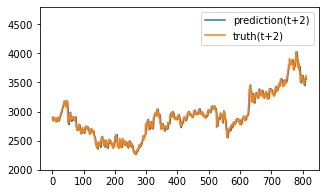

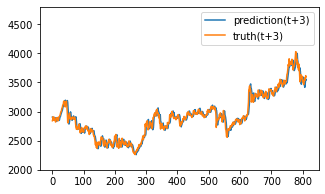

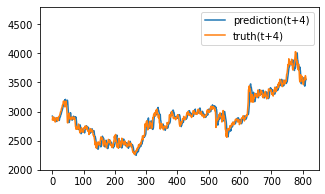

Test epoch:37 	Loss: 0.178193

Epoch: 38


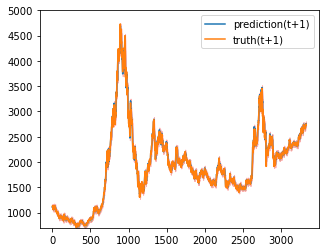

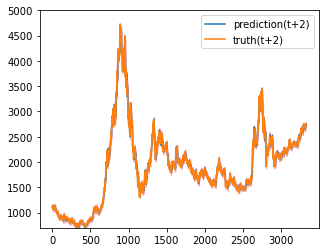

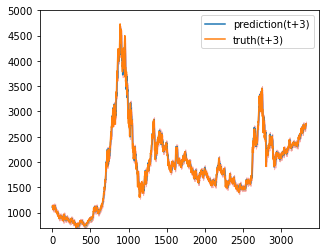

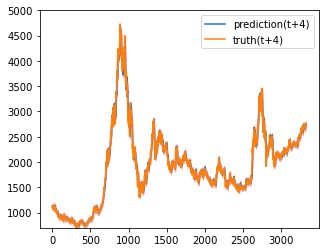

Train epoch:38 	Loss: -18.294022| Loss_in: 0.016583| Loss_out: 0.014283


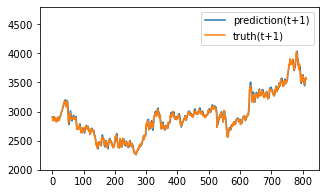

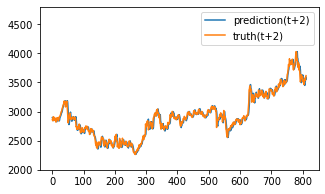

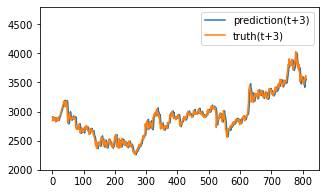

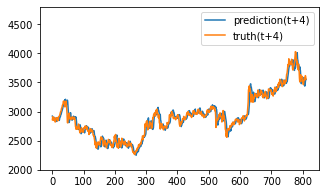

Test epoch:38 	Loss: 0.178128

Epoch: 39


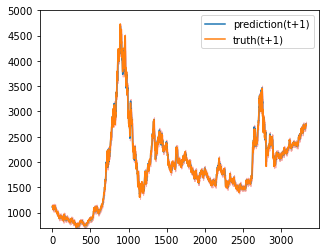

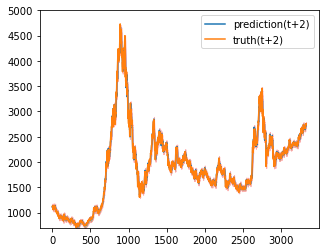

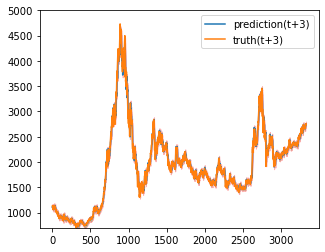

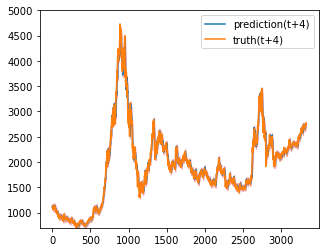

Train epoch:39 	Loss: -18.361375| Loss_in: 0.016259| Loss_out: 0.013703


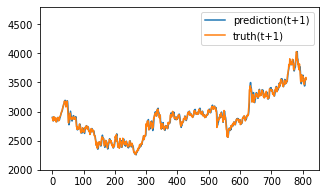

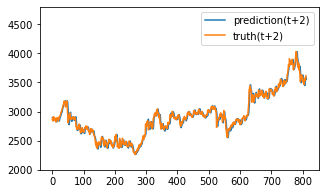

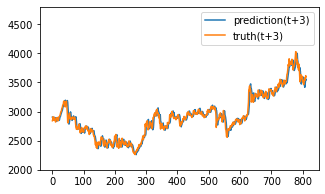

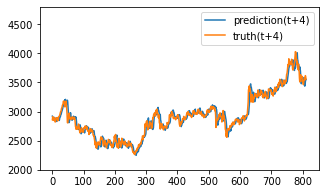

Test epoch:39 	Loss: 0.177840

Epoch: 40


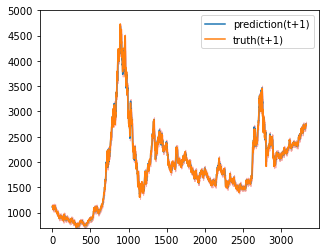

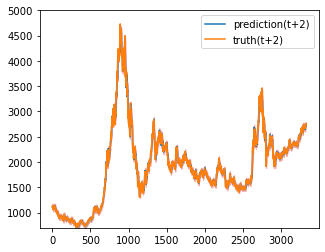

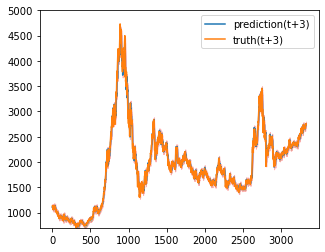

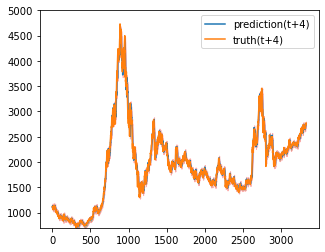

Train epoch:40 	Loss: -18.381042| Loss_in: 0.015915| Loss_out: 0.013897


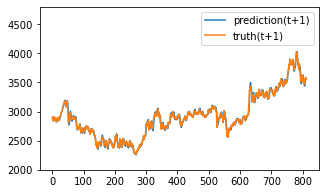

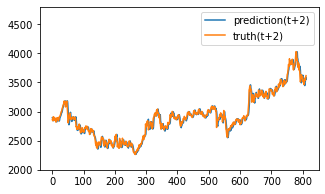

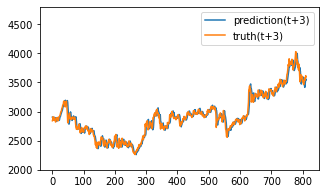

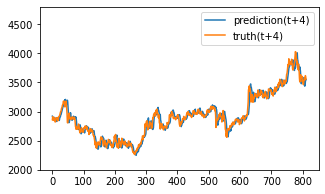

Test epoch:40 	Loss: 0.177670

Epoch: 41


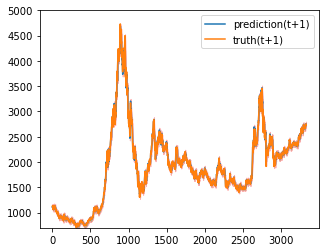

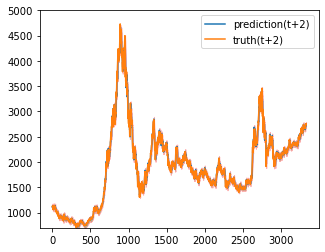

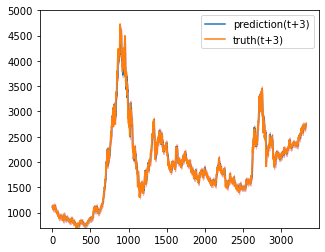

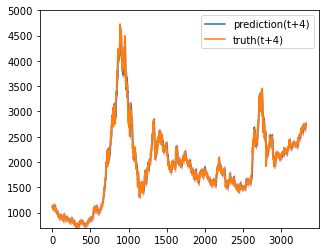

Train epoch:41 	Loss: -18.389253| Loss_in: 0.015736| Loss_out: 0.013730


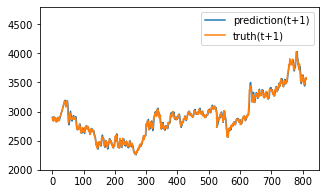

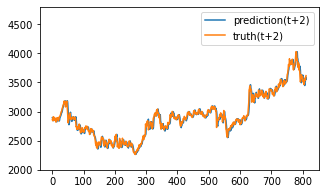

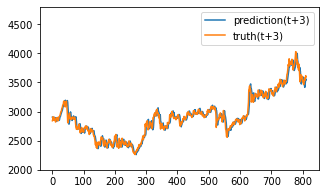

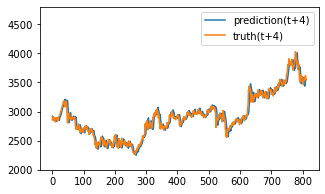

Test epoch:41 	Loss: 0.177546

Epoch: 42


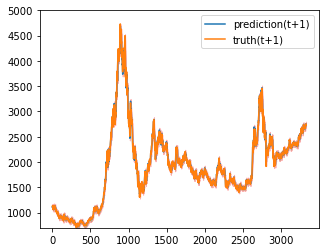

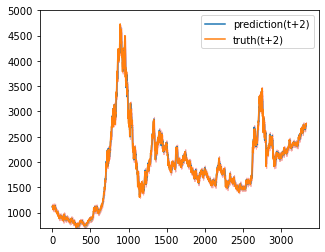

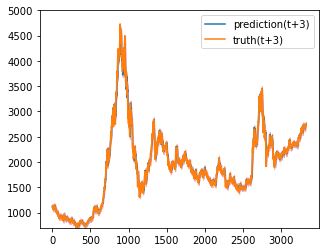

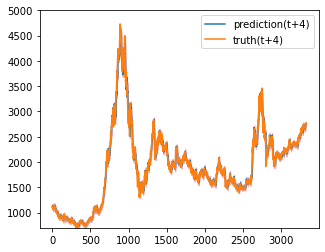

Train epoch:42 	Loss: -18.398343| Loss_in: 0.015534| Loss_out: 0.013541


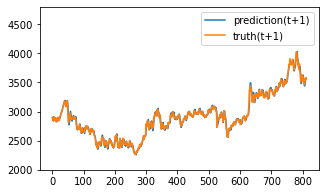

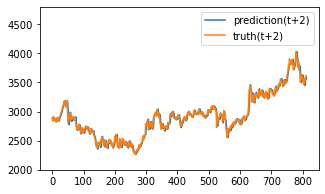

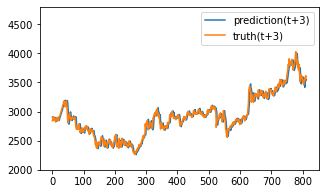

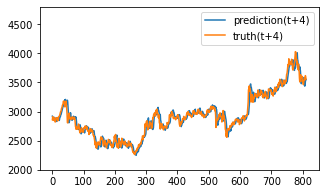

Test epoch:42 	Loss: 0.177434

Epoch: 43


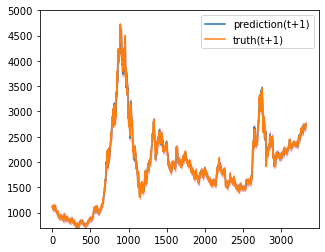

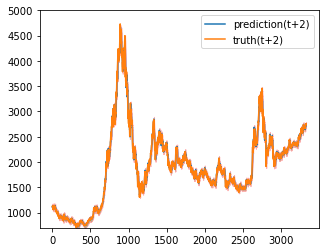

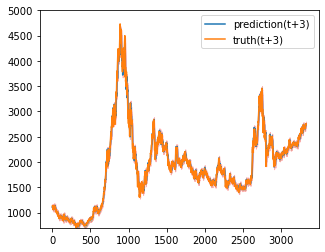

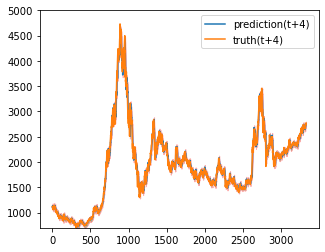

Train epoch:43 	Loss: -18.403569| Loss_in: 0.015285| Loss_out: 0.013354


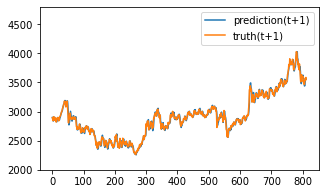

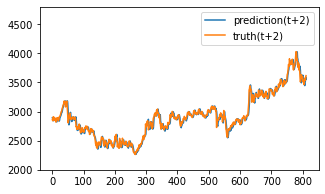

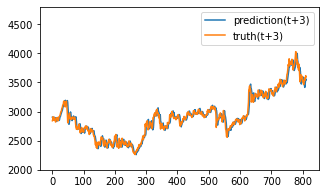

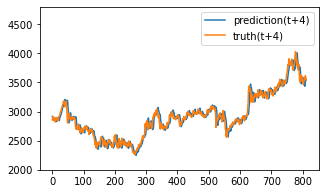

Test epoch:43 	Loss: 0.177352

Epoch: 44


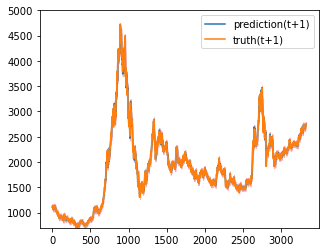

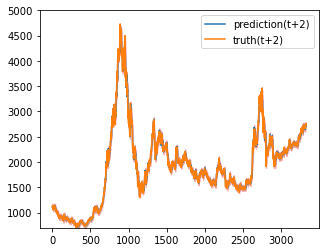

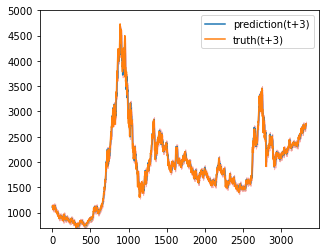

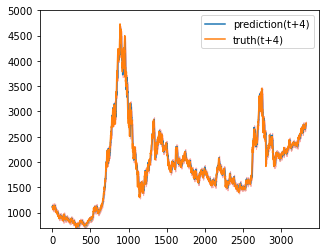

Train epoch:44 	Loss: -18.414086| Loss_in: 0.015042| Loss_out: 0.012860


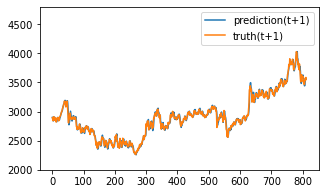

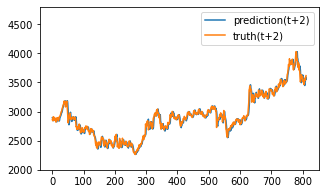

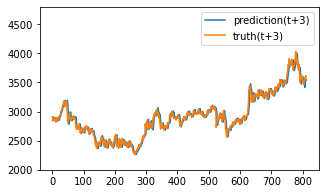

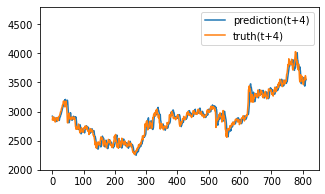

Test epoch:44 	Loss: 0.177236

Epoch: 45


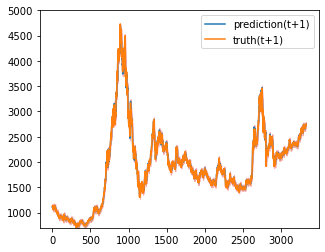

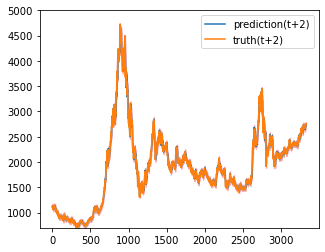

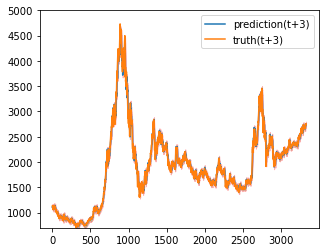

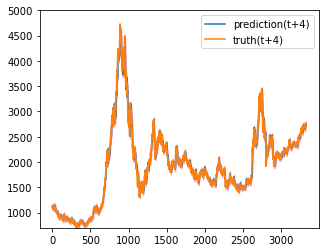

Train epoch:45 	Loss: -18.419086| Loss_in: 0.014794| Loss_out: 0.012732


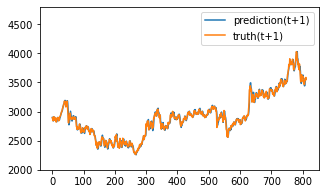

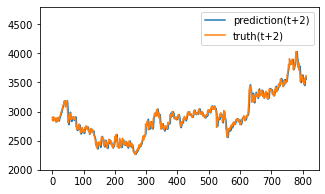

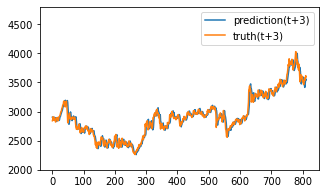

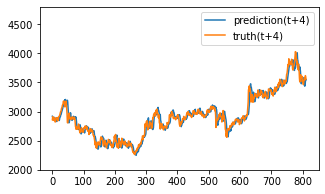

Test epoch:45 	Loss: 0.177165

Epoch: 46


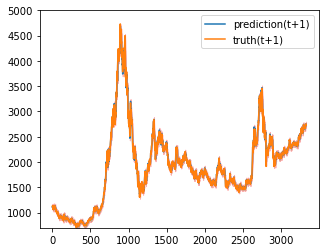

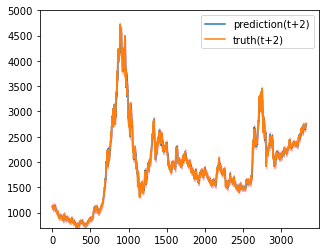

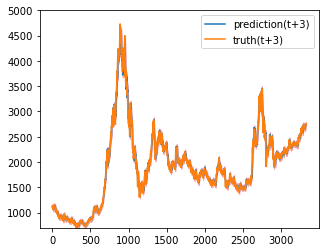

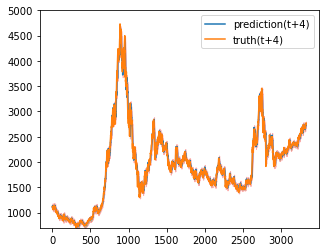

Train epoch:46 	Loss: -18.426476| Loss_in: 0.014602| Loss_out: 0.012605


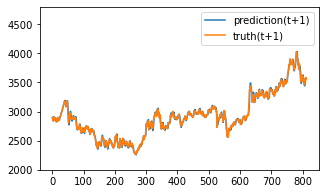

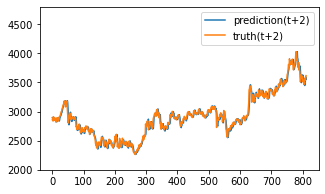

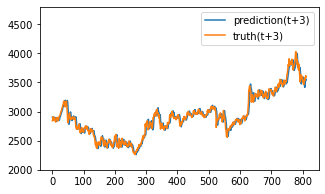

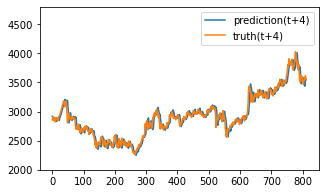

Test epoch:46 	Loss: 0.176995

Epoch: 47


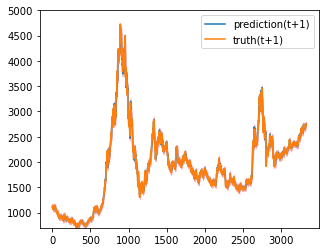

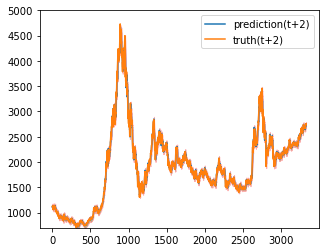

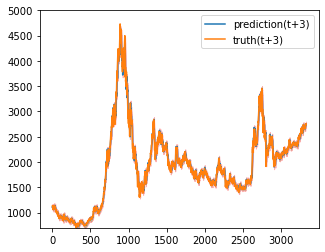

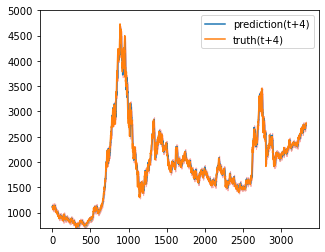

Train epoch:47 	Loss: -18.431621| Loss_in: 0.014387| Loss_out: 0.012520


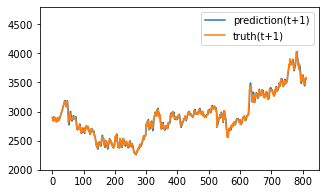

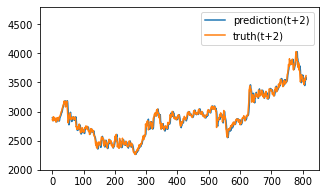

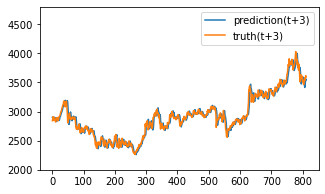

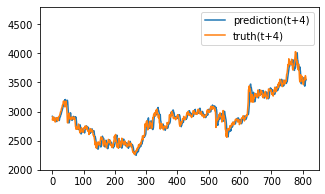

Test epoch:47 	Loss: 0.176919

Epoch: 48


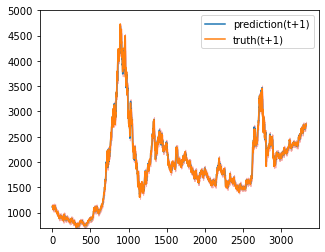

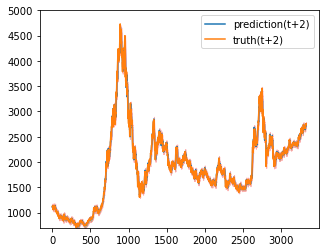

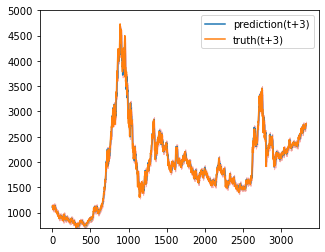

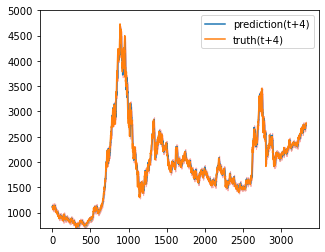

Train epoch:48 	Loss: -18.441473| Loss_in: 0.014240| Loss_out: 0.012529


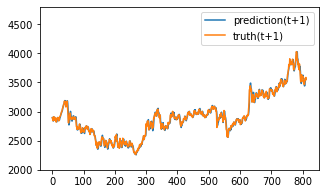

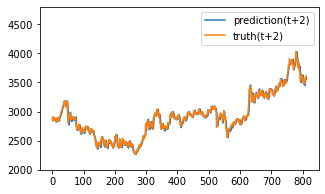

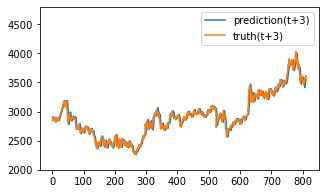

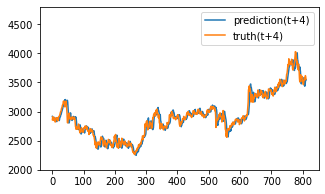

Test epoch:48 	Loss: 0.176922

Epoch: 49


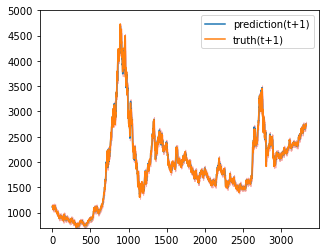

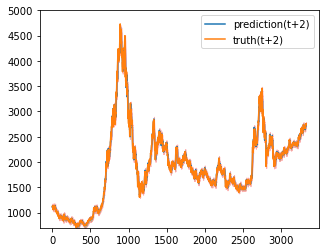

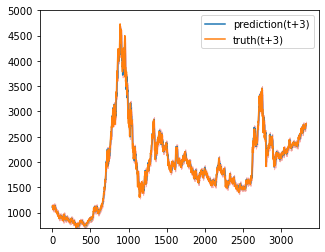

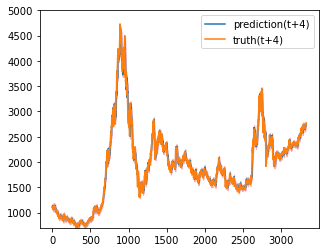

Train epoch:49 	Loss: -18.447779| Loss_in: 0.014058| Loss_out: 0.012148


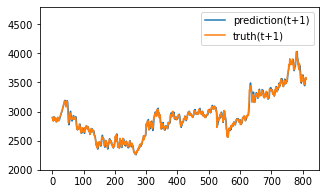

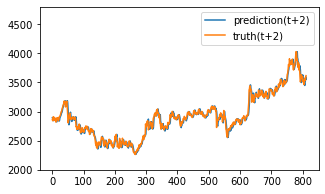

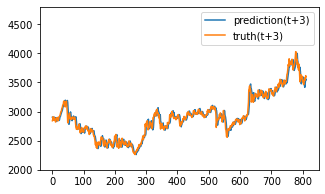

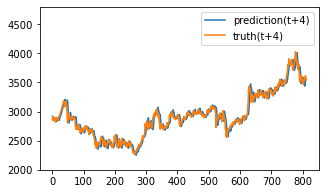

Test epoch:49 	Loss: 0.176702

Epoch: 50


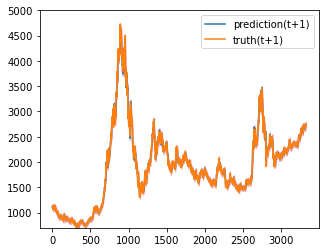

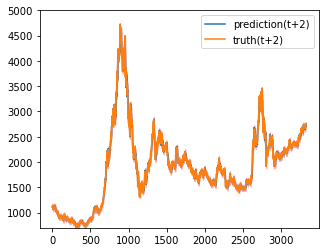

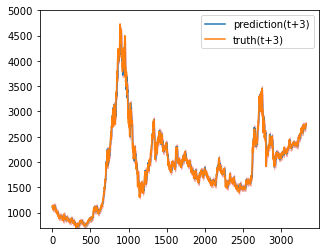

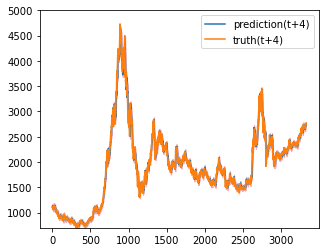

Train epoch:50 	Loss: -18.455517| Loss_in: 0.013845| Loss_out: 0.011894


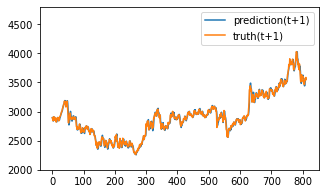

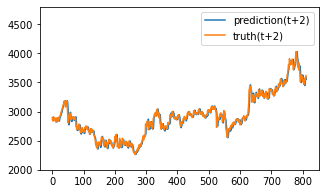

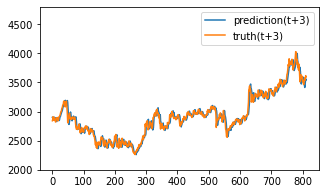

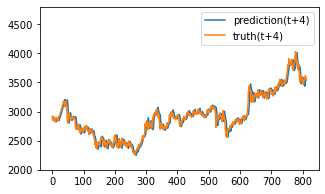

Test epoch:50 	Loss: 0.176704

Epoch: 51


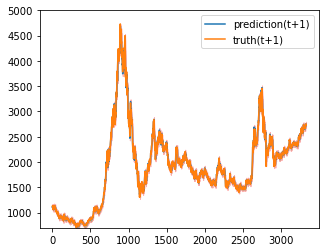

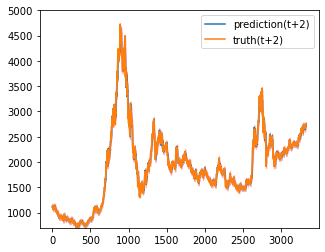

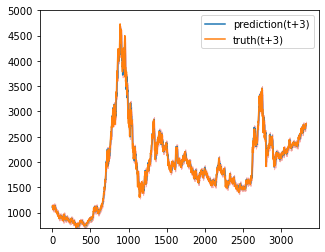

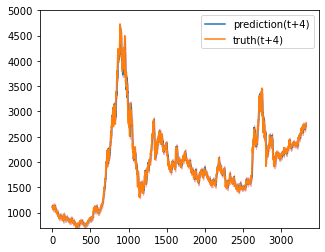

Train epoch:51 	Loss: -18.462871| Loss_in: 0.013701| Loss_out: 0.012044


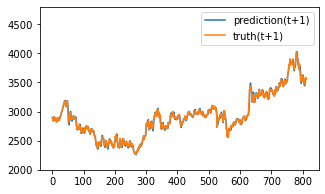

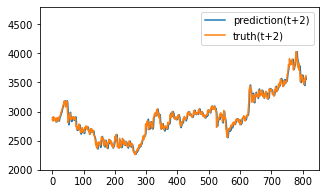

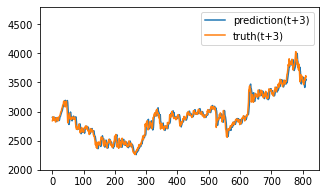

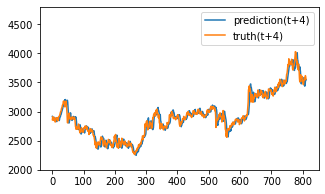

Test epoch:51 	Loss: 0.176626

Epoch: 52


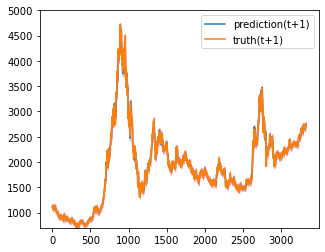

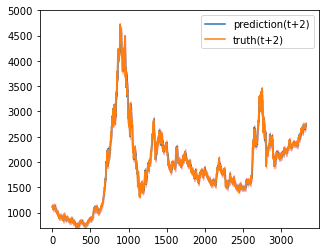

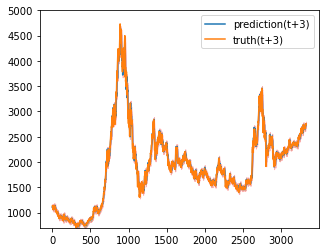

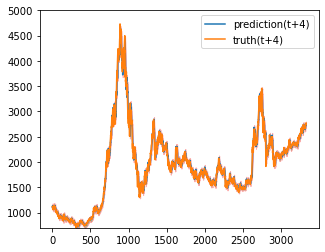

Train epoch:52 	Loss: -18.467565| Loss_in: 0.013571| Loss_out: 0.011744


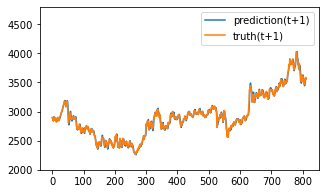

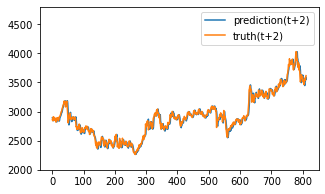

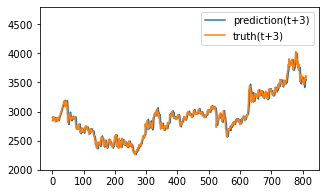

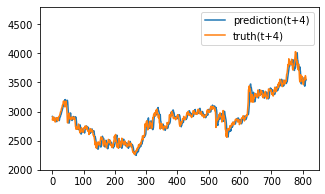

Test epoch:52 	Loss: 0.176629

Epoch: 53


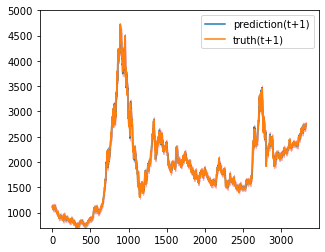

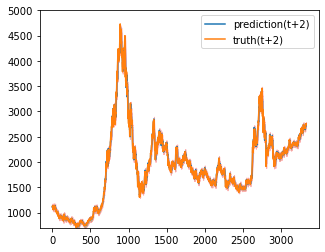

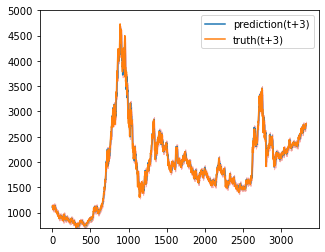

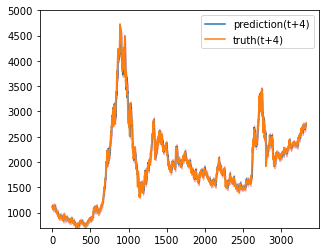

Train epoch:53 	Loss: -18.475426| Loss_in: 0.013399| Loss_out: 0.011692


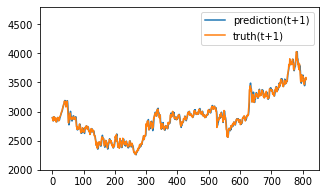

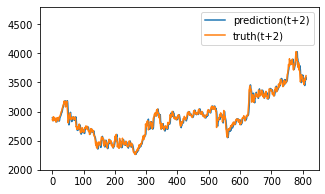

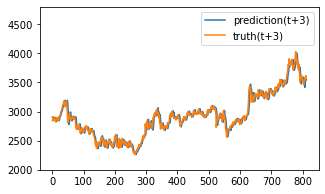

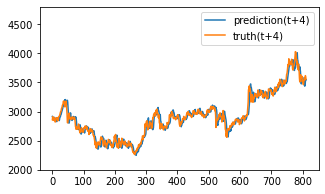

Test epoch:53 	Loss: 0.176442

Epoch: 54


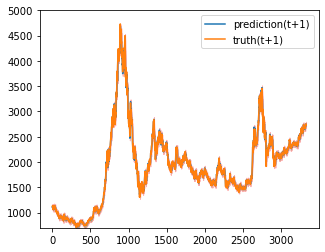

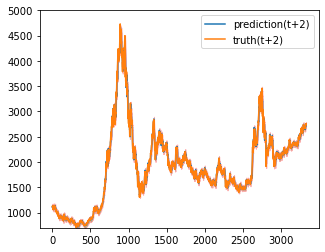

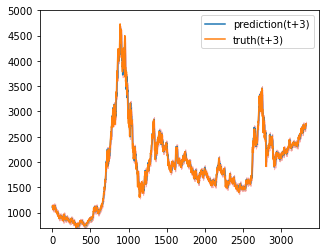

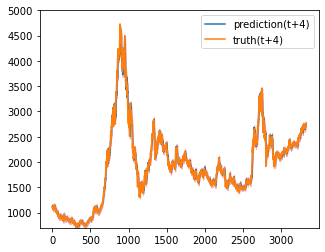

Train epoch:54 	Loss: -18.472224| Loss_in: 0.013276| Loss_out: 0.011624


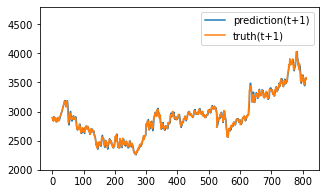

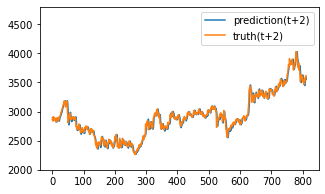

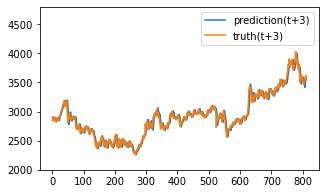

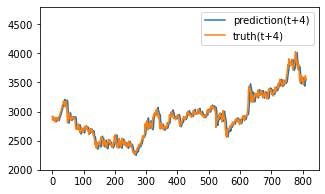

Test epoch:54 	Loss: 0.176390

Epoch: 55


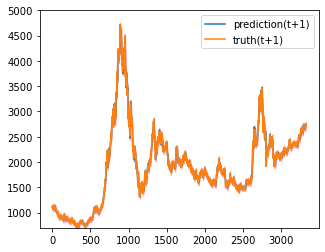

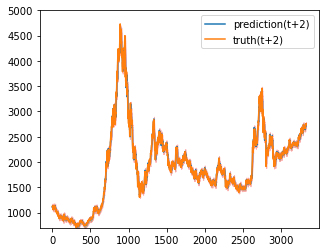

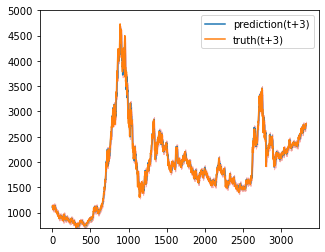

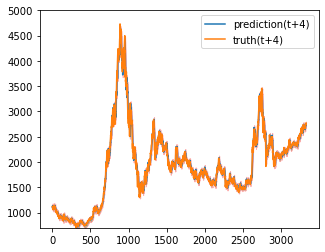

Train epoch:55 	Loss: -18.483602| Loss_in: 0.013177| Loss_out: 0.011648


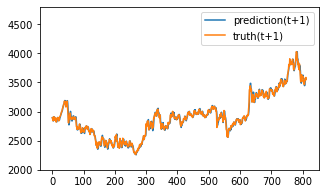

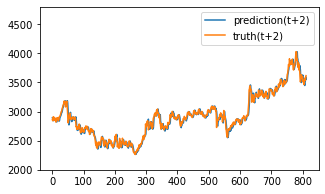

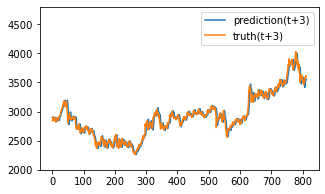

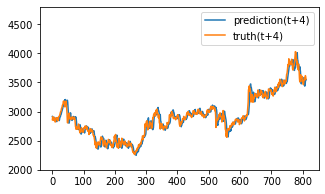

Test epoch:55 	Loss: 0.176279

Epoch: 56


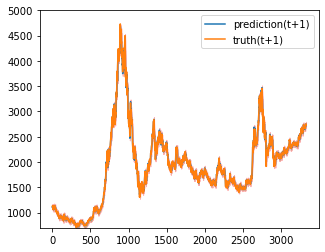

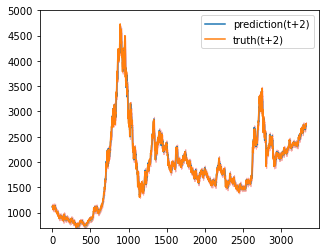

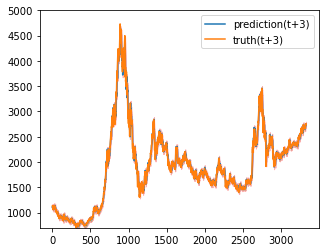

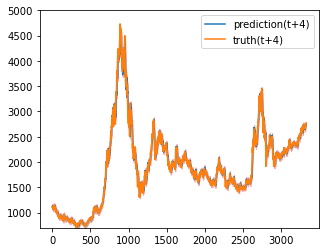

Train epoch:56 	Loss: -18.492350| Loss_in: 0.013072| Loss_out: 0.011434


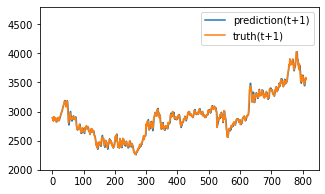

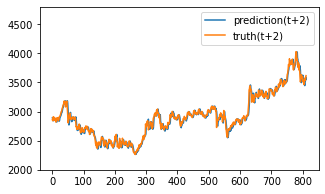

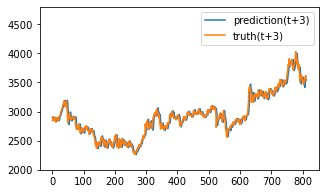

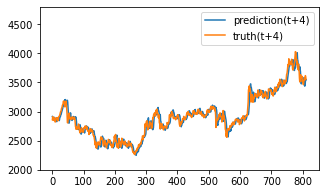

Test epoch:56 	Loss: 0.176299

Epoch: 57


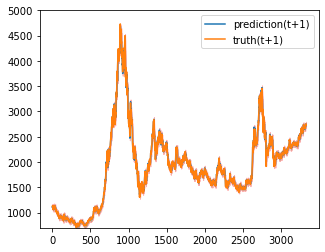

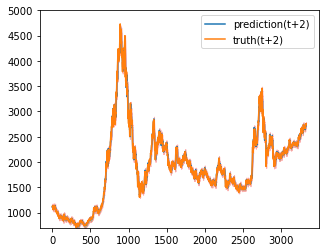

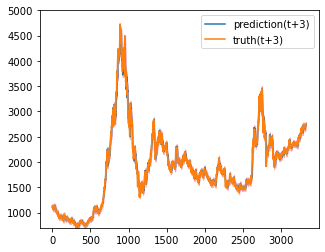

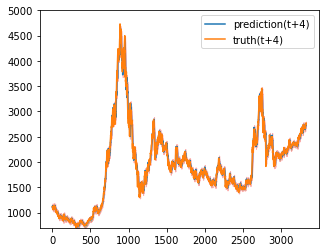

Train epoch:57 	Loss: -18.497031| Loss_in: 0.012945| Loss_out: 0.011384


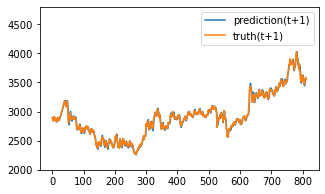

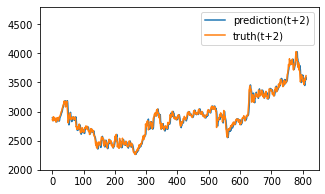

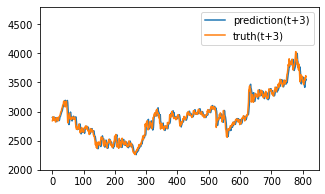

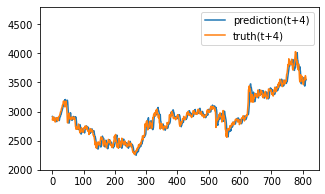

Test epoch:57 	Loss: 0.176114

Epoch: 58


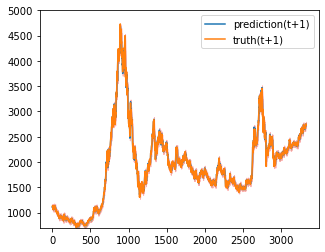

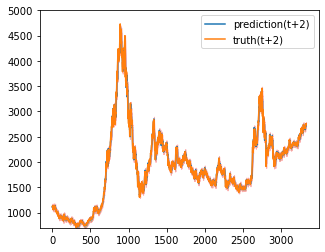

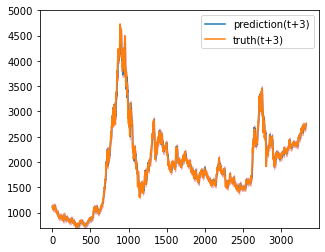

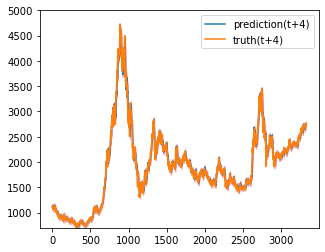

Train epoch:58 	Loss: -18.502210| Loss_in: 0.012794| Loss_out: 0.011096


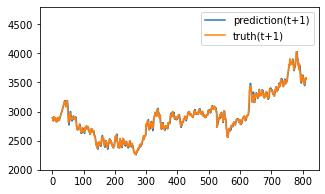

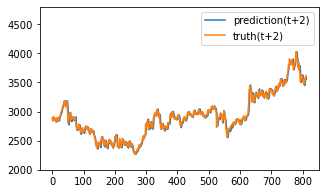

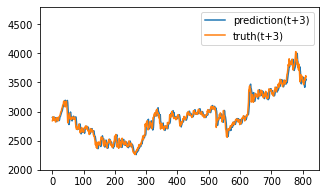

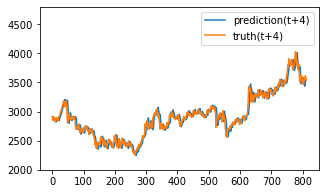

Test epoch:58 	Loss: 0.176091

Epoch: 59


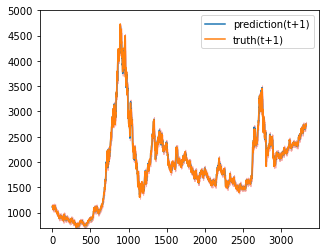

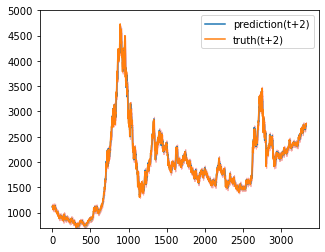

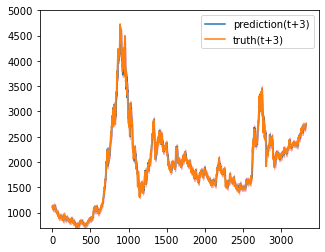

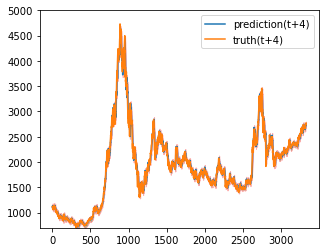

Train epoch:59 	Loss: -18.506934| Loss_in: 0.012686| Loss_out: 0.011203


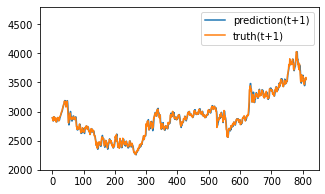

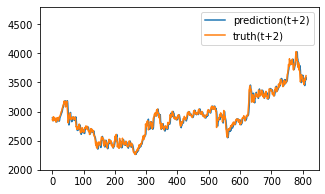

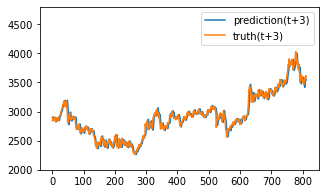

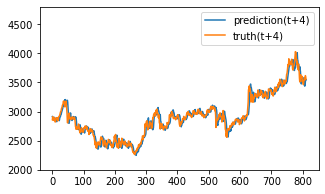

Test epoch:59 	Loss: 0.176074

Epoch: 60


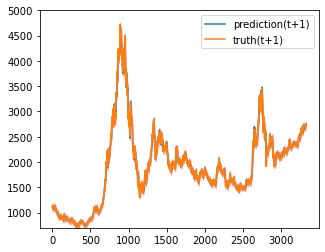

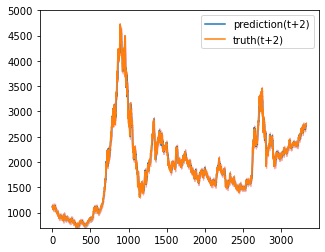

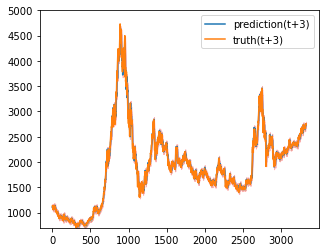

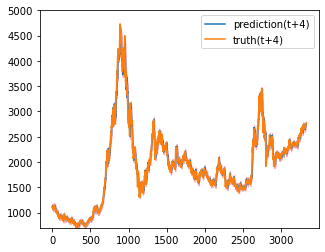

Train epoch:60 	Loss: -18.512968| Loss_in: 0.012561| Loss_out: 0.011141


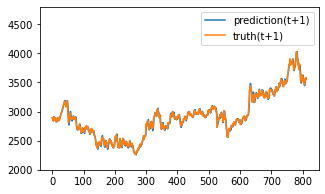

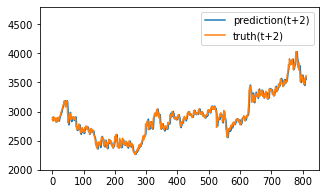

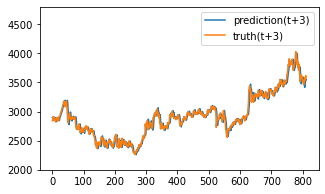

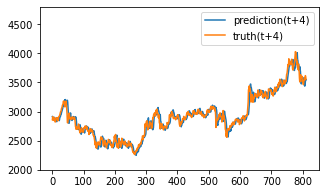

Test epoch:60 	Loss: 0.175950

Epoch: 61


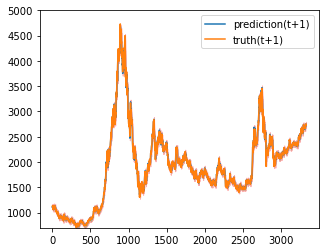

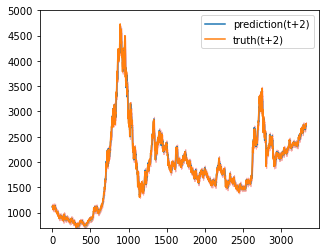

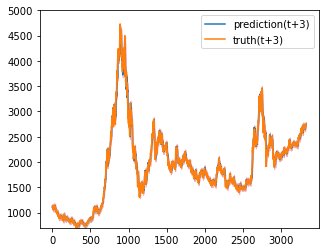

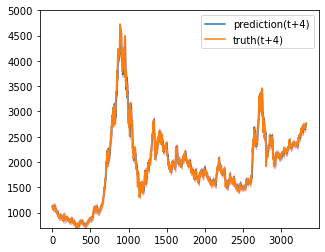

Train epoch:61 	Loss: -18.517867| Loss_in: 0.012502| Loss_out: 0.011034


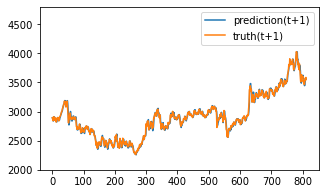

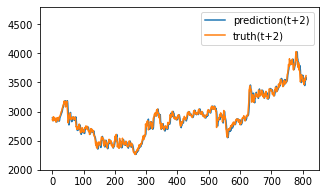

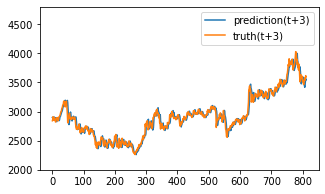

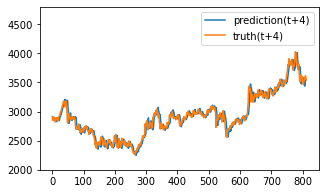

Test epoch:61 	Loss: 0.175920

Epoch: 62


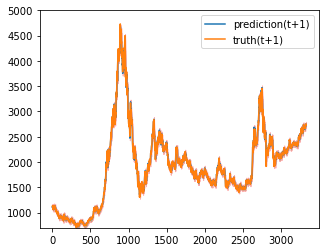

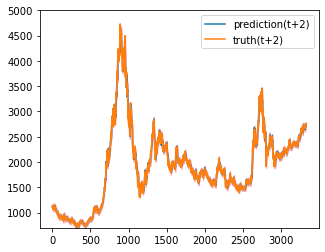

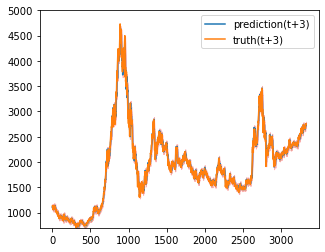

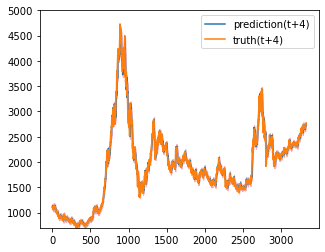

Train epoch:62 	Loss: -18.523107| Loss_in: 0.012379| Loss_out: 0.010760


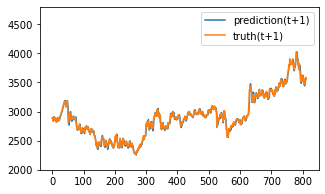

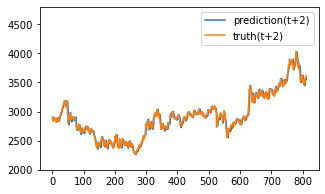

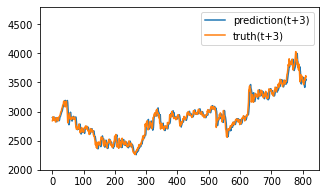

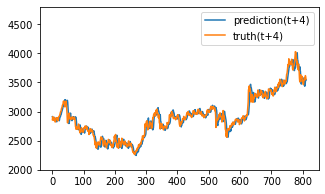

Test epoch:62 	Loss: 0.176040

Epoch: 63


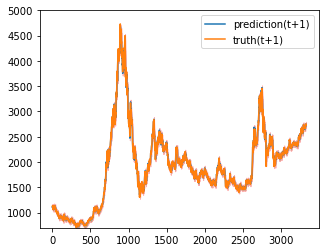

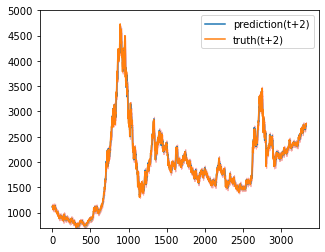

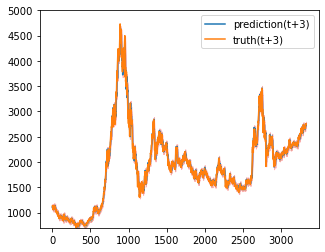

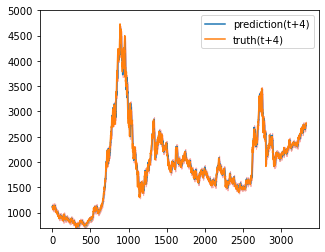

Train epoch:63 	Loss: -18.527786| Loss_in: 0.012280| Loss_out: 0.010944


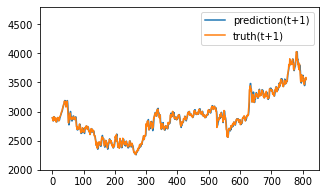

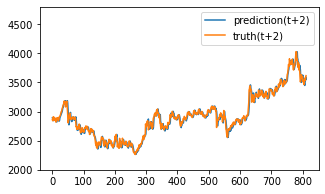

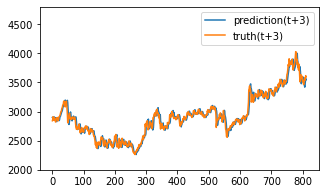

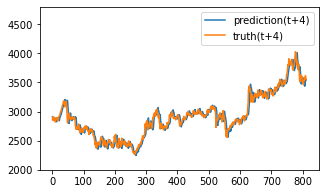

Test epoch:63 	Loss: 0.175755

Epoch: 64


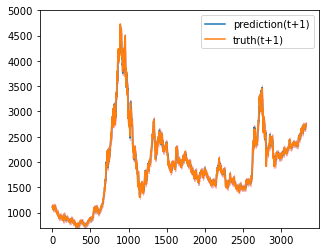

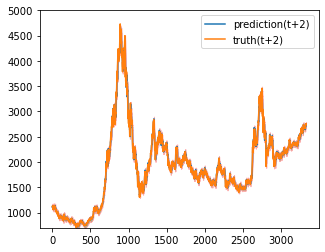

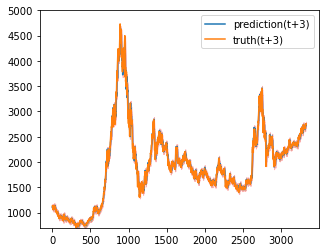

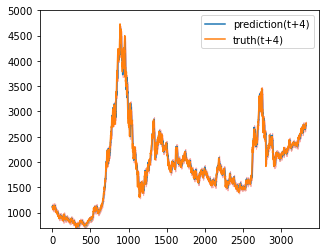

Train epoch:64 	Loss: -18.528334| Loss_in: 0.012210| Loss_out: 0.010509


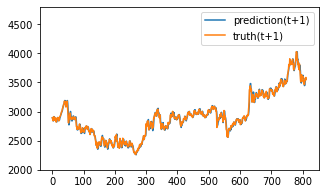

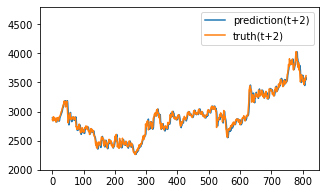

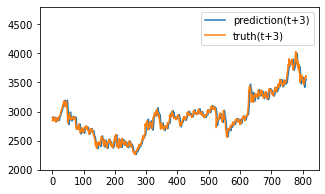

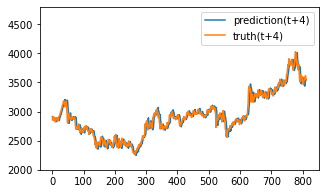

Test epoch:64 	Loss: 0.175717

Epoch: 65


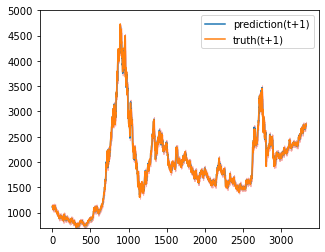

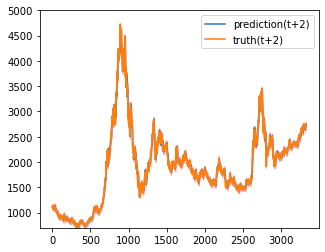

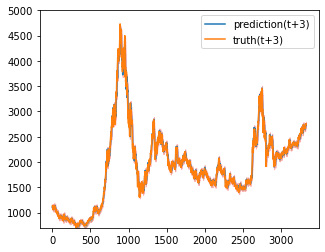

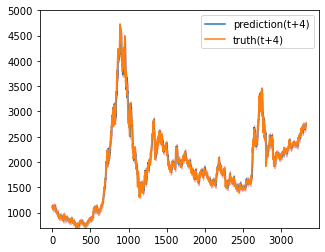

Train epoch:65 	Loss: -18.537276| Loss_in: 0.012116| Loss_out: 0.010720


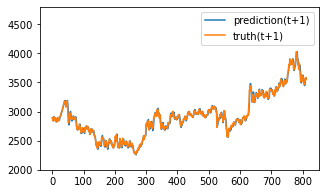

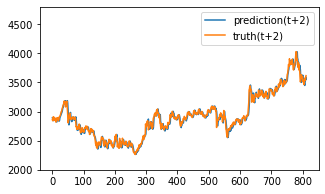

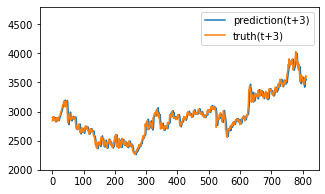

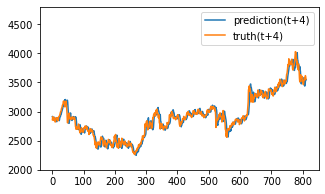

Test epoch:65 	Loss: 0.175619

Epoch: 66


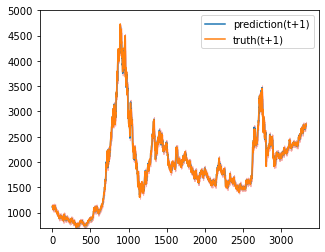

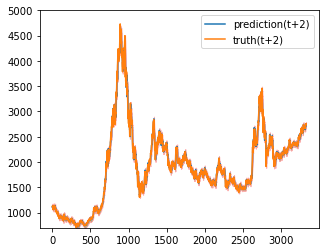

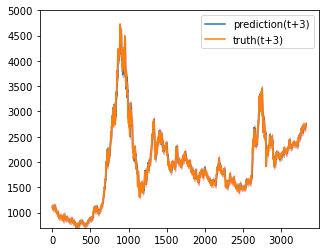

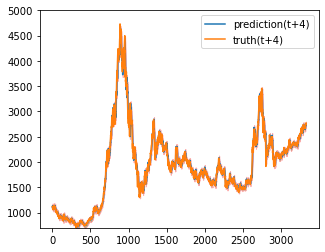

Train epoch:66 	Loss: -18.541272| Loss_in: 0.012036| Loss_out: 0.010482


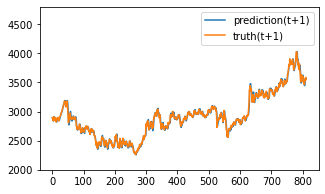

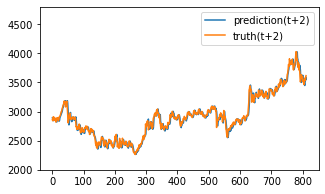

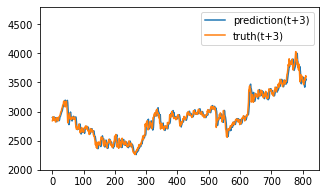

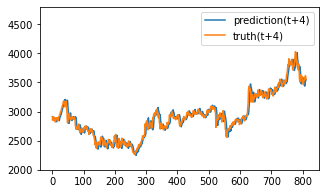

Test epoch:66 	Loss: 0.175594

Epoch: 67


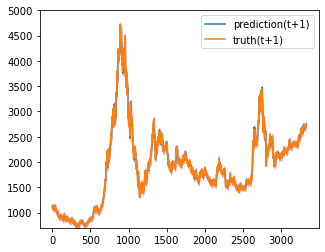

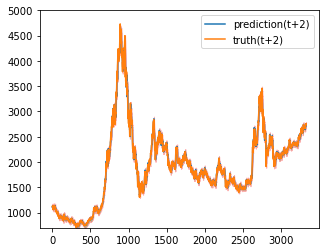

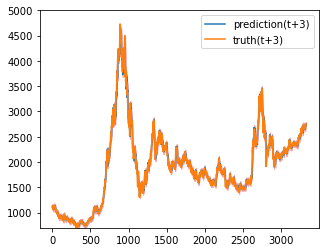

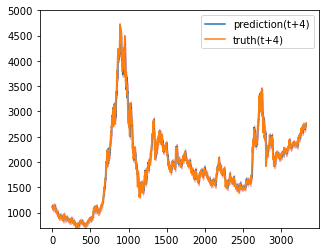

Train epoch:67 	Loss: -18.546054| Loss_in: 0.011928| Loss_out: 0.010592


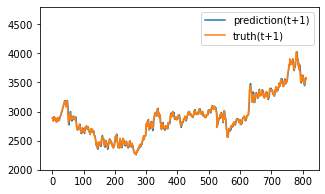

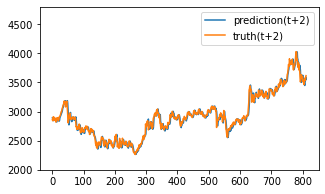

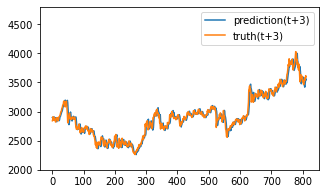

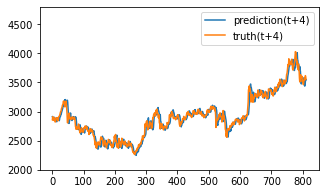

Test epoch:67 	Loss: 0.175530

Epoch: 68


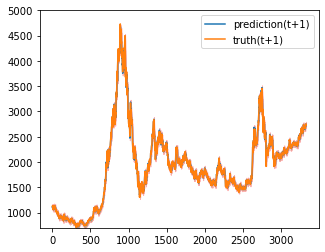

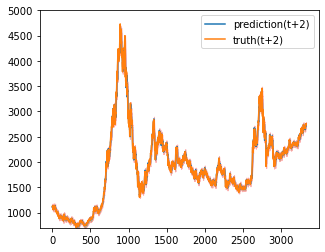

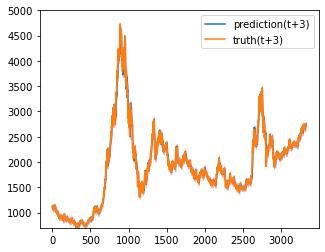

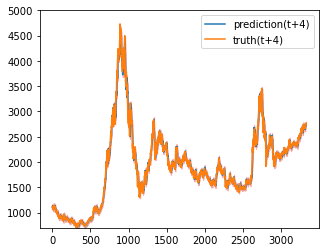

Train epoch:68 	Loss: -18.549755| Loss_in: 0.011882| Loss_out: 0.010512


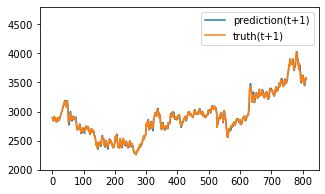

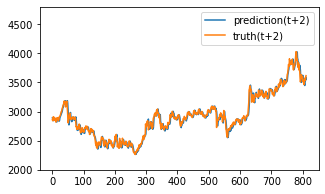

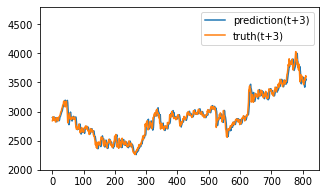

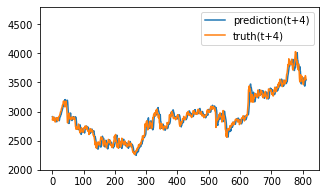

Test epoch:68 	Loss: 0.175492

Epoch: 69


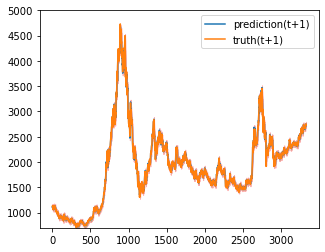

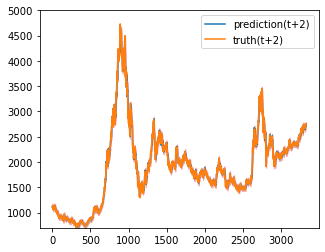

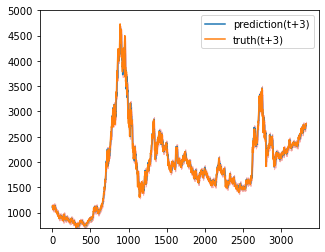

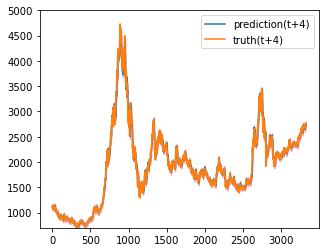

Train epoch:69 	Loss: -18.549317| Loss_in: 0.011818| Loss_out: 0.010589


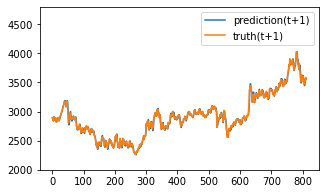

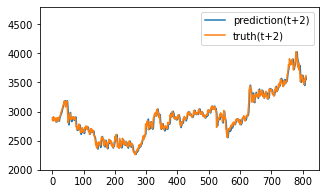

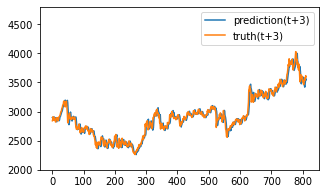

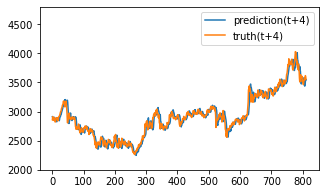

Test epoch:69 	Loss: 0.175453

Epoch: 70


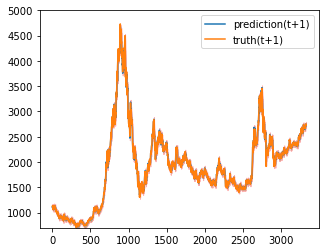

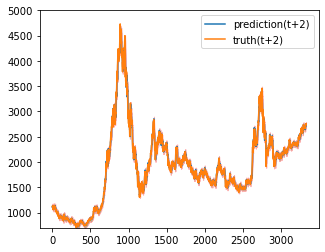

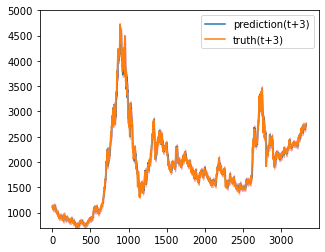

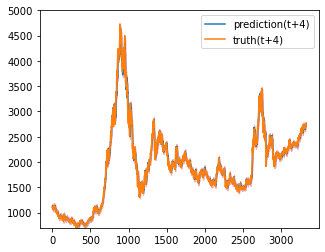

Train epoch:70 	Loss: -18.555537| Loss_in: 0.011766| Loss_out: 0.010480


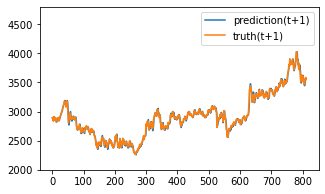

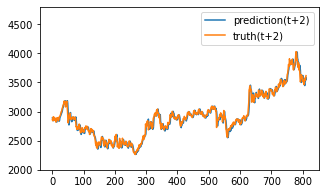

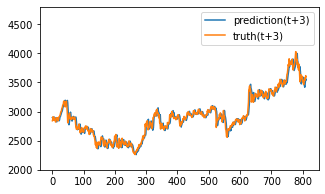

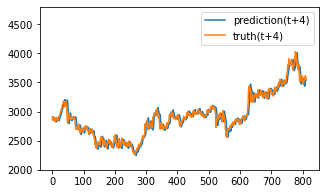

Test epoch:70 	Loss: 0.175520

Epoch: 71


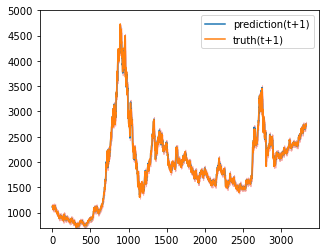

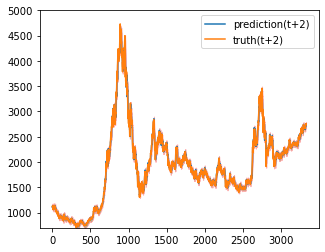

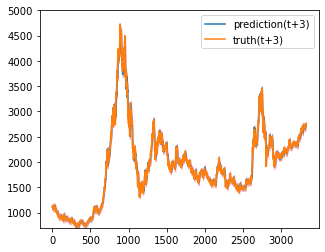

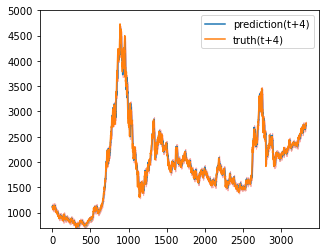

Train epoch:71 	Loss: -18.557251| Loss_in: 0.011721| Loss_out: 0.010321


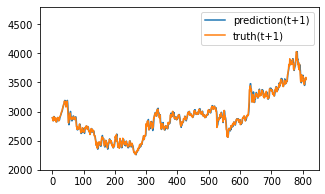

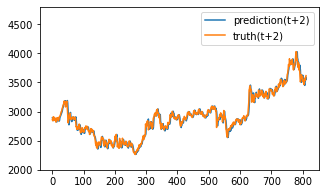

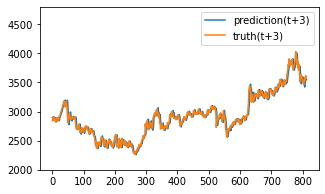

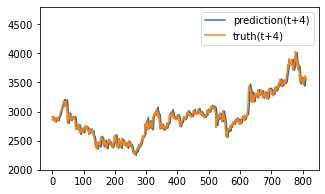

Test epoch:71 	Loss: 0.175249

Epoch: 72


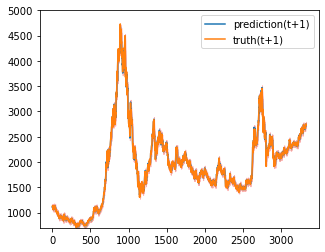

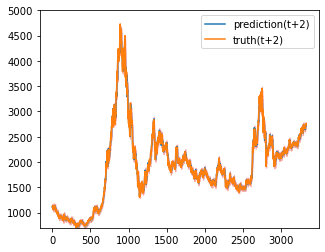

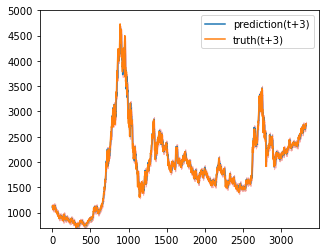

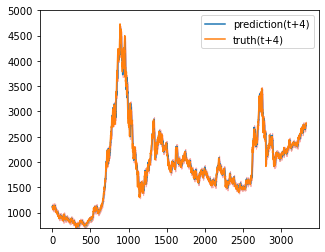

Train epoch:72 	Loss: -18.564762| Loss_in: 0.011632| Loss_out: 0.010165


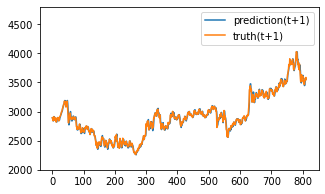

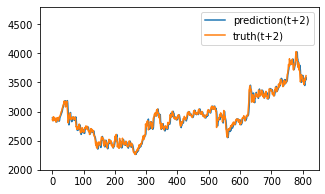

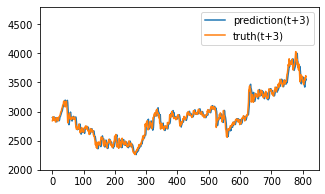

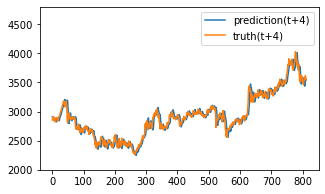

Test epoch:72 	Loss: 0.175277

Epoch: 73


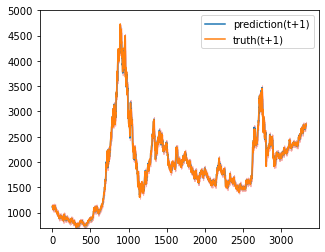

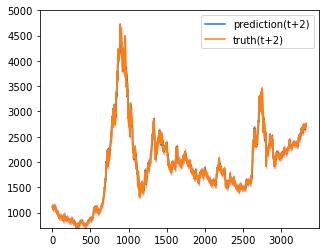

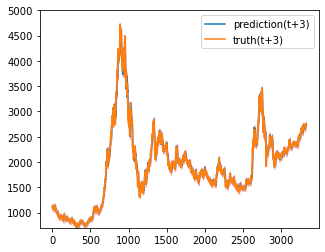

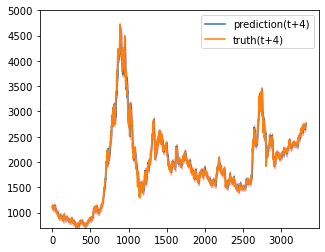

Train epoch:73 	Loss: -18.569099| Loss_in: 0.011538| Loss_out: 0.010171


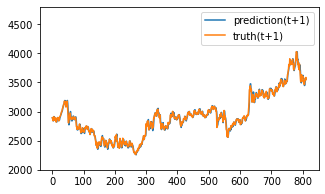

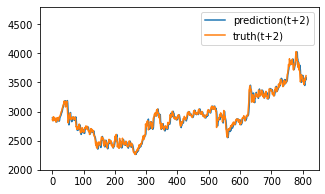

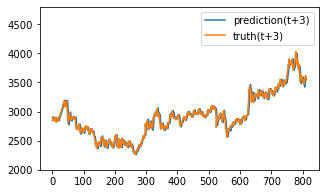

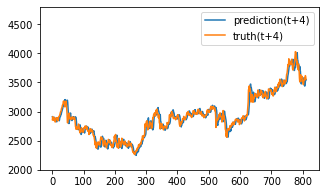

Test epoch:73 	Loss: 0.175225

Epoch: 74


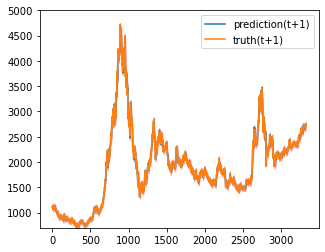

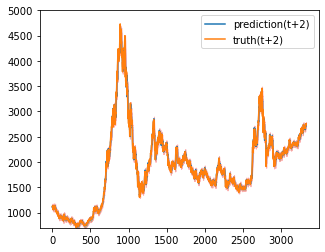

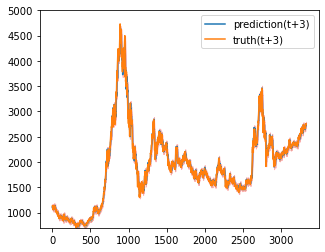

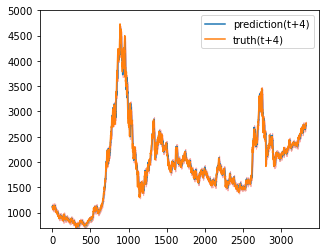

Train epoch:74 	Loss: -18.572634| Loss_in: 0.011461| Loss_out: 0.010214


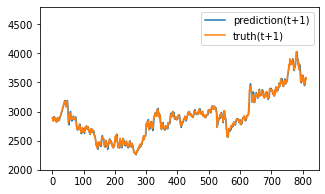

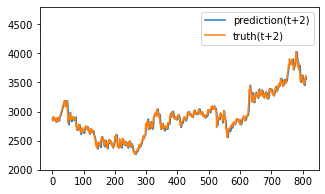

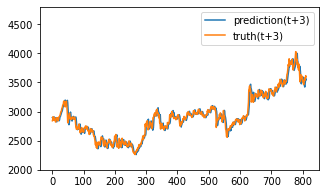

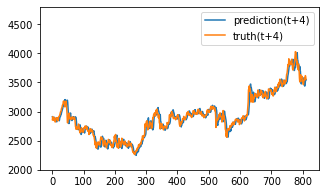

Test epoch:74 	Loss: 0.175144

Epoch: 75


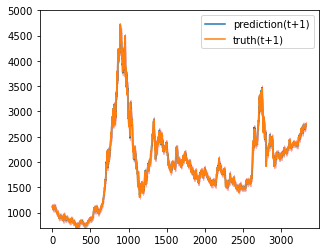

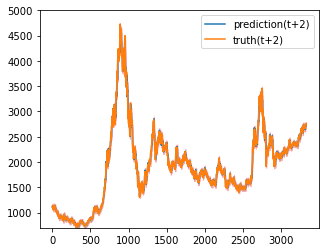

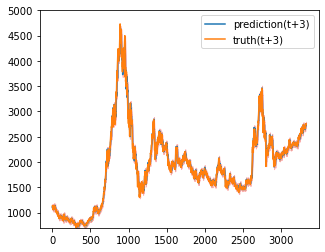

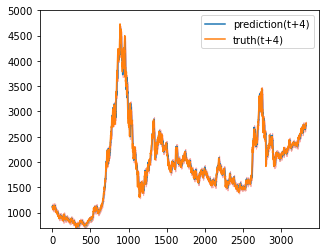

Train epoch:75 	Loss: -18.576580| Loss_in: 0.011405| Loss_out: 0.010014


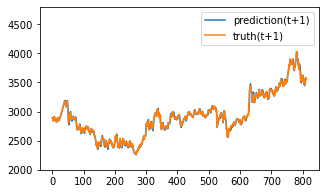

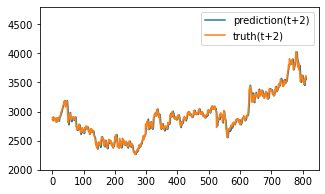

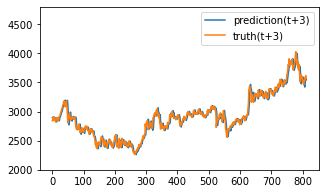

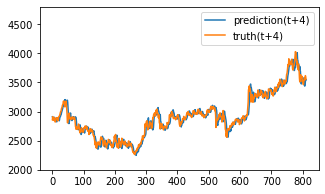

Test epoch:75 	Loss: 0.175133

Epoch: 76


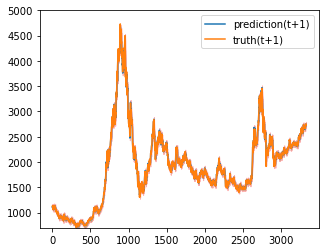

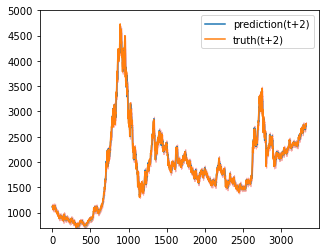

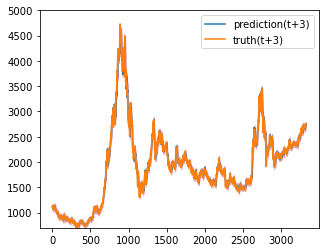

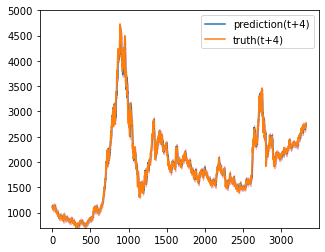

Train epoch:76 	Loss: -18.580122| Loss_in: 0.011313| Loss_out: 0.009947


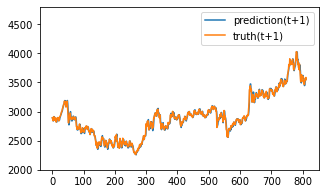

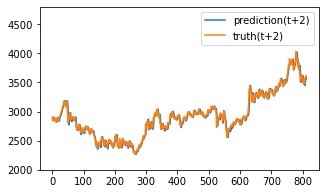

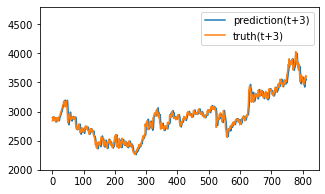

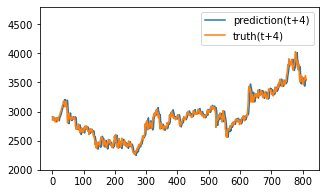

Test epoch:76 	Loss: 0.175091

Epoch: 77


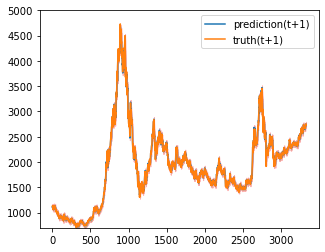

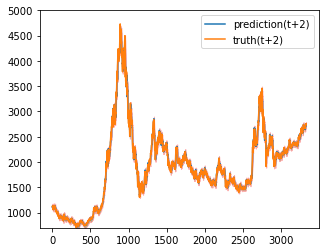

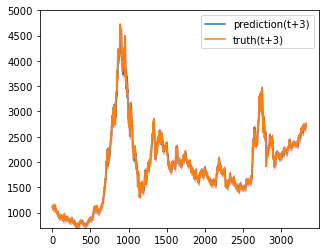

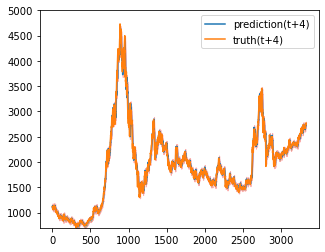

Train epoch:77 	Loss: -18.582261| Loss_in: 0.011266| Loss_out: 0.010092


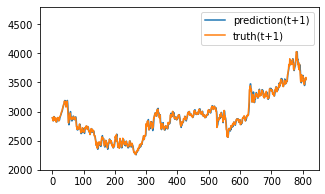

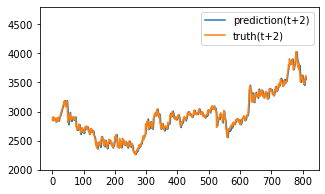

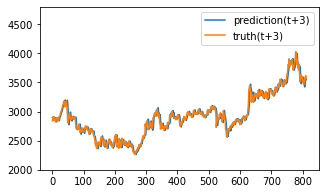

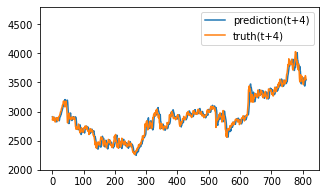

Test epoch:77 	Loss: 0.174962

Epoch: 78


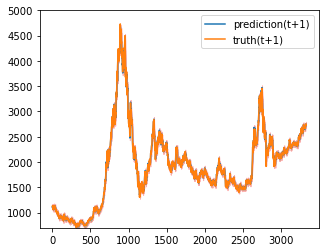

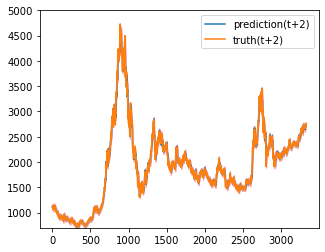

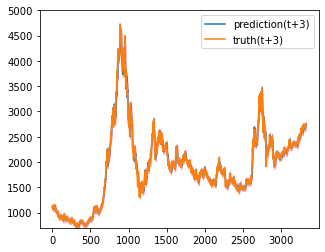

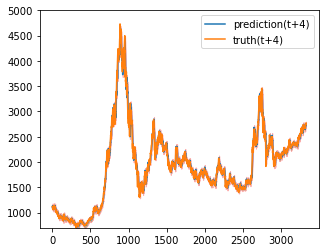

Train epoch:78 	Loss: -18.584435| Loss_in: 0.011243| Loss_out: 0.009862


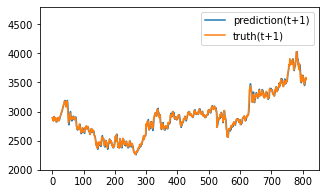

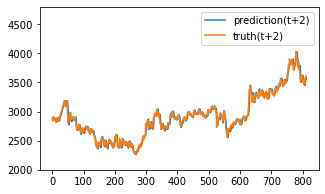

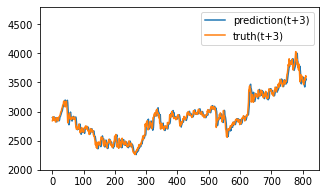

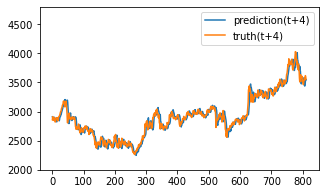

Test epoch:78 	Loss: 0.174933

Epoch: 79


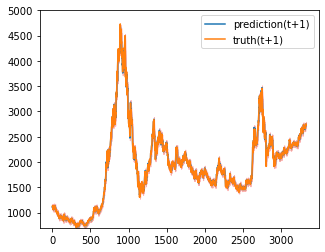

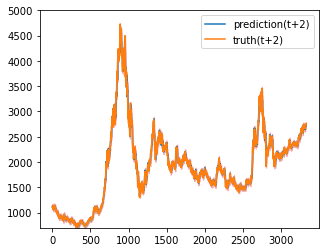

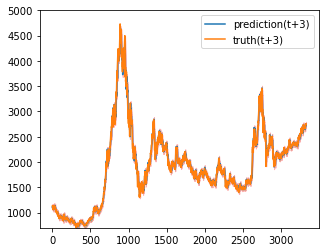

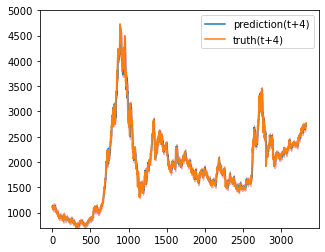

Train epoch:79 	Loss: -18.584698| Loss_in: 0.011149| Loss_out: 0.009929


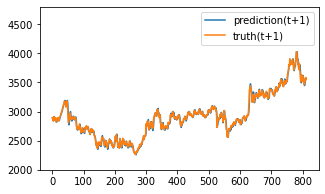

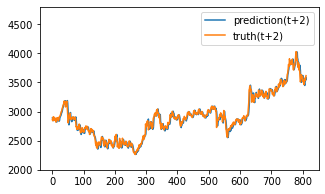

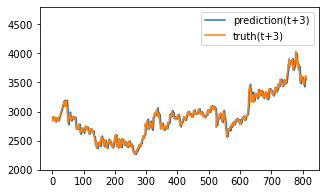

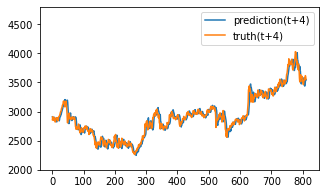

Test epoch:79 	Loss: 0.174904

Epoch: 80


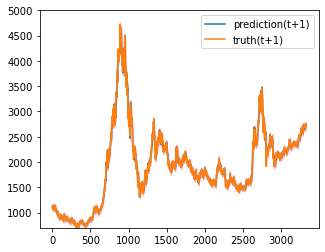

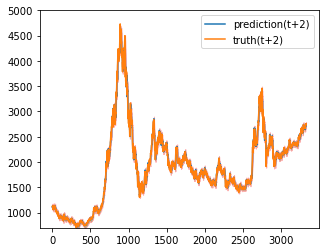

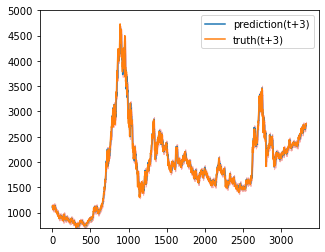

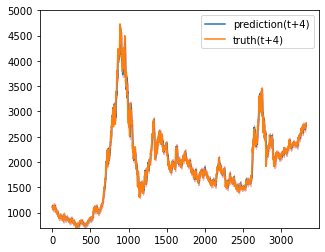

Train epoch:80 	Loss: -18.592222| Loss_in: 0.011109| Loss_out: 0.009945


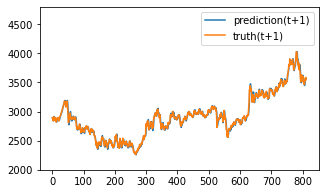

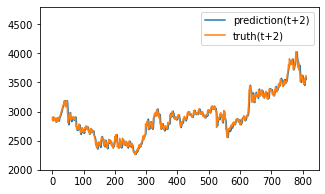

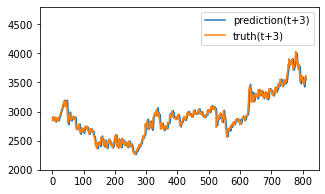

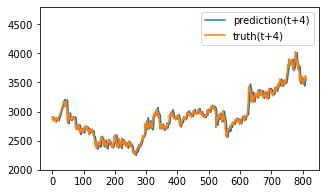

Test epoch:80 	Loss: 0.174860

Epoch: 81


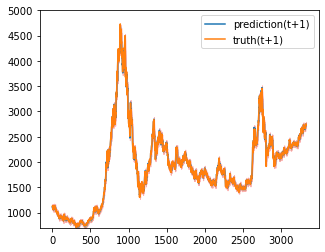

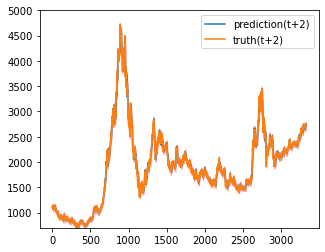

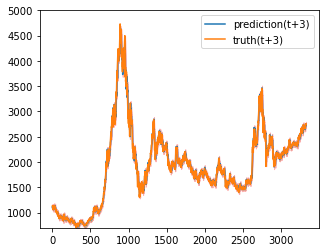

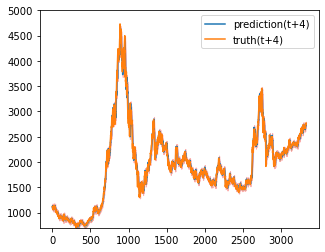

Train epoch:81 	Loss: -18.589943| Loss_in: 0.011096| Loss_out: 0.010041


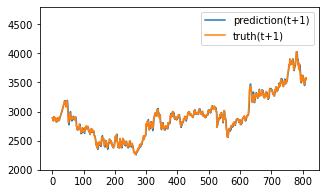

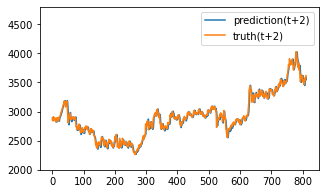

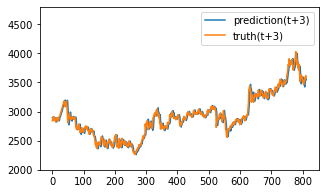

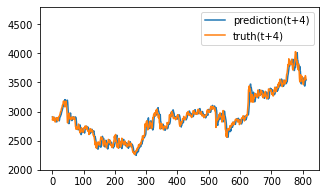

Test epoch:81 	Loss: 0.174840

Epoch: 82


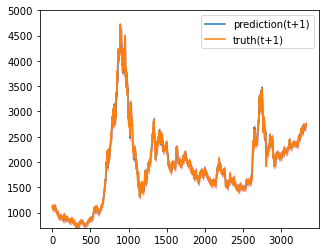

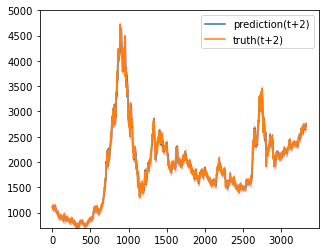

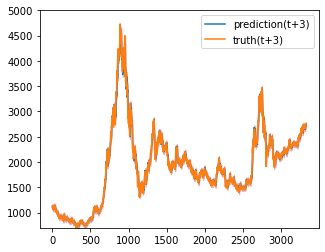

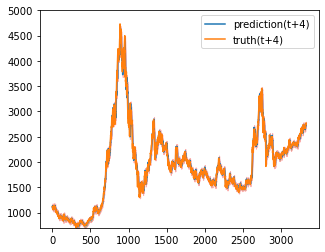

Train epoch:82 	Loss: -18.598663| Loss_in: 0.011053| Loss_out: 0.009789


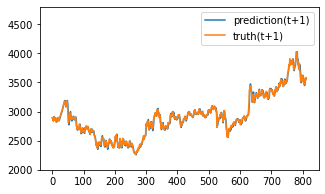

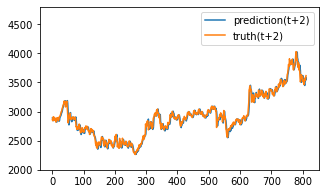

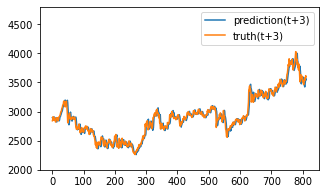

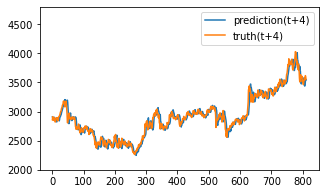

Test epoch:82 	Loss: 0.174813

Epoch: 83


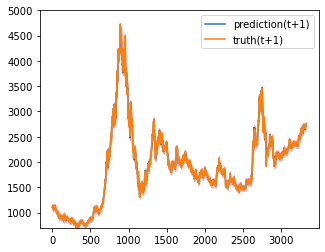

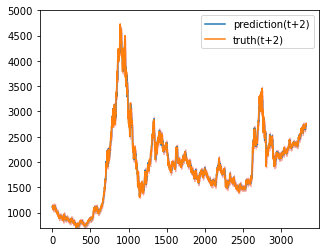

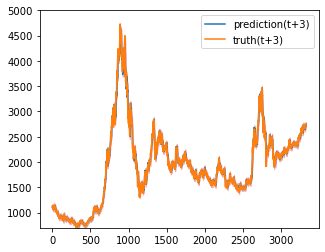

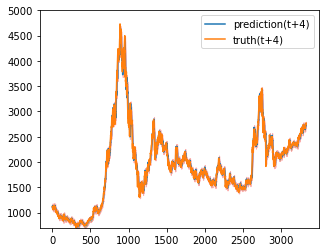

Train epoch:83 	Loss: -18.601633| Loss_in: 0.010986| Loss_out: 0.009550


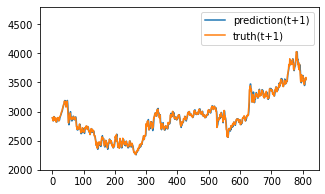

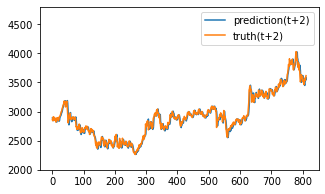

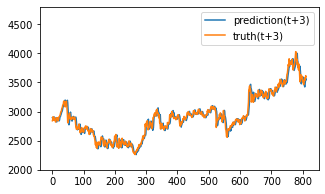

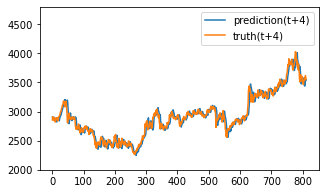

Test epoch:83 	Loss: 0.174764

Epoch: 84


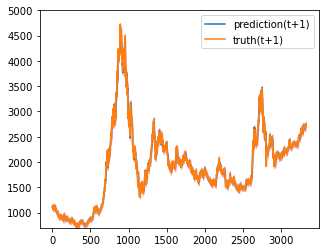

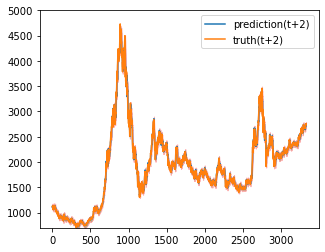

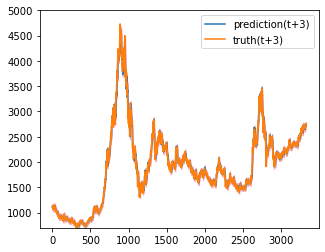

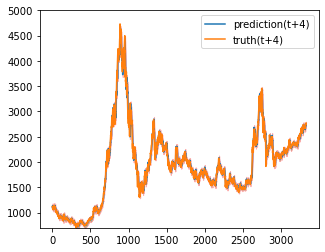

Train epoch:84 	Loss: -18.605343| Loss_in: 0.010906| Loss_out: 0.009540


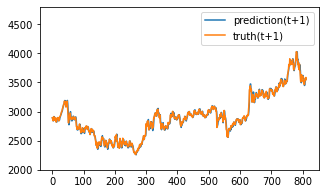

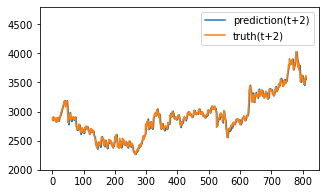

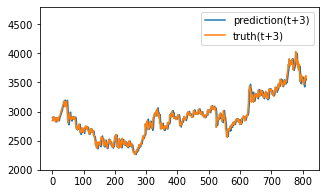

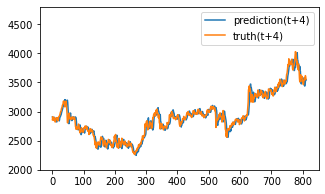

Test epoch:84 	Loss: 0.174707

Epoch: 85


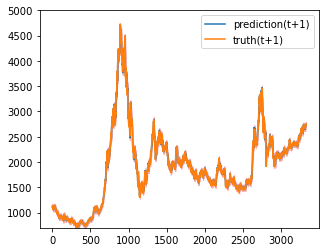

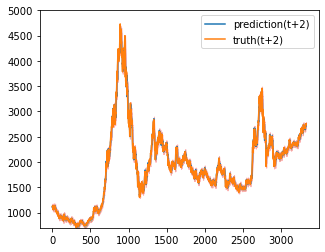

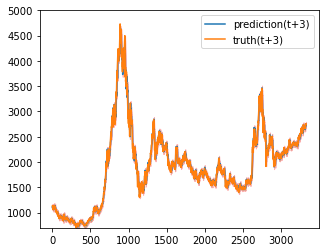

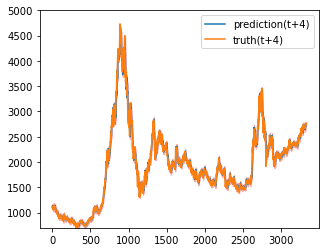

Train epoch:85 	Loss: -18.607331| Loss_in: 0.010869| Loss_out: 0.009881


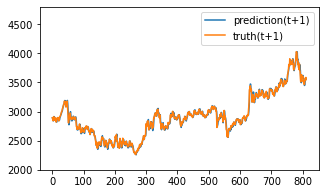

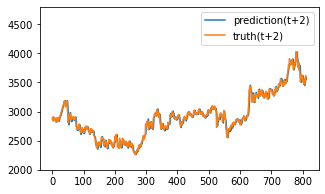

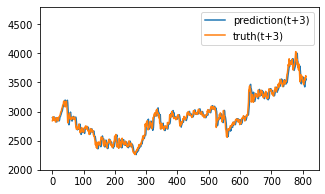

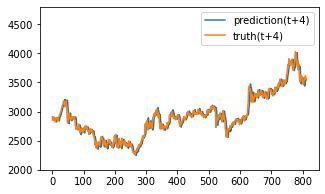

Test epoch:85 	Loss: 0.174653

Epoch: 86


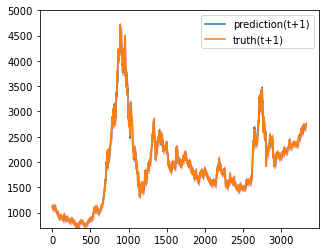

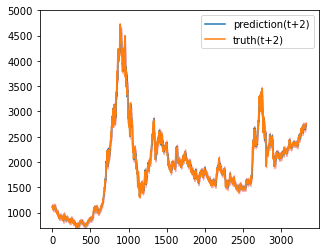

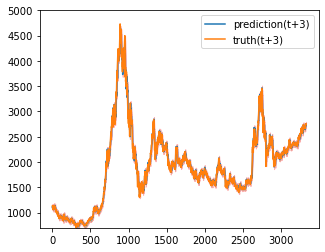

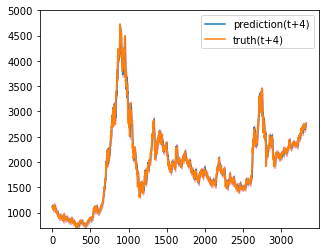

Train epoch:86 	Loss: -18.611344| Loss_in: 0.010870| Loss_out: 0.009650


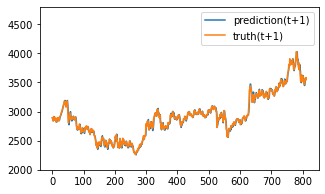

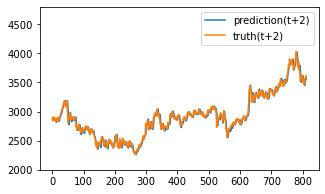

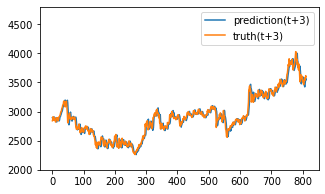

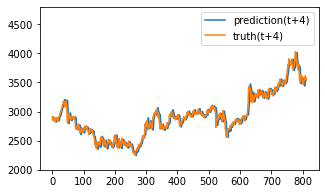

Test epoch:86 	Loss: 0.174630

Epoch: 87


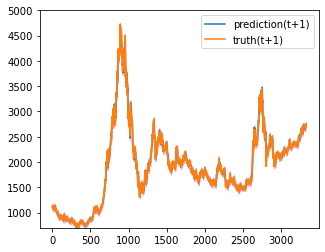

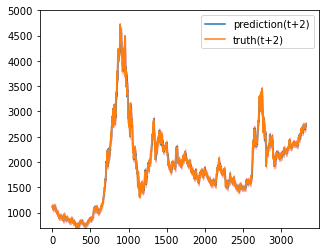

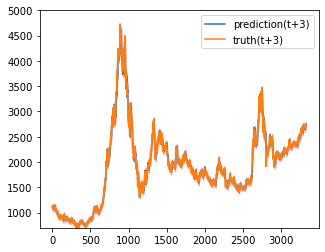

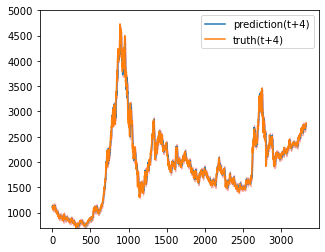

Train epoch:87 	Loss: -18.614043| Loss_in: 0.010840| Loss_out: 0.009687


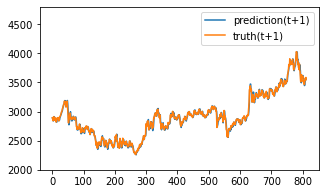

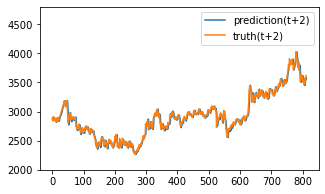

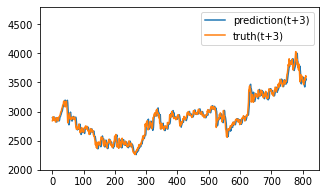

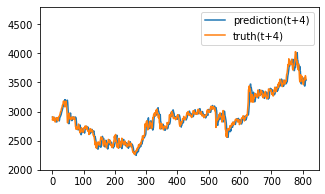

Test epoch:87 	Loss: 0.174672

Epoch: 88


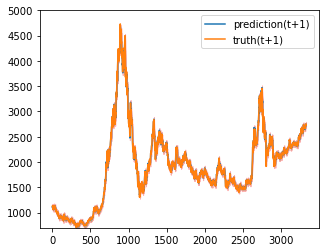

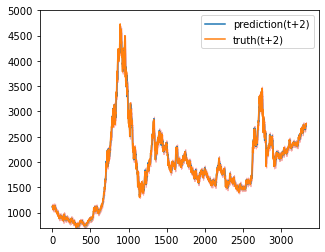

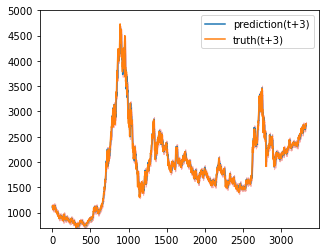

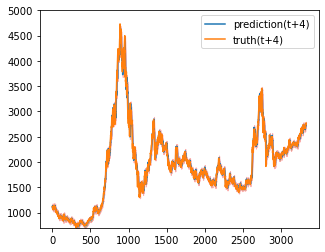

Train epoch:88 	Loss: -18.616858| Loss_in: 0.010792| Loss_out: 0.009663


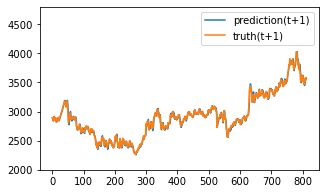

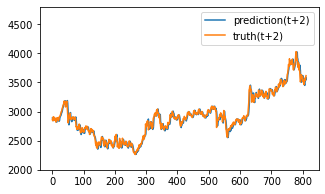

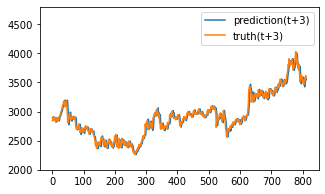

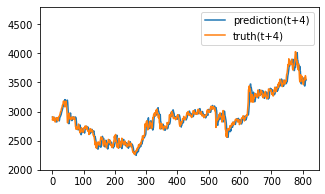

Test epoch:88 	Loss: 0.174535

Epoch: 89


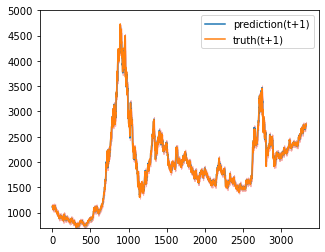

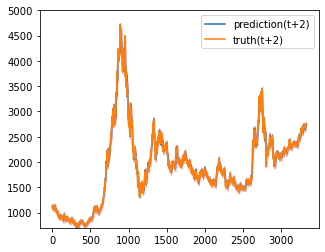

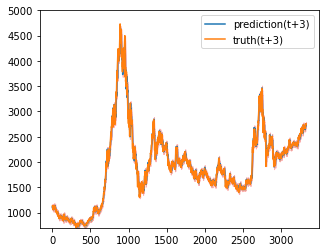

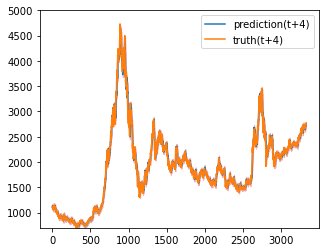

Train epoch:89 	Loss: -18.618943| Loss_in: 0.010737| Loss_out: 0.009428


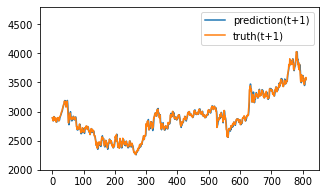

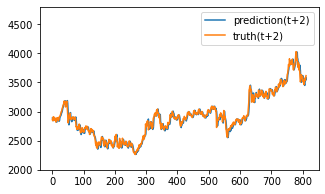

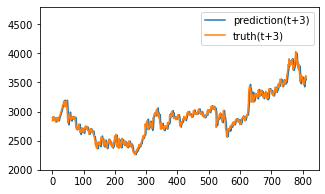

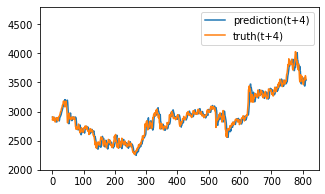

Test epoch:89 	Loss: 0.174537

Epoch: 90


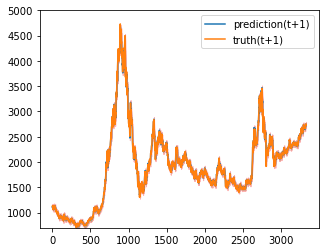

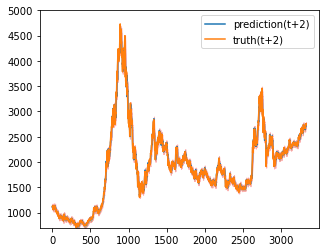

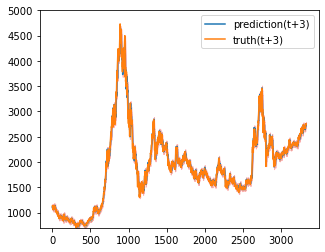

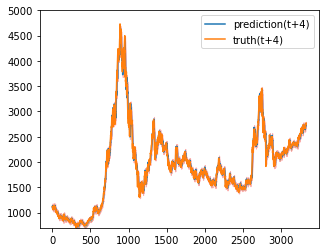

Train epoch:90 	Loss: -18.622778| Loss_in: 0.010685| Loss_out: 0.009342


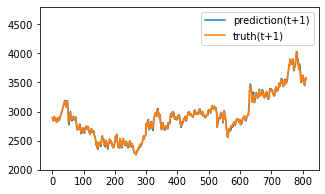

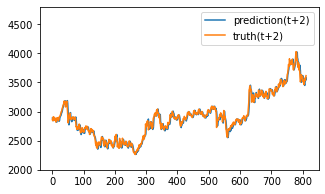

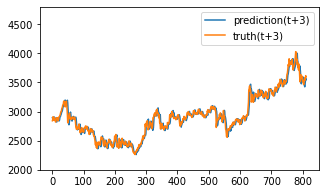

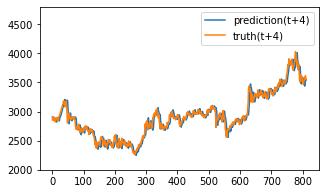

Test epoch:90 	Loss: 0.174471

Epoch: 91


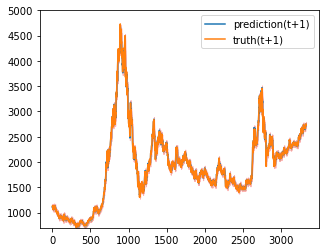

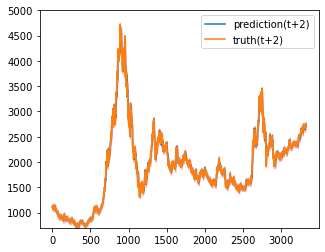

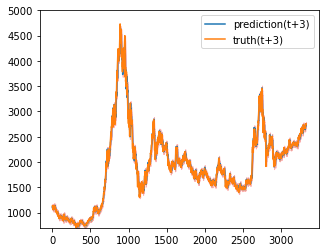

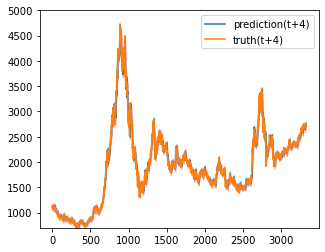

Train epoch:91 	Loss: -18.625617| Loss_in: 0.010638| Loss_out: 0.009568


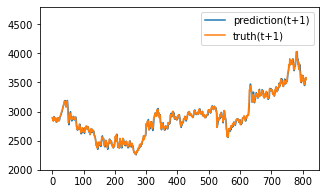

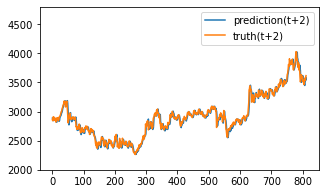

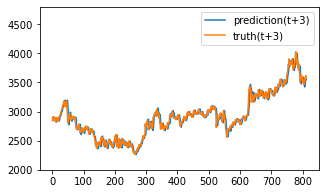

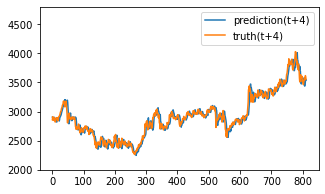

Test epoch:91 	Loss: 0.174524

Epoch: 92


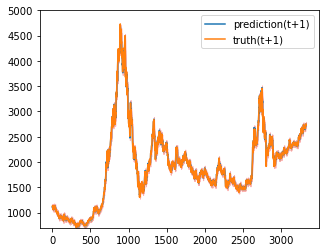

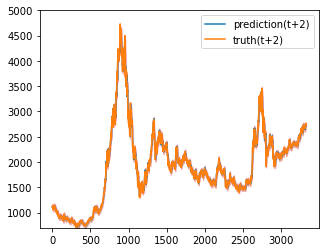

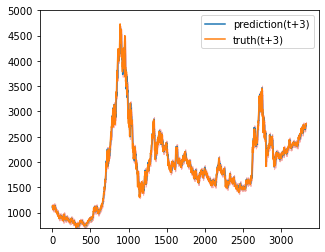

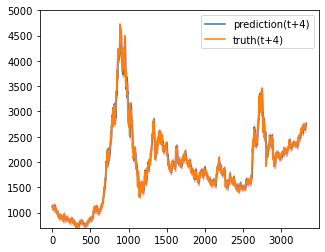

Train epoch:92 	Loss: -18.628032| Loss_in: 0.010615| Loss_out: 0.009531


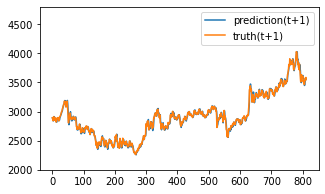

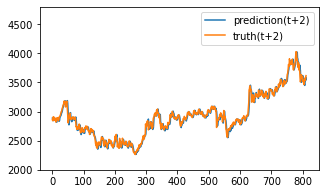

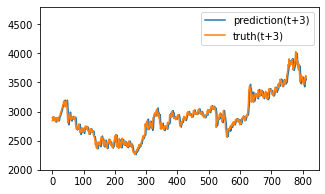

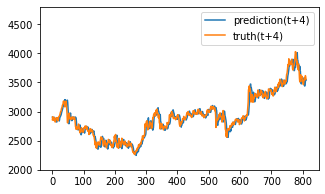

Test epoch:92 	Loss: 0.174427

Epoch: 93


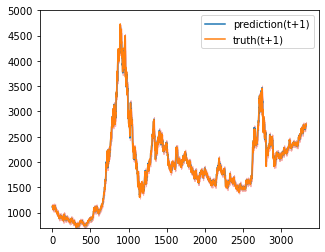

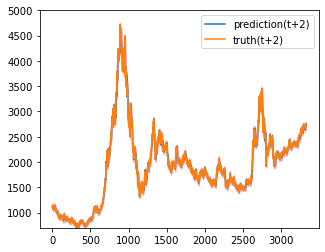

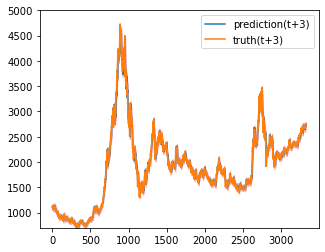

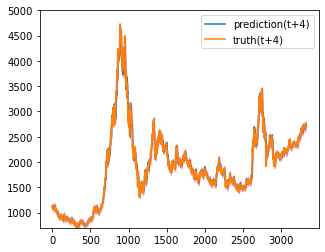

Train epoch:93 	Loss: -18.617996| Loss_in: 0.010613| Loss_out: 0.009560


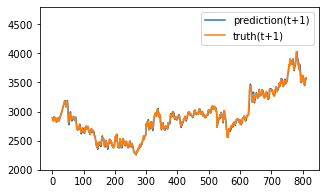

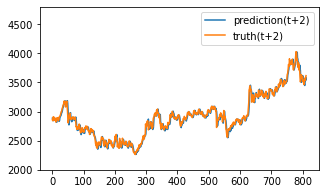

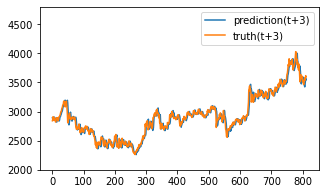

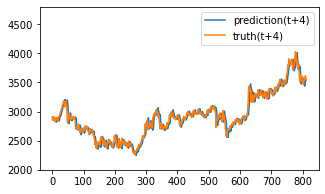

Test epoch:93 	Loss: 0.174484

Epoch: 94


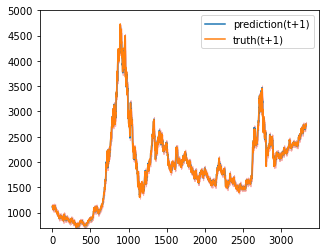

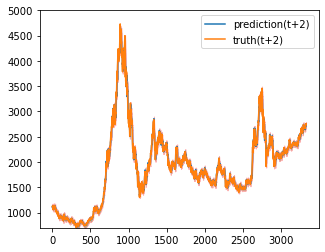

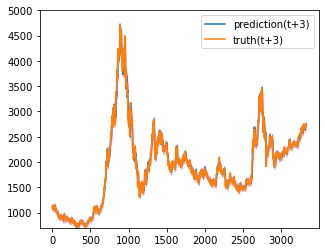

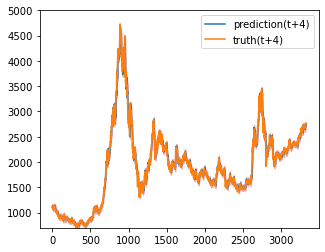

Train epoch:94 	Loss: -18.632316| Loss_in: 0.010578| Loss_out: 0.009240


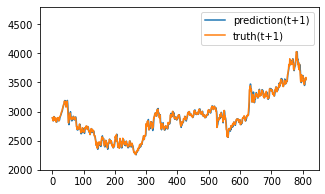

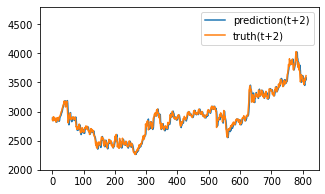

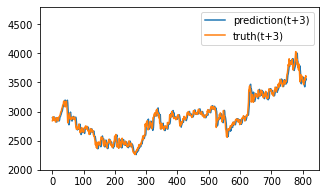

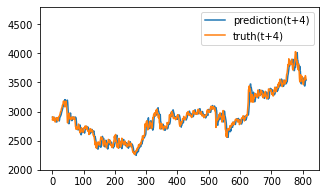

Test epoch:94 	Loss: 0.174300

Epoch: 95


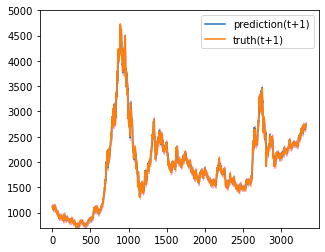

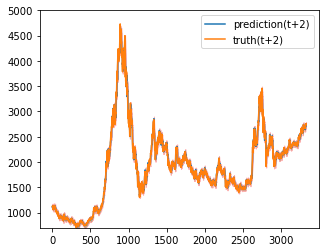

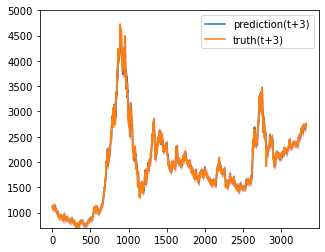

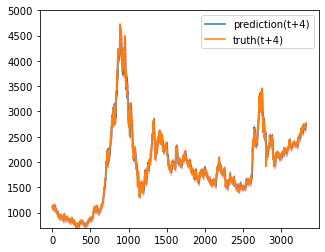

Train epoch:95 	Loss: -18.635824| Loss_in: 0.010544| Loss_out: 0.009510


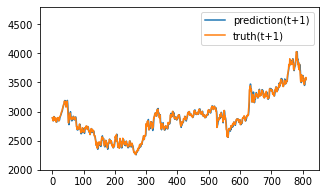

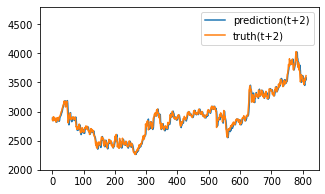

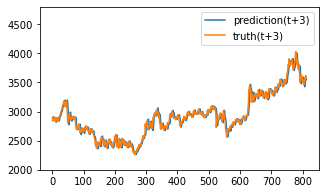

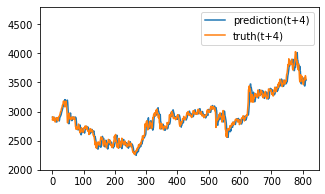

Test epoch:95 	Loss: 0.174265

Epoch: 96


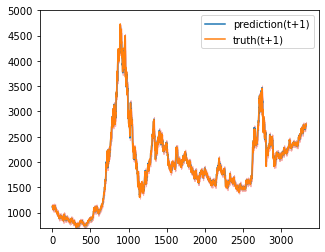

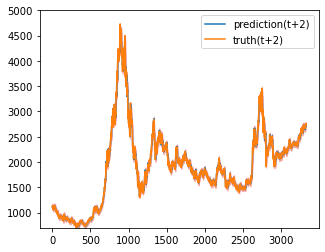

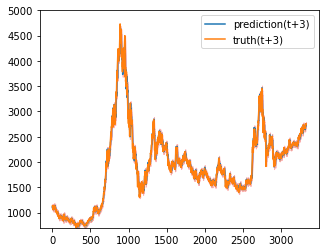

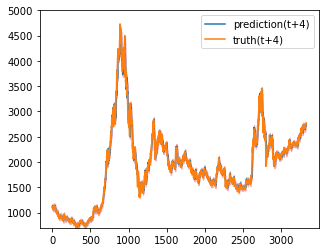

Train epoch:96 	Loss: -18.637889| Loss_in: 0.010487| Loss_out: 0.009160


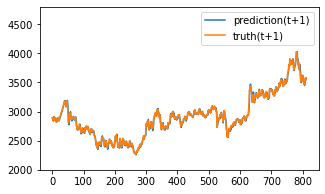

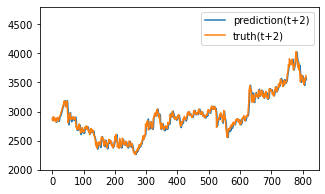

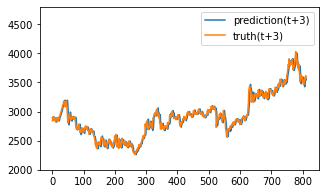

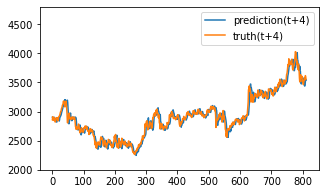

Test epoch:96 	Loss: 0.174308

Epoch: 97


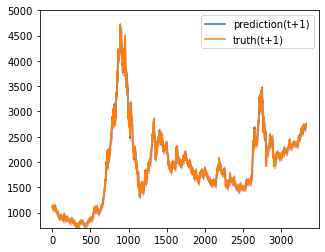

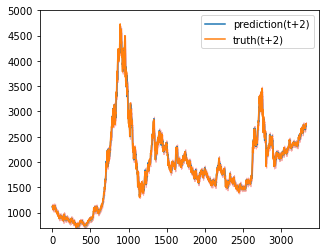

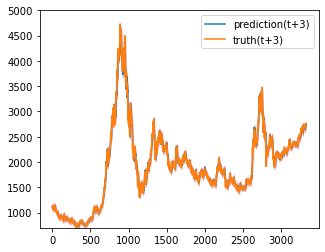

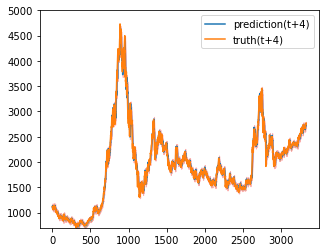

Train epoch:97 	Loss: -18.639439| Loss_in: 0.010440| Loss_out: 0.009256


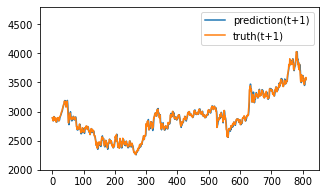

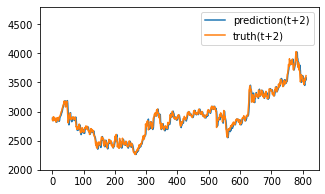

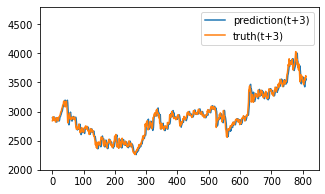

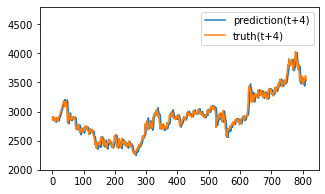

Test epoch:97 	Loss: 0.174255

Epoch: 98


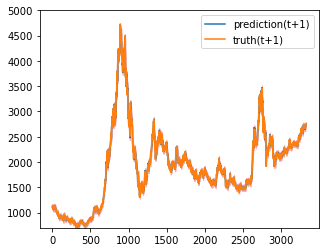

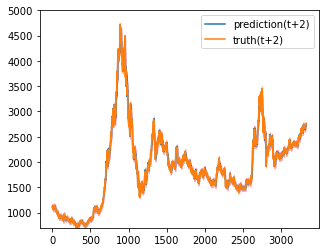

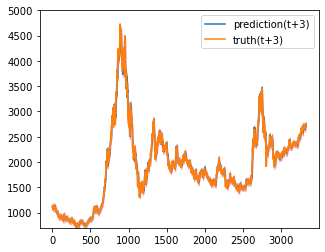

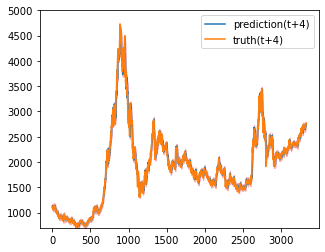

Train epoch:98 	Loss: -18.643179| Loss_in: 0.010414| Loss_out: 0.009267


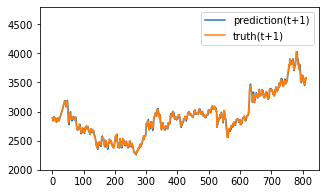

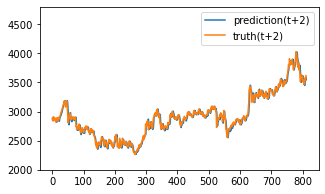

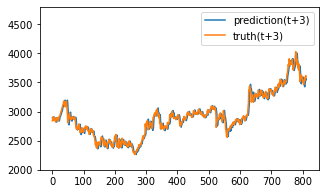

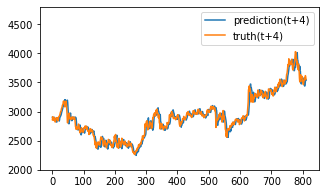

Test epoch:98 	Loss: 0.174214

Epoch: 99


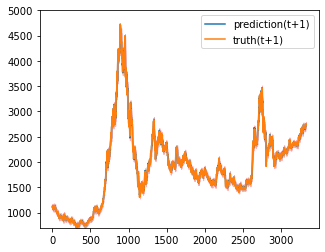

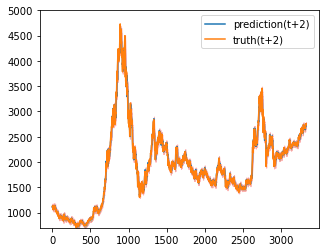

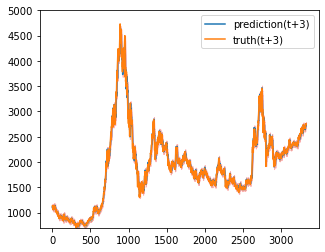

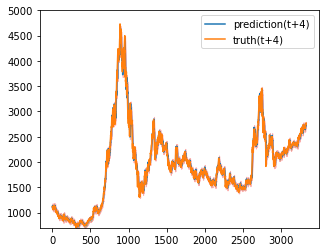

Train epoch:99 	Loss: -18.645669| Loss_in: 0.010384| Loss_out: 0.009303


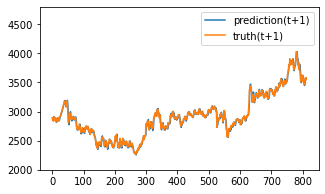

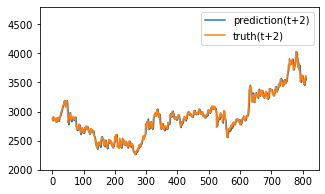

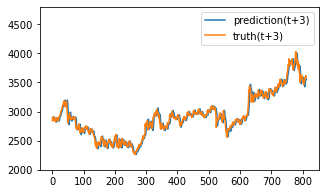

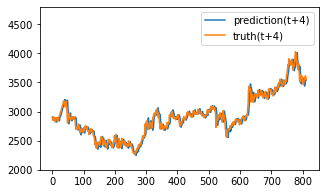

Test epoch:99 	Loss: 0.174186

Epoch: 100


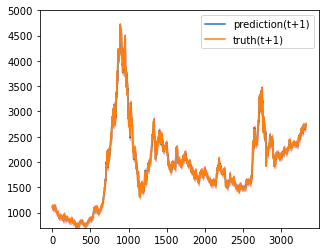

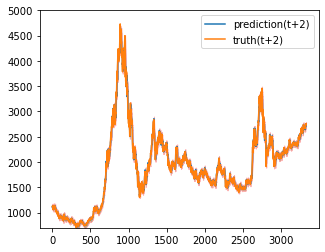

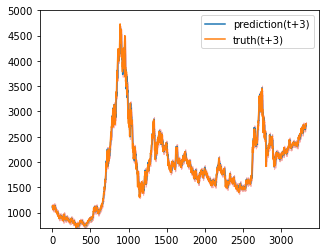

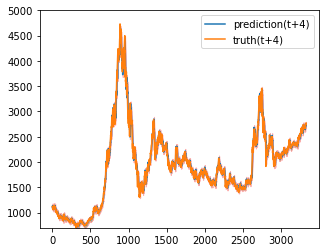

Train epoch:100 	Loss: -18.647464| Loss_in: 0.010346| Loss_out: 0.009083


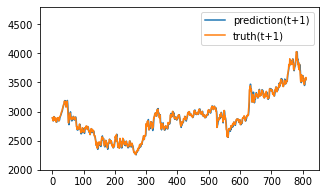

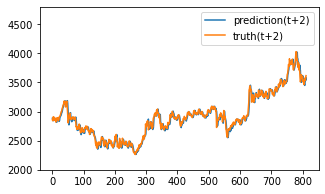

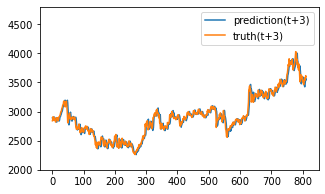

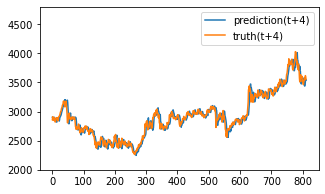

Test epoch:100 	Loss: 0.174196


In [49]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

In [50]:
train_losses

[(0.028324995, 0.28230867, 0.08836508, 0.04023774),
 (0.0243567, 0.07479038, 0.03471767, 0.031199383),
 (0.01952141, 0.042101994, 0.029205319, 0.026006801),
 (0.015201692, 0.032670543, 0.024336366, 0.022354905),
 (0.012532993, 0.023286544, 0.018932723, 0.019724106),
 (0.010780821, 0.017150173, 0.016209982, 0.018318476),
 (0.009656344, 0.012937641, 0.014095033, 0.01744262),
 (0.010098583, 0.012994187, 0.014150158, 0.017308386),
 (0.010041667, 0.011458145, 0.013092324, 0.018450487),
 (0.0076030954, 0.010152403, 0.012529174, 0.01602978),
 (0.006339675, 0.008927738, 0.011412278, 0.015087555),
 (0.0053484, 0.008288786, 0.010821004, 0.014549455),
 (0.0049261167, 0.008359778, 0.010891039, 0.015036076),
 (0.0043492387, 0.0074427607, 0.010042573, 0.013615084),
 (0.040083073, 0.010410263, 0.017446186, 0.01370822),
 (0.18275258, 0.0149779515, 0.015955724, 0.01585687),
 (0.032010823, 0.0072714332, 0.0101235695, 0.013360637),
 (0.008063536, 0.0068953414, 0.009685271, 0.012877607),
 (0.0037576545, 0

In [51]:
test_losses

[(0.038064133, 0.51888263, 0.13156633, 0.02800919),
 (0.018076455, 0.12004119, 0.025591183, 0.021166481),
 (0.014521802, 0.028005736, 0.022318194, 0.018835617),
 (0.012220179, 0.024629101, 0.017726446, 0.01892499),
 (0.010531439, 0.018153263, 0.015092824, 0.017407097),
 (0.009723569, 0.014046081, 0.013963979, 0.01718772),
 (0.009023213, 0.010856283, 0.012699806, 0.016585099),
 (0.011378401, 0.012428044, 0.014736922, 0.01677538),
 (0.008840452, 0.00942274, 0.012453566, 0.017854512),
 (0.0068378155, 0.009160351, 0.011505596, 0.015224555),
 (0.005900901, 0.008171787, 0.011050961, 0.0149952015),
 (0.005026321, 0.007543905, 0.010438501, 0.014231682),
 (0.0052928803, 0.0076672575, 0.010264879, 0.013816433),
 (0.004269884, 0.0072049536, 0.010171345, 0.013887006),
 (0.28504932, 0.033847272, 0.06096182, 0.02364363),
 (0.5463013, 0.023527954, 0.021760654, 0.016583787),
 (0.07475426, 0.0070081237, 0.009953003, 0.015029304),
 (0.011357025, 0.006586975, 0.009719139, 0.0139659485),
 (0.003975153, 0.

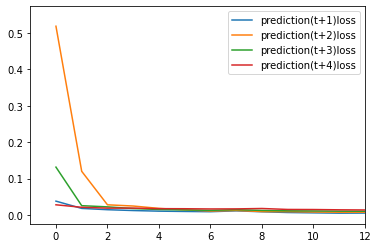

In [52]:
plt.plot(test_losses)
plt.xlim(-1,12)
plt.legend(('prediction(t+1)loss','prediction(t+2)loss','prediction(t+3)loss','prediction(t+4)loss'))
plt.show()

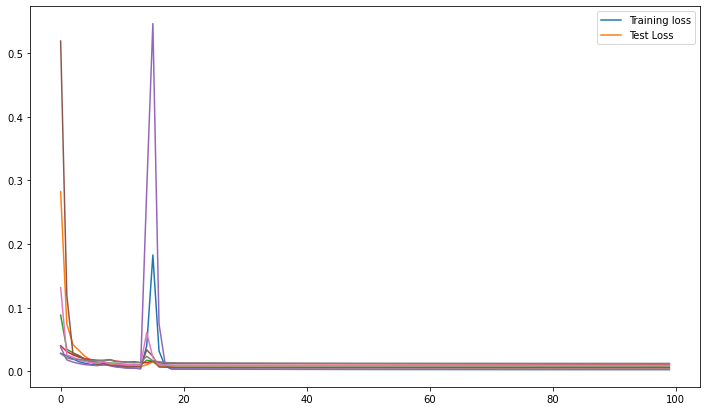

(0.0029414957, 0.0058058887, 0.009102607, 0.012494264)


In [53]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])

In [54]:
type(np.array(range(10)))

numpy.ndarray